# CS909 Assignment 2: Regression
### Student ID: 2024991

In [83]:
import numpy as np

import matplotlib.pyplot as plt
import pandas as pd

from skimage import data
from skimage.color import rgb2hed, hed2rgb

from scipy.stats import entropy
from scipy import stats
from math import log, e
from scipy.stats import pearsonr
from scipy.stats import spearmanr
from sklearn.decomposition import PCA

from skimage import exposure
import skimage
from matplotlib.colors import LinearSegmentedColormap
from skimage.exposure import rescale_intensity

from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import GridSearchCV 

from sklearn.model_selection import cross_val_score

from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import Normalizer

import os

from keras import backend
from keras.callbacks import EarlyStopping
from keras import backend as K
from keras.layers import Dropout
from keras.models import Sequential
from keras.layers import Dense, Conv2D, Flatten
from keras.layers import BatchNormalization
from keras.layers import MaxPooling2D
from keras.layers import Flatten
from functools import partial
import keras

from math import sqrt
from sklearn.metrics import mean_squared_error
import math

from sklearn.svm import SVR

from resnets_utils import *
from keras import applications
from keras.layers import Dense, Dropout, Flatten, Conv2D, MaxPool2D,GlobalAveragePooling2D
from keras.models import Model

In [84]:
#Set current working directory
cwd = os.getcwd()

In [85]:
#Import Fold0 - Train Set, Fold1 - Validation Set, Fold2 - Test Set
data = np.load("cell-data.npz")
images = data["images"]
counts = data["counts"]
folds = data["folds"]
X0 = images[folds == 0]
Y0 = counts[folds == 0]
X1 = images[folds == 1]
Y1 = counts[folds == 1]
X2 = images[folds == 2]
Y2 = counts[folds == 2]

# Question No. 1: (Data Analysis) [20 Marks]

### i. How many examples are there in each fold? [2 marks]

In this assignment, Fold 1 will be treated as the training set, Fold 2 as validation set, Fold3 as test set.

In [86]:
fold1_amt = counts[data["folds"] == 0].shape[0]
fold2_amt = counts[data["folds"] == 1].shape[0]
fold3_amt = counts[data["folds"] == 2].shape[0]

print("No of examples in Fold 1: ", fold1_amt)
print("No of examples in Fold 2: ", fold2_amt)
print("No of examples in Fold 3: ", fold3_amt)

No of examples in Fold 1:  827
No of examples in Fold 2:  749
No of examples in Fold 3:  775


### ii. Show some image examples using plt.imshow. Describe your observations on what you see in the images and how it correlates with the cell counts of different types of cells especially T1 cells. [2 marks]

In this experiment, for a low count of **T1** cells (less than 5) from Fold 0, the Grade was low meaning there is a low count of purple cells. As the T1 cell count was increased above 70, the nuclei marked in purple are more frequent (dominant over the healthy cells) with varying size and shape. More cells translates to more nuclei in the image. Hence, it can be stated that the number of nuclei in the image is **correlated** with the number of cells. As the number of counts was increased, the purple cells started to grow in size and frequency. The increase in frequency can be seen until the count is increased up to 70. The cells change in size, becoming more frequent and dispersed. 

The same observation was drawn for cells **T2, T3 and T5**. 

**T4** had the majority of examples with 0 counts. The maximum count was that of 6 cells for T4. This being said, a count of 6 T4 cells distinguishes it from images with 0 count of T4 cells. Nuclei become darker in colour, more frequent and their size changes.

**T6** had only 0 and 1 counts with count of 1 showing showing a few purple cells and 0 showing no cells (almost an all white image).

In [87]:
#Function for displaying 5 objects from the same class
def display_cell (array,y,x, no_objects = 10, datasetName='',cell_no = 0):
    print('Displaying ',datasetName,' images')
    for i in array[:no_objects]:
        number_of_cell = y[i][cell_no]
        plt.matshow(x[i])
        plt.title('Index '+str(i)+' --- No of Cells: '+ str(number_of_cell)+' --- from '+datasetName+' Category \n')

Displaying  LowT1Cell  images


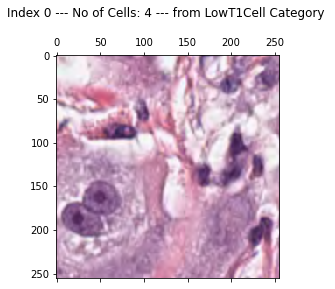

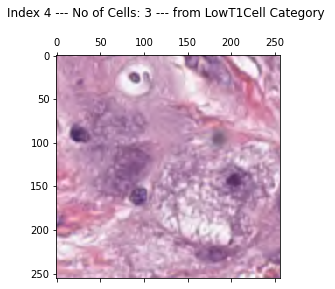

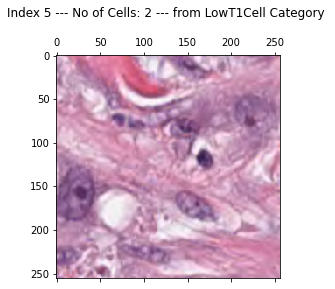

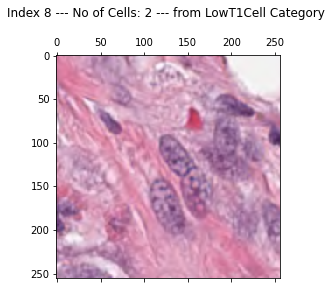

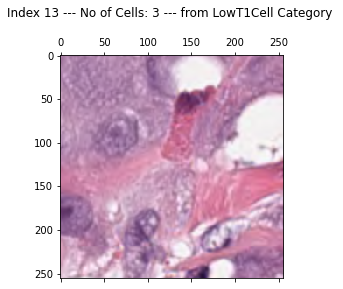

In [88]:
# Display 5 Images with Low T1 cells count (less than 5)
low_t1_cells_array = (np.where(Y0[:,0]<5))[0]
display_cell(low_t1_cells_array,Y0,X0,5,'LowT1Cell',0)

Displaying  HighT1Cell  images


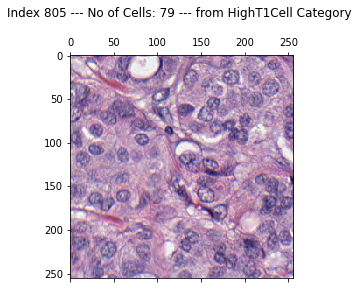

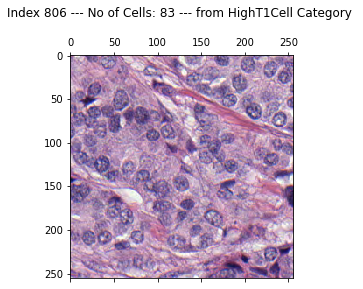

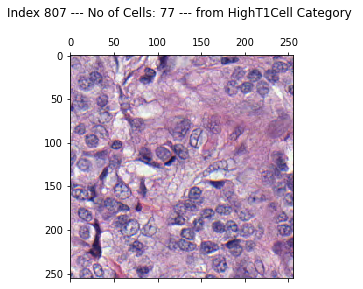

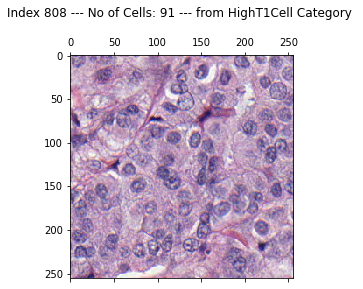

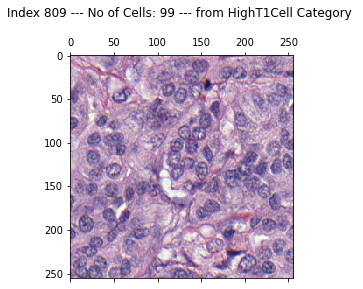

In [89]:
# Display 5 Images with High T1 cells count (more than 70)
high_t1_cells_array = (np.where(Y0[:,0]>=70))[0]
display_cell(high_t1_cells_array,Y0,X0,5,'HighT1Cell',0)

Displaying  LowT2Cell  images


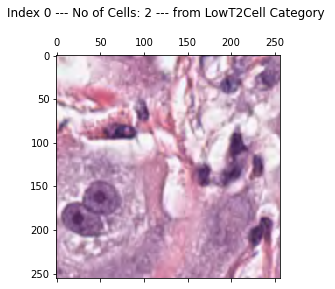

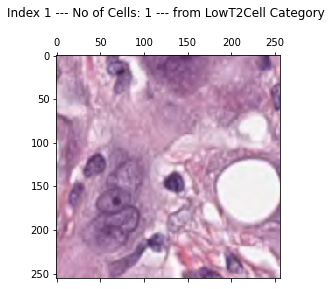

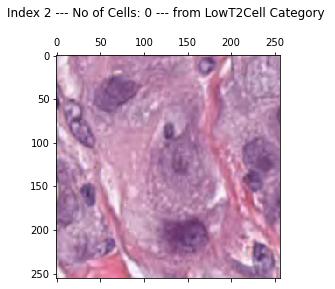

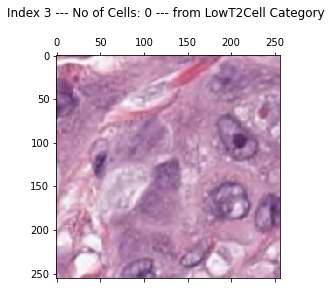

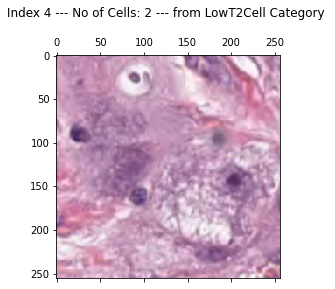

In [90]:
# Display 5 Images with Low T2 cells count (less than 5)
low_t2_cells_array = (np.where(Y0[:,1]<5))[0]
display_cell(low_t2_cells_array,Y0,X0,5,'LowT2Cell',1)

Displaying  HighT2Cell  images


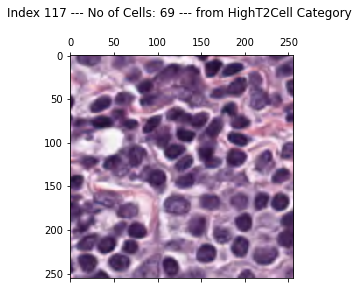

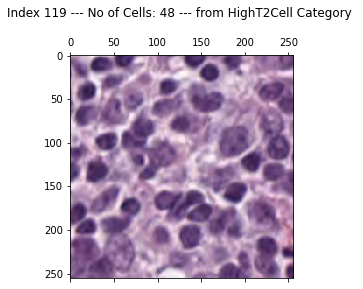

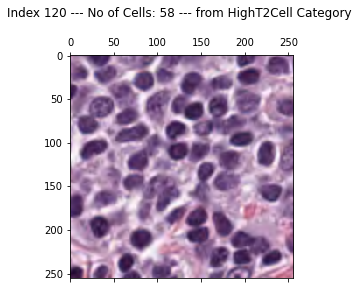

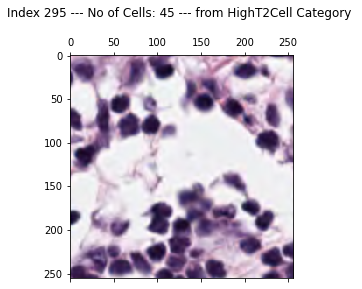

In [91]:
# Display 5 Images with High T2 cells count (more than 70)
high_t2_cells_array = (np.where(Y0[:,1]>=40))[0]
display_cell(high_t2_cells_array,Y0,X0,5,'HighT2Cell',1)

Displaying  LowT3Cell  images


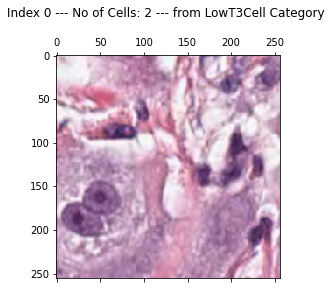

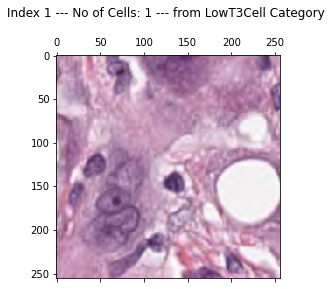

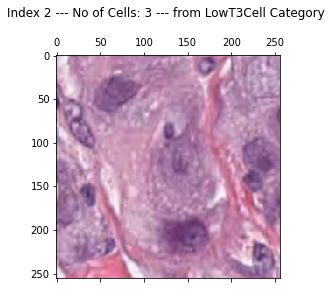

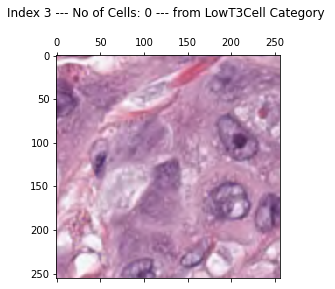

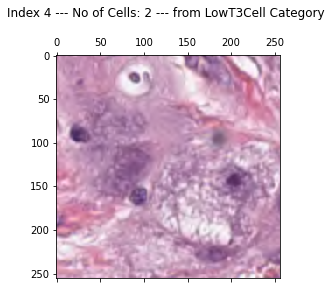

In [92]:
# Display 5 Images with Low T3 cells count (less than 5)
low_t3_cells_array = (np.where((Y0[:,2]<5)))[0]
display_cell(low_t3_cells_array,Y0,X0,5,'LowT3Cell',2)

Displaying  HighT3Cell  images


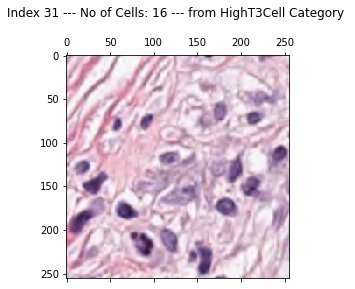

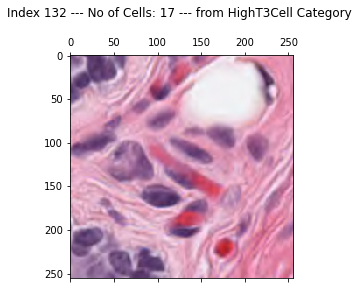

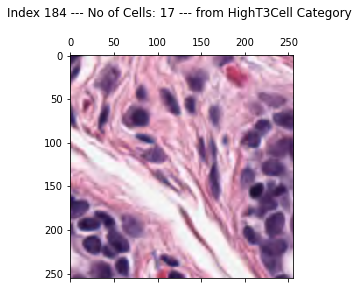

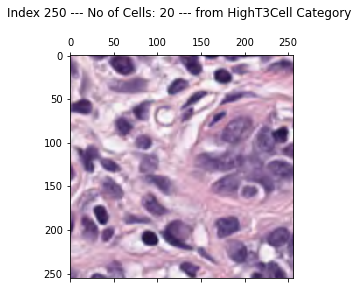

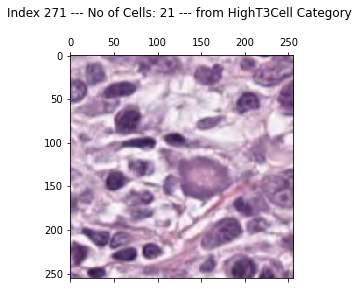

In [93]:
# Display 5 Images with High T3 cells count (more than 70)
high_t3_cells_array = (np.where((Y0[:,2]>15)))[0]
display_cell(high_t3_cells_array,Y0,X0,5,'HighT3Cell',2)

Displaying  LowT4Cell  images


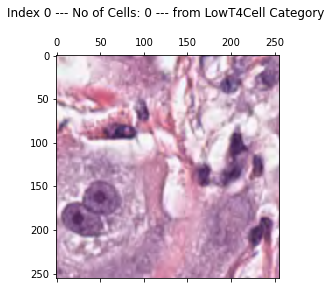

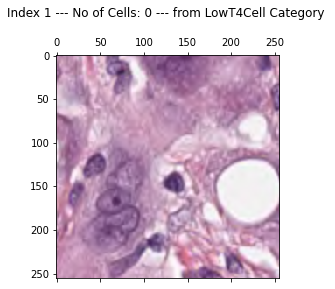

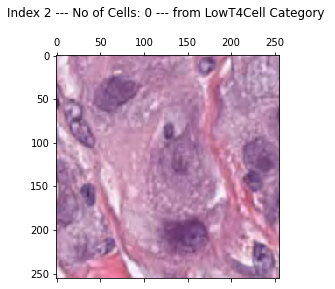

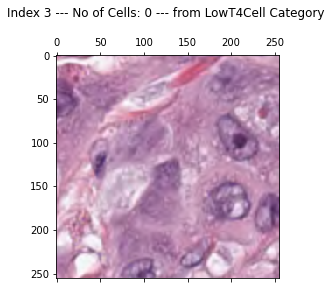

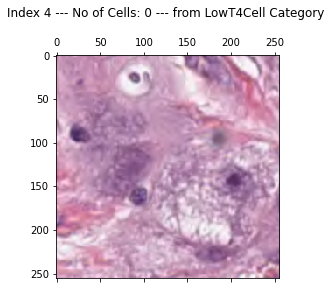

In [94]:
# Display 5 Images with No T4 cells 
low_t4_cells_array = (np.where((Y0[:,3]==0)))[0]
display_cell(low_t4_cells_array,Y0,X0,5,'LowT4Cell',3)

Displaying  LowT4Cell  images


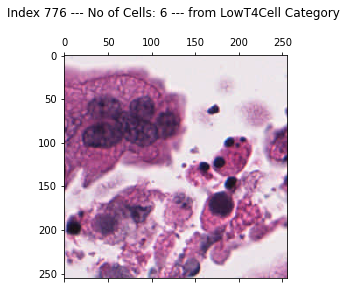

In [95]:
# Display 5 Images with High T4 cells count (6 cells)
high_t4_cells_array = (np.where((Y0[:,3]==6)))[0]
display_cell(high_t4_cells_array,Y0,X0,5,'LowT4Cell',3)

Displaying  LowT5Cell  images


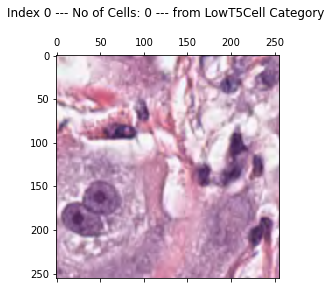

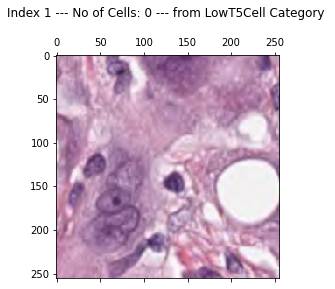

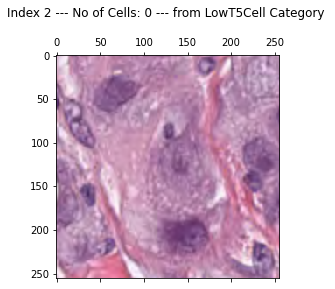

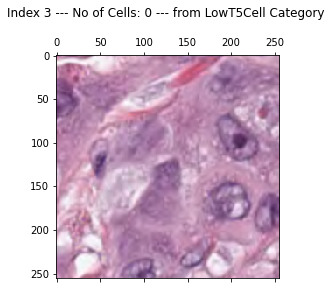

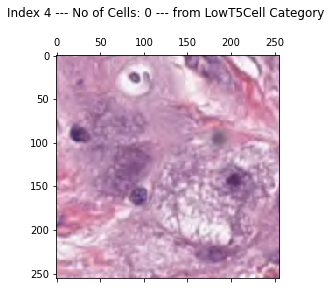

In [96]:
# Display 5 Images with Low T5 cells count (less than 5)
low_t5_cells_array = (np.where((Y0[:,4]<5)))[0]
display_cell(low_t5_cells_array,Y0,X0,5,'LowT5Cell',4)

Displaying  HighT5Cell  images


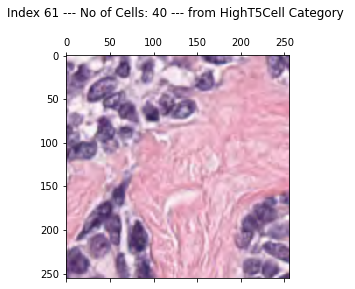

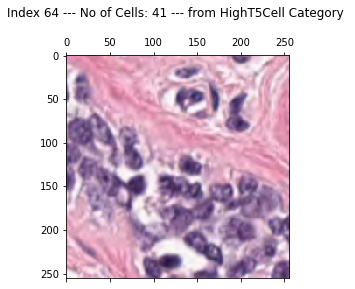

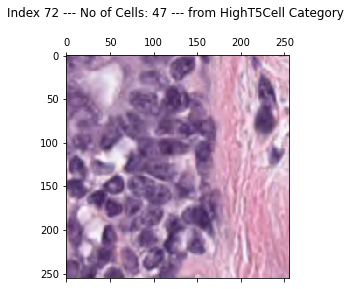

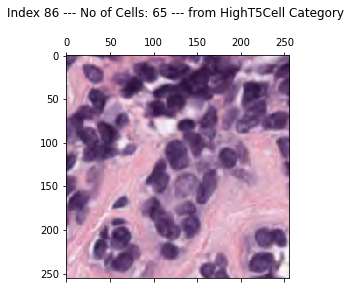

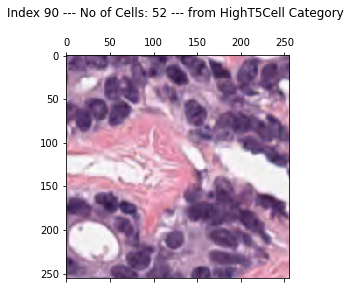

In [97]:
# Display 5 Images with High T5 cells count (more than 40)
high_t5_cells_array = (np.where((Y0[:,4]>=40)))[0]
display_cell(high_t5_cells_array,Y0,X0,5,'HighT5Cell',4)

Displaying  LowT6Cell  images


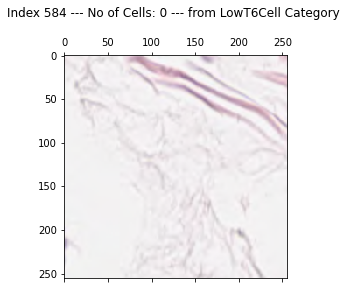

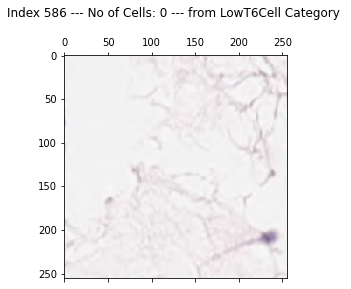

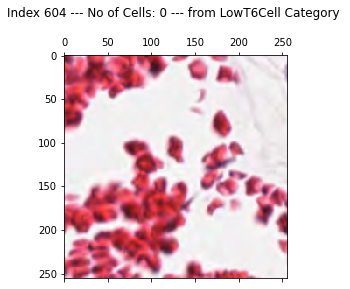

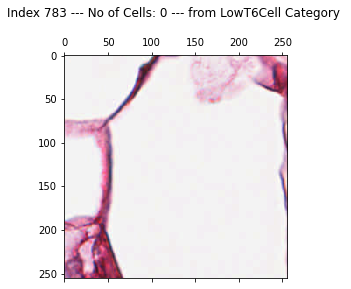

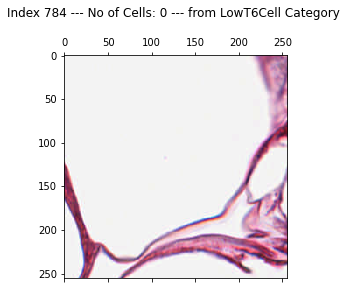

In [98]:
# Display 5 Images with No T6 cells 
low_t6_cells_array = (np.where((Y0[:,5]==0)))[0]
display_cell(low_t6_cells_array,Y0,X0,5,'LowT6Cell',5)

Displaying  HighT6Cell  images


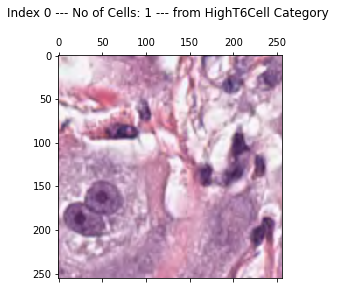

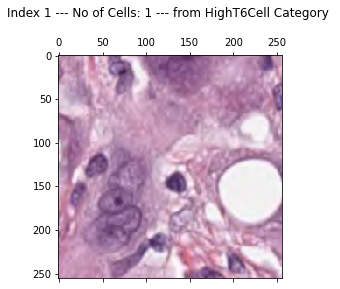

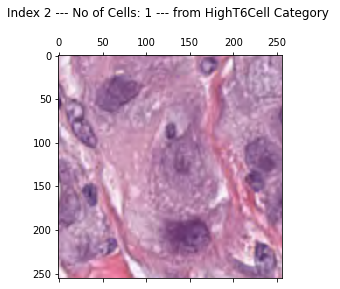

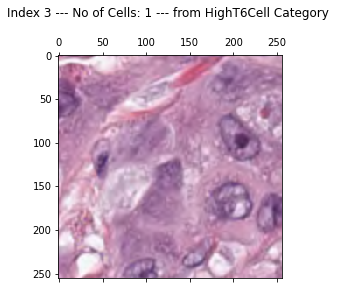

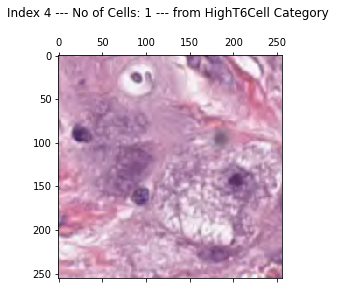

In [99]:
# Display 5 Images with High T6 cells count (1 cells)
high_t6_cells_array = (np.where((Y0[:,5]==1)))[0]
display_cell(high_t6_cells_array,Y0,X0,5,'HighT6Cell',5)

### iii. For each fold, plot the histogram of counts of each cell type separately (6 plots in total). How many images have counts within each of the following bins? [4 marks]

In [100]:
binning_distribution = [0, 1, 6, 11, 21, 31, 41, 51,100]

def plot_histograms(fold_array, label=''):
    count_array =[]
    fig, (ax1, ax2,ax3,ax4,ax5,ax6) = plt.subplots(6, figsize=(15,20))
    print('Displaying ',label)
    count, bins, patch = ax1.hist(fold_array[:,0], bins = binning_distribution)
    count_array.append(count)
    ax1.set_title('T1cell')
    ax1.set_ylabel('Count')
    ax1.set(xticks=binning_distribution, xlim=[0,100])
    count, bins, patch = ax2.hist(fold_array[:,1], bins = binning_distribution)
    count_array.append(count)
    ax2.set_title('T2cell')
    ax2.set_ylabel('Count')
    ax2.set(xticks=binning_distribution, xlim=[0,100])
    count, bins, patch = ax3.hist(fold_array[:,2], bins = binning_distribution)
    count_array.append(count)
    ax3.set_title('T3cell')
    ax3.set_ylabel('Count')
    ax3.set(xticks=binning_distribution, xlim=[0,100])
    count, bins, patch = ax4.hist(fold_array[:,3], bins = binning_distribution)
    count_array.append(count)
    ax4.set_title('T4cell')
    ax4.set_ylabel('Count')
    ax4.set(xticks=binning_distribution, xlim=[0,100])
    count, bins, patch = ax5.hist(fold_array[:,4], bins = binning_distribution)
    count_array.append(count)
    ax5.set_title('T5cell')
    ax5.set_ylabel('Count')
    ax5.set(xticks=binning_distribution, xlim=[0,100])
    count, bins, patch = ax6.hist(fold_array[:,5], bins = binning_distribution)
    count_array.append(count)
    ax6.set_title('T6cell')
    ax6.set_ylabel('Count')
    ax6.set(xticks=binning_distribution, xlim=[0,100])
    
    ax1.grid()
    ax2.grid()
    ax3.grid()
    ax4.grid()
    ax5.grid()
    ax6.grid()
    plt.tight_layout()
    return count_array

Generate **Fold 1 Histograms** and accumulate results in an array


Displaying  Fold 1 Histograms


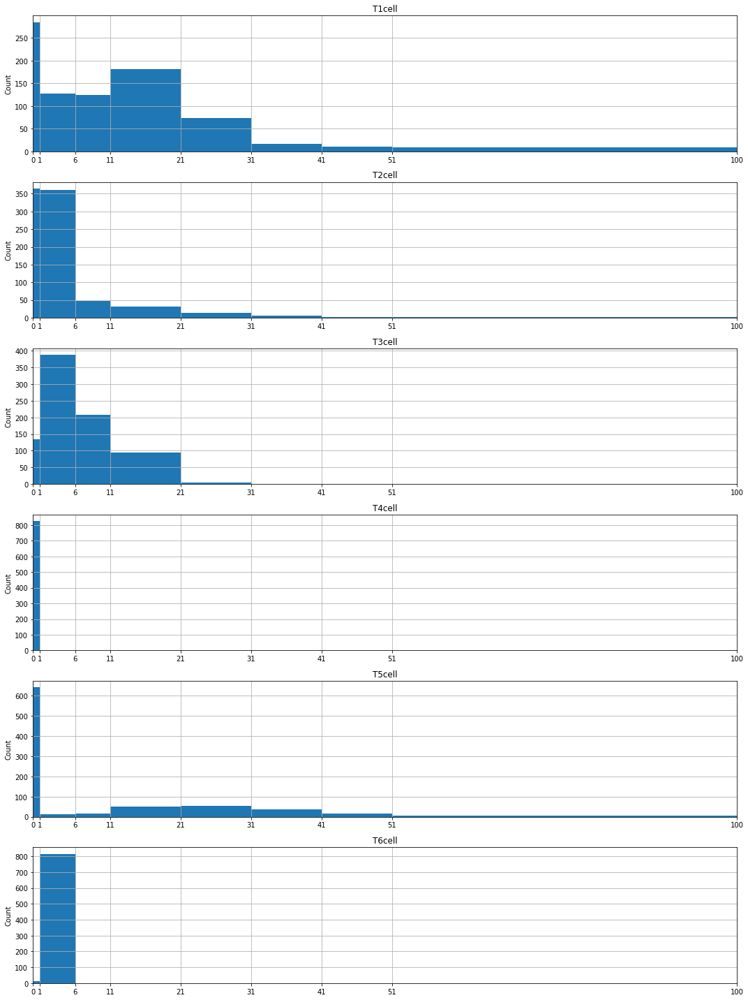

In [101]:
f1_count = plot_histograms(Y0, 'Fold 1 Histograms')

Display **Image Counts** for each bins and for each Cell within **Fold 1**


In [102]:
f1_count_transpose = np.transpose(f1_count)
F1_df = pd.DataFrame(data=f1_count_transpose, index=["0", "1-5", "6-10", "11-20", "21-30", "31-40", "41-50",">50"], columns=["Fold1 T1", "Fold1 T2", "Fold1 T3", "Fold1 T4", "Fold1 T5", "Fold1 T6"])
print("Fold1 Cell Count for each bin")
F1_df

Fold1 Cell Count for each bin


,Fold1 T1,Fold1 T2,Fold1 T3,Fold1 T4,Fold1 T5,Fold1 T6
0,285.0,365.0,134.0,825.0,641.0,11.0
1-5,127.0,360.0,388.0,1.0,11.0,816.0
6-10,124.0,48.0,207.0,1.0,15.0,0.0
11-20,181.0,32.0,94.0,0.0,49.0,0.0
21-30,74.0,13.0,4.0,0.0,53.0,0.0
31-40,17.0,5.0,0.0,0.0,38.0,0.0
41-50,10.0,2.0,0.0,0.0,15.0,0.0
>50,9.0,2.0,0.0,0.0,5.0,0.0


Generate **Fold 2 Histograms** and accumulate results in an array


Displaying  Fold 2 Histograms


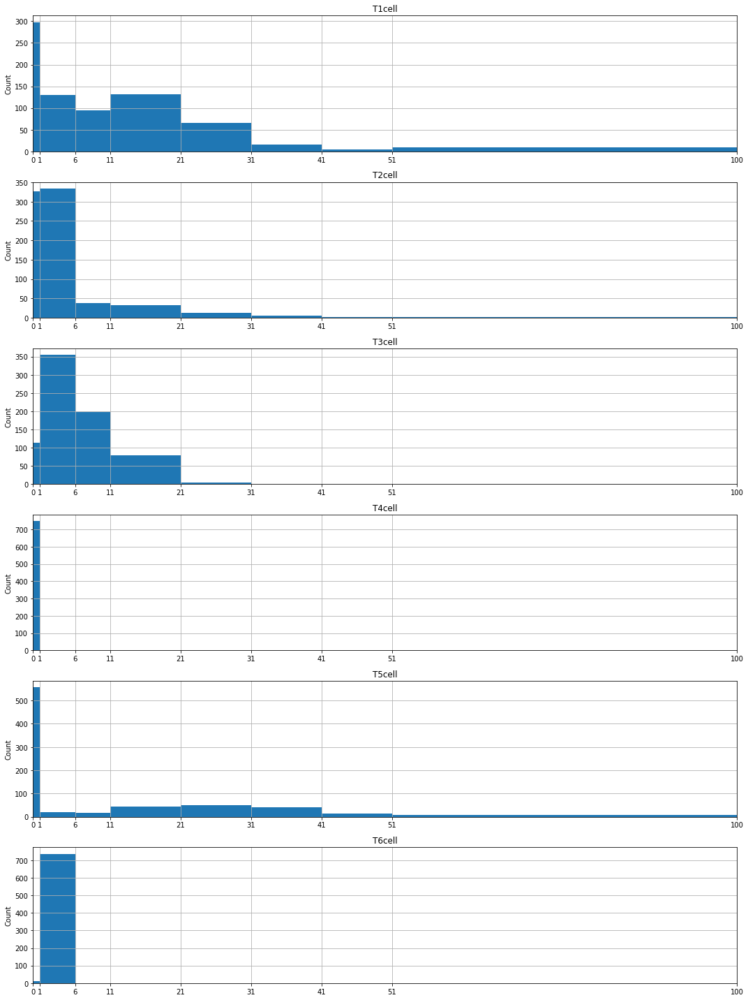

In [103]:
f2_count = plot_histograms(Y1, 'Fold 2 Histograms')

Display **Image Counts** for each bins and for each Cell within **Fold 2**


In [104]:
f2_count_transpose = np.transpose(f2_count)
F2_df = pd.DataFrame(data=f2_count_transpose, index=["0", "1-5", "6-10", "11-20", "21-30", "31-40", "41-50",">50"], columns=["Fold2 T1", "Fold2 T2", "Fold2 T3", "Fold2 T4", "Fold2 T5", "Fold2 T6"])
print("Fold2 Cell Count within each bin")
F2_df

Fold2 Cell Count within each bin


,Fold2 T1,Fold2 T2,Fold2 T3,Fold2 T4,Fold2 T5,Fold2 T6
0,298.0,327.0,114.0,748.0,556.0,12.0
1-5,130.0,334.0,355.0,0.0,19.0,737.0
6-10,95.0,37.0,197.0,1.0,18.0,0.0
11-20,131.0,32.0,79.0,0.0,45.0,0.0
21-30,66.0,12.0,4.0,0.0,50.0,0.0
31-40,16.0,5.0,0.0,0.0,40.0,0.0
41-50,4.0,1.0,0.0,0.0,14.0,0.0
>50,9.0,1.0,0.0,0.0,7.0,0.0


Generate **Fold 3 Histograms** and accumulate results in an array


Displaying  Fold 3 Histograms


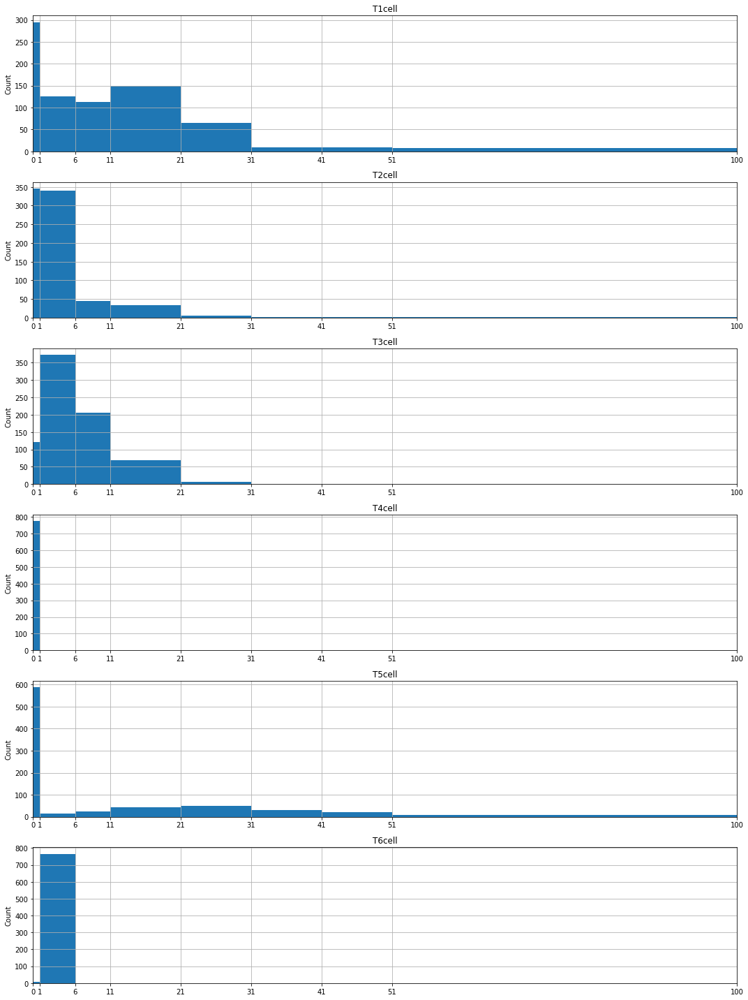

In [105]:
f3_count = plot_histograms(Y2, 'Fold 3 Histograms')

In [106]:
f3_count_transpose = np.transpose(f3_count)
F3_df = pd.DataFrame(data=f3_count_transpose, index=["0", "1-5", "6-10", "11-20", "21-30", "31-40", "41-50",">50"], columns=["Fold3 T1", "Fold3 T2", "Fold3 T3", "Fold3 T4", "Fold3 T5", "Fold3 T6"])
print("Fold3 Cell Count within each bin")
F3_df

Fold3 Cell Count within each bin


,Fold3 T1,Fold3 T2,Fold3 T3,Fold3 T4,Fold3 T5,Fold3 T6
0,295.0,346.0,122.0,774.0,587.0,9.0
1-5,125.0,341.0,373.0,1.0,14.0,766.0
6-10,113.0,44.0,205.0,0.0,23.0,0.0
11-20,150.0,33.0,68.0,0.0,43.0,0.0
21-30,65.0,6.0,7.0,0.0,51.0,0.0
31-40,10.0,2.0,0.0,0.0,29.0,0.0
41-50,9.0,2.0,0.0,0.0,21.0,0.0
>50,8.0,1.0,0.0,0.0,7.0,0.0


**Summarise counts** in 1 table

The majority of T4 and T6 cell counts are below 5. T5 has a majority of 0 counts although it has some cells distruted along the other bins. T3 has cell counts up till bin 11-20. T1 and T2 have counts disperred along all bins although T1 sees a less majority at the lower bins.  

In [107]:
all_folds_df = pd.concat([F1_df, F2_df,F3_df], axis=1)
all_folds_df

,Fold1 T1,Fold1 T2,Fold1 T3,Fold1 T4,Fold1 T5,Fold1 T6,Fold2 T1,Fold2 T2,Fold2 T3,Fold2 T4,Fold2 T5,Fold2 T6,Fold3 T1,Fold3 T2,Fold3 T3,Fold3 T4,Fold3 T5,Fold3 T6
0,285.0,365.0,134.0,825.0,641.0,11.0,298.0,327.0,114.0,748.0,556.0,12.0,295.0,346.0,122.0,774.0,587.0,9.0
1-5,127.0,360.0,388.0,1.0,11.0,816.0,130.0,334.0,355.0,0.0,19.0,737.0,125.0,341.0,373.0,1.0,14.0,766.0
6-10,124.0,48.0,207.0,1.0,15.0,0.0,95.0,37.0,197.0,1.0,18.0,0.0,113.0,44.0,205.0,0.0,23.0,0.0
11-20,181.0,32.0,94.0,0.0,49.0,0.0,131.0,32.0,79.0,0.0,45.0,0.0,150.0,33.0,68.0,0.0,43.0,0.0
21-30,74.0,13.0,4.0,0.0,53.0,0.0,66.0,12.0,4.0,0.0,50.0,0.0,65.0,6.0,7.0,0.0,51.0,0.0
31-40,17.0,5.0,0.0,0.0,38.0,0.0,16.0,5.0,0.0,0.0,40.0,0.0,10.0,2.0,0.0,0.0,29.0,0.0
41-50,10.0,2.0,0.0,0.0,15.0,0.0,4.0,1.0,0.0,0.0,14.0,0.0,9.0,2.0,0.0,0.0,21.0,0.0
>50,9.0,2.0,0.0,0.0,5.0,0.0,9.0,1.0,0.0,0.0,7.0,0.0,8.0,1.0,0.0,0.0,7.0,0.0


### iv. Pre-processing: Convert and show a few images from RGB space to HED space and show the H-channel which should indicate cellular nuclei. For this purpose, you can use the color separation notebook available here: https://scikit-image.org/docs/dev/auto_examples/color_exposure/plot_ihc_color_separation.html [5 marks]

The nuclei are more pronounced in the H and D channel images. The nuclei in the E channel are barely visible.

The colourbar for the H and D channels show a larger variance in the image intensity than the E channel (which shows a low variance of around 0.07). This indicates that the E channel is just picking noise in the image. 

The largest colour variance can be noted in the H channel. Also, cellular nuclei can be seen with most clarity in the H-space. This indicates that H-channel is the most useful space in detecting cell nuclei.


In [108]:
#Define Colormaps
cmap_hema = LinearSegmentedColormap.from_list('mycmap', ['white', 'navy'])
cmap_dab = LinearSegmentedColormap.from_list('mycmap', ['white','saddlebrown'])
cmap_eosin = LinearSegmentedColormap.from_list('mycmap', ['darkviolet','white'])

In [109]:
#Convert all images in Fold 1 into the HED space and store in respective arrays
X0_hed = np.zeros(shape=(827, 256, 256, 3))
X0_h = np.zeros(shape=(827, 256, 256))
X0_e = np.zeros(shape=(827, 256, 256))
X0_d = np.zeros(shape=(827, 256, 256))

for image in range(X0.shape[0]):
    X0_hed[image] = rgb2hed(X0[image])
    X0_h[image] = X0_hed[image][:, :, 0]
    X0_e[image] = X0_hed[image][:, :, 1]
    X0_d[image] = X0_hed[image][:, :, 2]


In [110]:
#Function for displaying 10 objects in the HED space
def display_cell_HED (array,y,x, hed_space, h_space , e_space, d_space, no_objects = 10, datasetName='',cell_no = 0):
    
    for i in array[:no_objects]:
        
        number_of_cell = y[i][cell_no]
        
        fig, axes = plt.subplots(2, 2, figsize=(15,10))
        ax = axes.ravel()

        ax[0].imshow(x[i])
        ax[0].set_title('Original image, Index '+str(i)+' --- No of T1 cells: '+ str(number_of_cell)+' --- from '+datasetName+' Category\n')
        
        mapable = ax[1].imshow(h_space[i], cmap=cmap_hema)
        ax[1].set_title("Hematoxylin")
        plt.colorbar(mapable, ax=ax[1])
        
        mapable = ax[2].imshow(e_space[i], cmap=cmap_eosin)
        ax[2].set_title("Eosin")
        plt.colorbar(mapable, ax=ax[2])

        mapable = ax[3].imshow(d_space[i], cmap=cmap_dab)
        ax[3].set_title("DAB")
        plt.colorbar(mapable, ax=ax[3])
        
        plt.tight_layout()

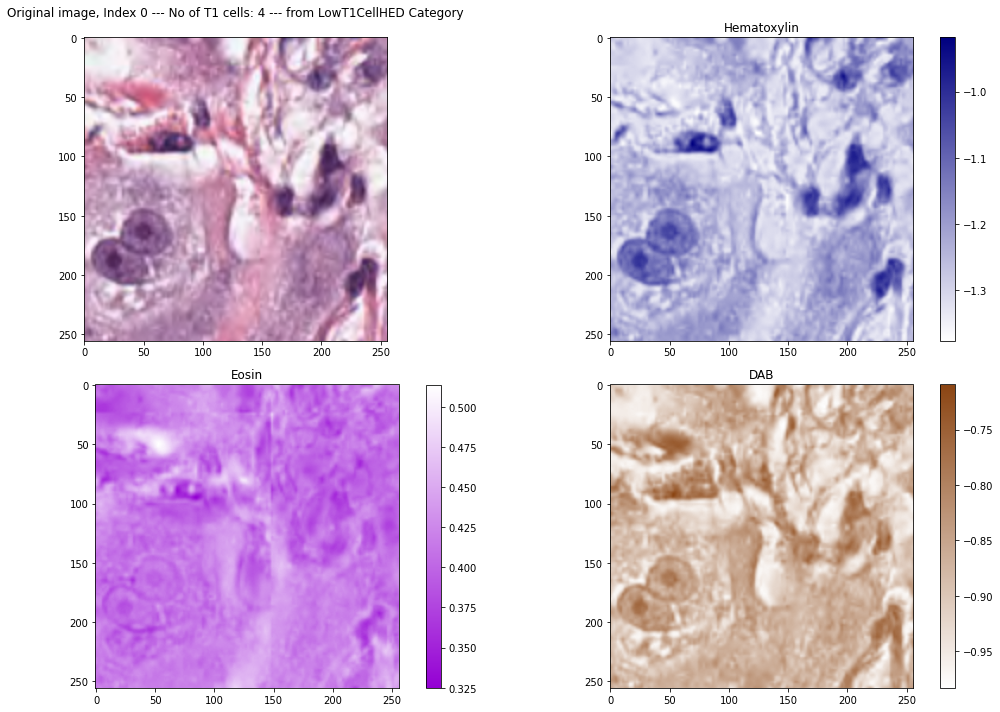

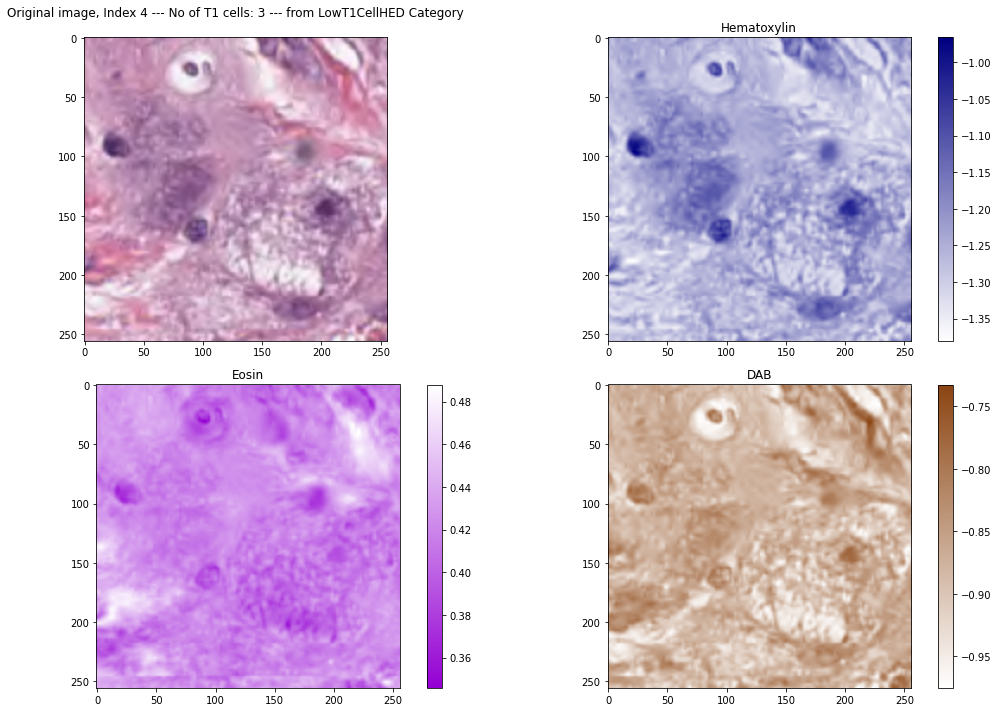

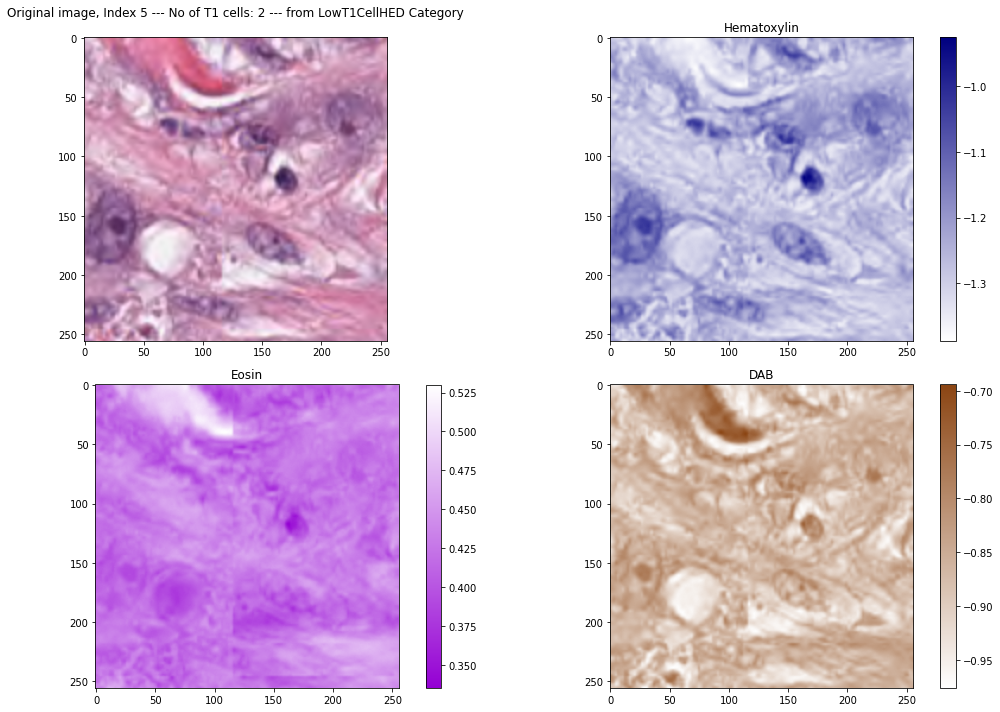

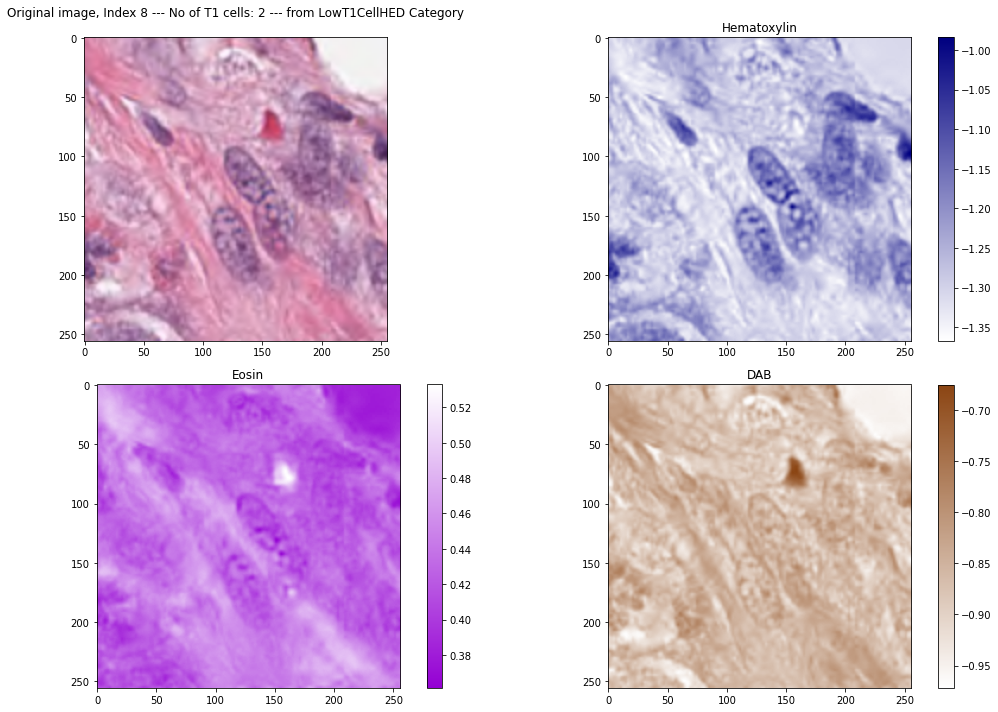

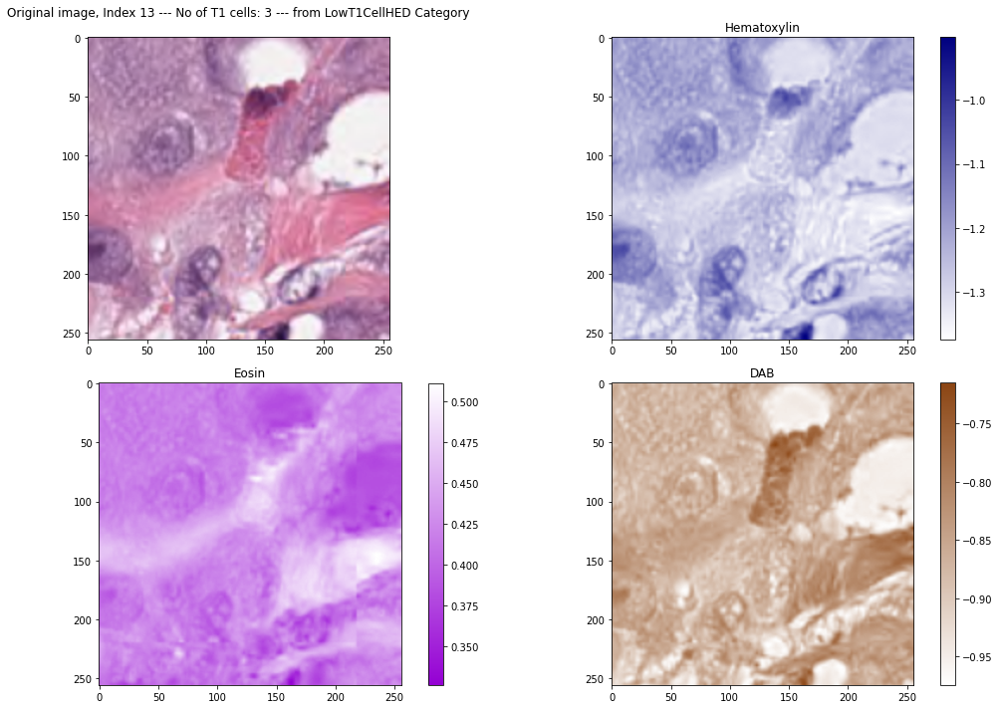

In [111]:
#Display Low T1 cells count from Fold 1
low_t1_cells_array = (np.where(Y0[:,0]<5))[0]
display_cell_HED(low_t1_cells_array,Y0,X0,X0_hed,X0_h,X0_e, X0_d, 5,'LowT1CellHED',0)

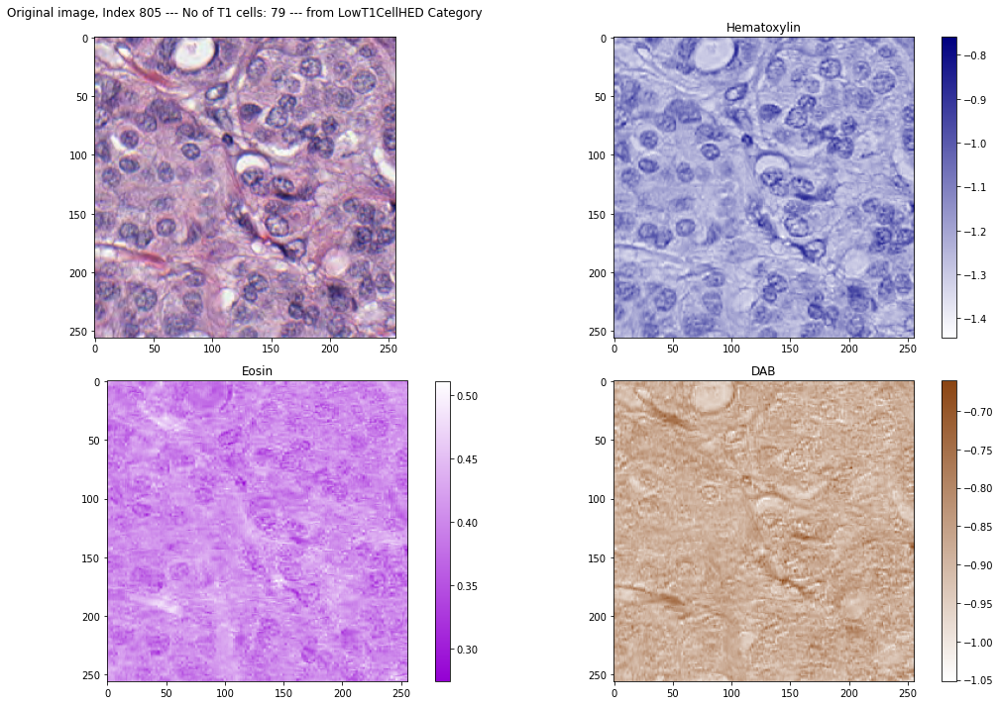

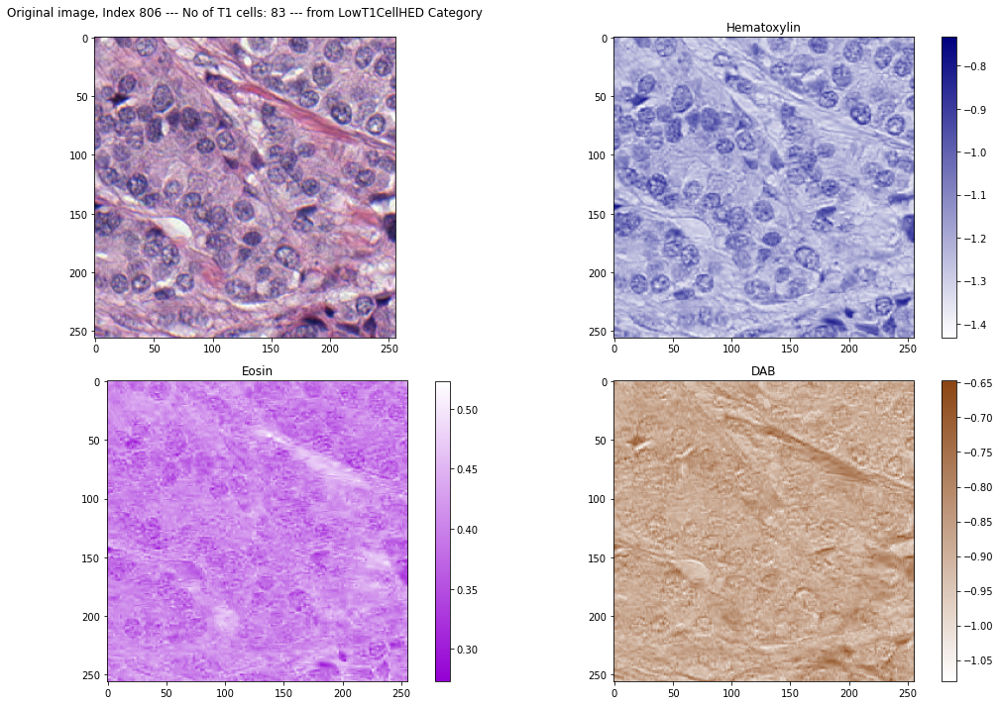

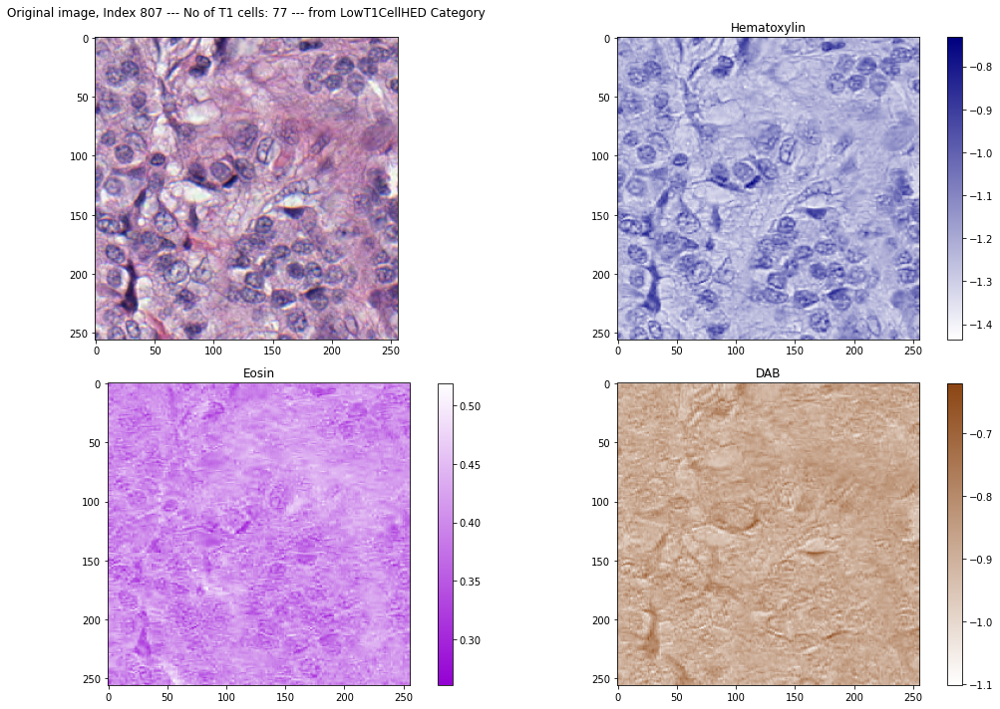

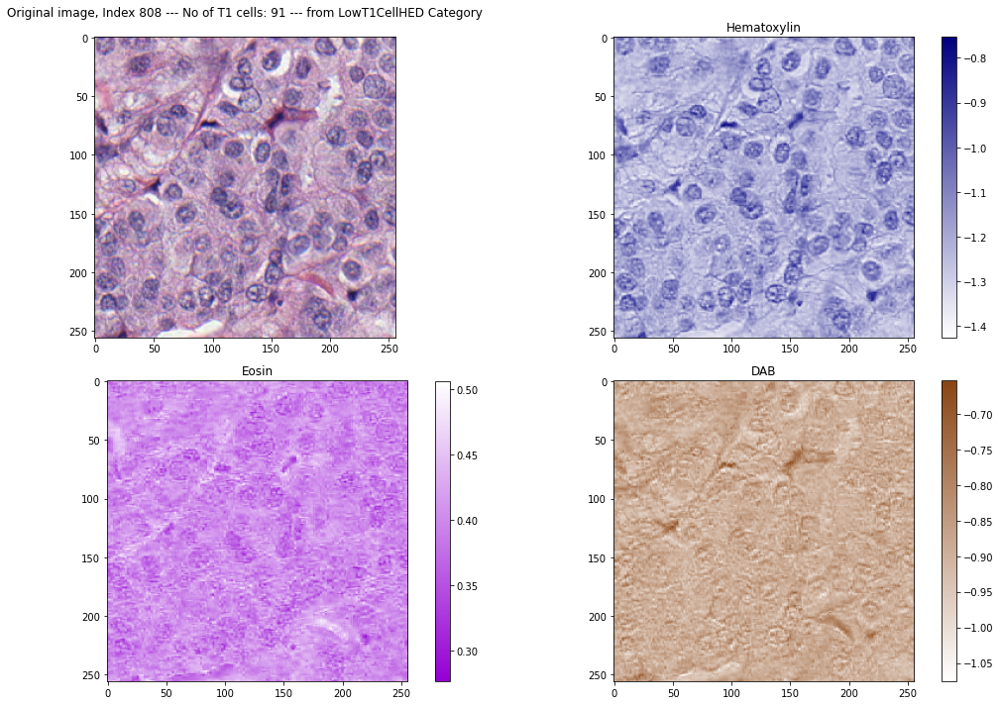

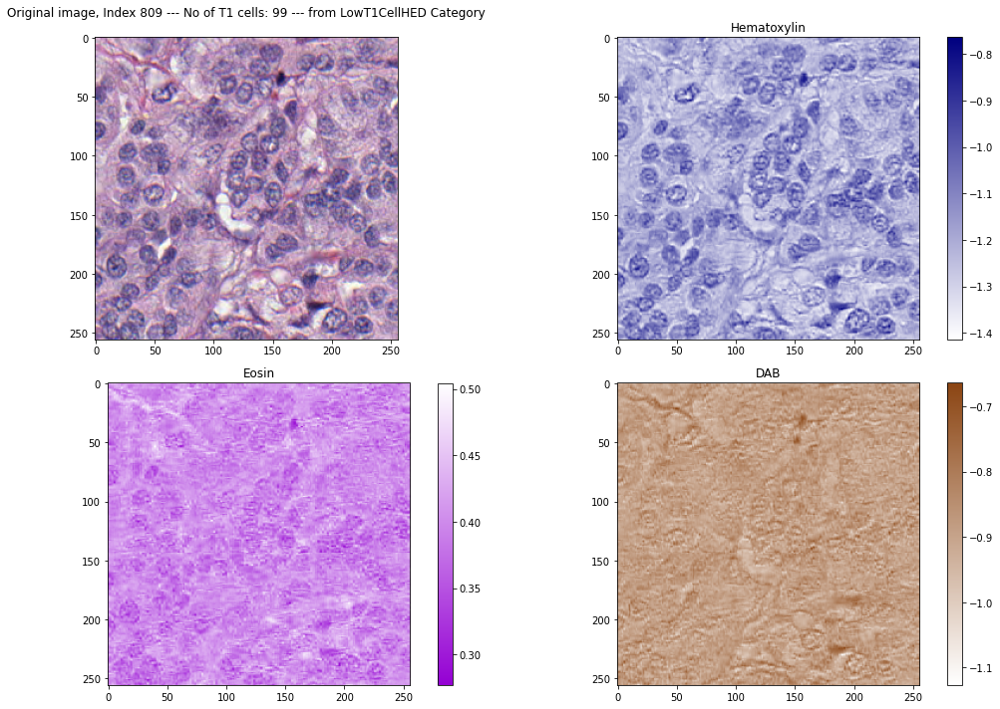

In [112]:
#Display High T1 cells count from Fold 1
high_t1_cells_array = (np.where(Y0[:,0]>=70))[0]
display_cell_HED(high_t1_cells_array,Y0,X0,X0_hed,X0_h,X0_e, X0_d, 5,'LowT1CellHED',0)

### v. Do a scatter plot of the average of the H-channel for each image vs. its cell count of a certain type for images in Fold-1 (6 plots in total). Do you think this feature would be useful in your regression model? Explain your reasoning. [4 marks]

Using the H channel as an input feature **is useful** in the regression model. The effects of the H-channel can be mostly seen in the T1 and T2 scatter plots, whereby as the average of the H-channel for each image is increased, the number of cell counts increases. Therefore it can be stated that the cell count is correlated and proportional with the average of the H-channel. 

T4 and T6 have a low cell count and hence this relationship is less observable. For T6, a 0 cell count is generally attributed to a low average H-channel (although this same average overlaps with some cases where T6 cell counts = 1). 

In [113]:
#Extract Fold 1 Cell Counts
Y0_t1_cells_count = Y0[:,0]
Y0_t2_cells_count = Y0[:,1]
Y0_t3_cells_count = Y0[:,2]
Y0_t4_cells_count = Y0[:,3]
Y0_t5_cells_count = Y0[:,4]
Y0_t6_cells_count = Y0[:,5]


In [114]:
#Calculate the average for each H-channel image in Fold 1
X0_average_hchannel = []
for image_no in range(X0_h.shape[0]):
    X0_average_hchannel.append(np.mean(X0_h[image_no]))

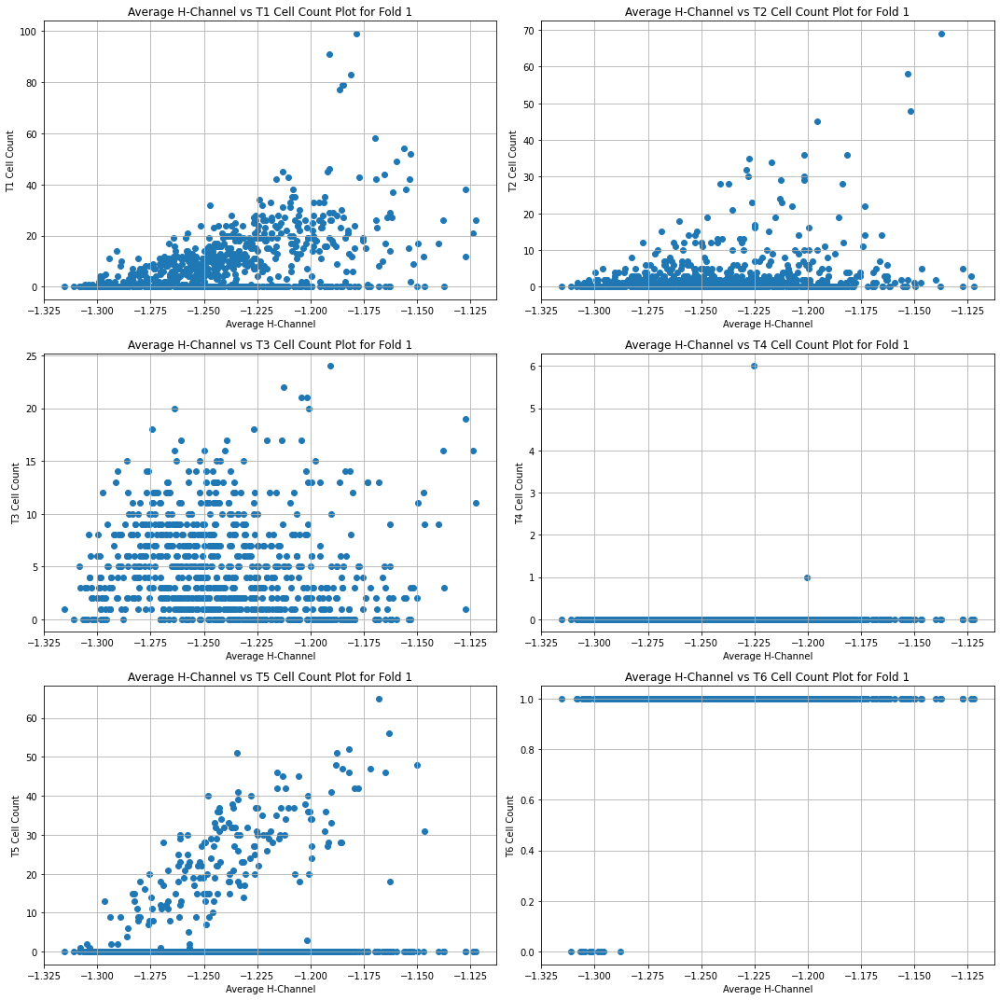

In [115]:
xlabel = ['T1 Cell Count','T2 Cell Count','T3 Cell Count','T4 Cell Count','T5 Cell Count','T6 Cell Count']
Y0_t_cells_array = [Y0_t1_cells_count,Y0_t2_cells_count,Y0_t3_cells_count,Y0_t4_cells_count,Y0_t5_cells_count,Y0_t6_cells_count]
fig, axes = plt.subplots(3,2, figsize=(15,15))
ax = axes.ravel()
plot_no = 0
for idx,_ in enumerate(xlabel):
    ax[plot_no].scatter(X0_average_hchannel, Y0_t_cells_array[idx])
    ax[plot_no].grid()
    ax[plot_no].set_xlabel('Average H-Channel')
    ax[plot_no].set_ylabel(xlabel[idx])
    title = 'Average H-Channel vs '+xlabel[idx]+' Plot for Fold 1'
    ax[plot_no].set_title(title)
    plot_no +=1
plt.tight_layout()

### vi. What performance metrics can you use for this problem? Which one will be the best performance metric for this problem? Please give reasoning. [3 marks]

#### Metrics that can be used for this Problem
1. Mean Square Error (MSE) - it compute the average of the squared difference between target and predicted values. Since it squares the errors, it penalises even small error giving an over-estimation of how bad the model is. 

2. Root Mean Squared Error (RMSE) - it does the square root of the averaged squared difference between target and predicted values. Since it squares before averaging, it imposes high penalties on large error. RMSE is useful when large errors are undersired. 

3. Mean Absolute Error: (MAE) - MAE gives the absolute difference between the taget and predicted values. It is robust to outliers and does not penalise errors extremely as MSE. It is hence not suitable for applications were outliers are important in the dataset. 

4. R-Squared Error: It compares the designed model with a baseline. The base line is chosen by computing the mean of the data and drawing a line at the mean. It explains the degree to which the input variables explain the variation of the output / predicted variable. R-Squared is always bound between 0 and 1.

5. Adjusted R-Square Error: It overcomes the limitations of R-squared error. R-squared scores improves as the number of features increases even though the model might not be improving. Adjusted R-Squared penalises if new variables do not have impact on improving the model. 

6. Pearson and Spearman Correlation Coefficient. These metrics can be used to measure the goodness of fit of the a model to the data. The higher the correlation, the better fit the model to the data would be. 

#### Best Performance Metric for this Problem
Since the majority of images have a low T1 cell counts, images with high T1 cell counts can be treated as outliers. This being said they still are important. Hence MAE cannot be applied. 

Although the correlation coefficients are good in accessing the goodness of fit, they might be undersirable given their invariance to scale. Their limitations will be exposed when predicting T4 cells as for example (given that T4 cells have the greatest majority of 0 cells).

MSE penalises even smaller errors. In Q1 part v, we have seen that the H channel is correlated with the count of T1 cells. However, an overlap can be noted in the low average H-channel between high and low cell counts, hence errors are to be expected. MSE will over-penalise the model and hence it is not suitable for this problem.

Since R-squared calculates goodness of fit, and since our data is sparsed, it might be penalises data points which have a larger distance from the fitted model. Furthermore, it is dependent on the number of features used in the model which is an undersirable characteristic for this problem. 

Hence **RMSE** is the preferred performance metric.

# Question No. 2: (Feature Extraction and Classical Regression) [40 Marks]

## i. Extract features from a given image

In [116]:
#Extract Red, Green and Blue channels from Fold1 
X0_red_channel = np.zeros(shape=(827, 256, 256))
X0_green_channel = np.zeros(shape=(827, 256, 256))
X0_blue_channel = np.zeros(shape=(827, 256, 256))

for image in range(X0.shape[0]):
    X0_red_channel[image] = X0[image][:,:,0]
    X0_green_channel[image] = X0[image][:,:,1]
    X0_blue_channel[image] = X0[image][:,:,2]

In [117]:
#Entropy calculation function
def entropy_function(img, base=None):
    counts, bins = np.histogram(img.reshape(-1), bins=256)
    prob = counts / np.sum(counts)
    entropy = stats.entropy(prob, base=2)
    return entropy

#### Question i. a. b. c. Extract Average, Variance and Entropy Features

In [118]:
#Averages
X0_average_hchannel = []
X0_average_red_channel = []
X0_average_green_channel = []
X0_average_blue_channel = []

X0_variance_hchannel = []
X0_variance_red_channel = []
X0_variance_green_channel = []
X0_variance_blue_channel = []

X0_entropy_hchannel = []
X0_entropy_red_channel = []
X0_entropy_green_channel = []
X0_entropy_blue_channel = []

for image_no in range(X0_red_channel.shape[0]):
    X0_average_hchannel.append(np.mean(X0_h[image_no]))
    X0_average_red_channel.append(np.mean(X0_red_channel[image_no]))
    X0_average_green_channel.append(np.mean(X0_green_channel[image_no]))
    X0_average_blue_channel.append(np.mean(X0_blue_channel[image_no]))
    
    X0_variance_hchannel.append(np.var(X0_h[image_no]))
    X0_variance_red_channel.append(np.var(X0_red_channel[image_no]))
    X0_variance_green_channel.append(np.var(X0_green_channel[image_no]))
    X0_variance_blue_channel.append(np.var(X0_blue_channel[image_no]))
    
    X0_entropy_red_channel.append(entropy_function(X0_red_channel[image_no]))
    X0_entropy_hchannel.append(entropy_function(X0_h[image_no]))
    X0_entropy_green_channel.append(entropy_function(X0_green_channel[image_no]))
    X0_entropy_blue_channel.append(entropy_function(X0_blue_channel[image_no]))

In [119]:
#Append features to dataframe
X0_features = []
X0_features.append(X0_average_hchannel)
X0_features.append(X0_average_red_channel)
X0_features.append(X0_average_green_channel)
X0_features.append(X0_average_blue_channel)
X0_features.append(X0_variance_hchannel)
X0_features.append(X0_variance_red_channel)
X0_features.append(X0_variance_green_channel)
X0_features.append(X0_variance_blue_channel)
X0_features.append(X0_entropy_hchannel)
X0_features.append(X0_entropy_red_channel)
X0_features.append(X0_entropy_green_channel)
X0_features.append(X0_entropy_blue_channel)
X0_features_transpose = np.transpose(X0_features)
X0_features_df = pd.DataFrame(data=X0_features_transpose, columns=["X0_Average_H", "X0_Average_Red", "X0_Average_Green", "X0_Average_Blue", "X0_variance_hchannel", "X0_variance_red_channel", "X0_variance_green_channel" ,"X0_variance_blue_channel", "X0_entropy_hchannel", "X0_entropy_red_channel", "X0_entropy_green_channel","X0_entropy_blue_channel"])


#### Question i. d. Any other features that you think can be useful for this work. Describe your reasoning for using these features.

#### Feature Extract 1: Using PCA to extract a reduced representation of each image

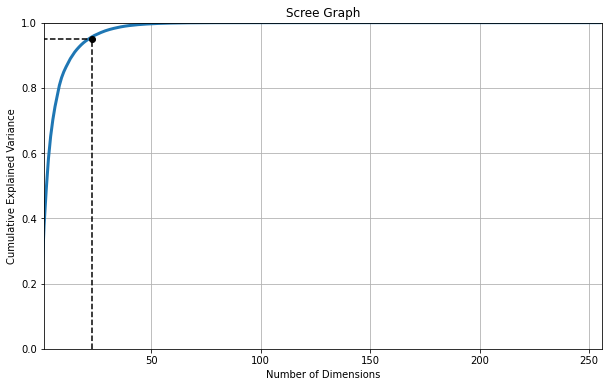

Number of dimensions to explain 95% of variance in training set: 23


In [120]:
pca = PCA()
pca.fit(X0_red_channel[0])
cumsum = np.cumsum(pca.explained_variance_ratio_) #cumulative explained variance 
dim = np.argmax(cumsum >= 0.95) + 1 #no of d dimensions explaining 95% of variance in train set
#Plot the scree-graph of cumulative explained varaince and the number of dimensions used
%matplotlib inline

plt.figure(figsize=(10, 6))
plt.plot(cumsum, linewidth=3)
#plt.axis([0, 800, 0, 1])
plt.axis([1,len(cumsum),0,1])
plt.plot([dim, dim], [0, 0.95], "k--")
plt.plot([0, dim], [0.95, 0.95], "k--")
plt.plot(dim, 0.95, "ko")
plt.xlabel('Number of Dimensions')
plt.ylabel('Cumulative Explained Variance')
plt.title('Scree Graph')
plt.grid()
plt.show()
print("Number of dimensions to explain 95% of variance in training set:", dim)

The loop below shows that using a **PCA** with only **0.3 explained variance** for the H, Red, Green and Blue channels gives a high Pearson correlation between the average and variance of each feature and the output number of T1 cells. 

In [121]:
features = [X0_h, X0_red_channel, X0_green_channel,X0_blue_channel]
features_names = ['X0_h', 'X0_red_channel', 'X0_green_channel','X0_blue_channel']
pca_array =[0.95,0.9,0.8,0.5,0.3]

for idx,feature_channel in enumerate(features):
    for pca_val in pca_array:
        flattenned_x0_channel =np.zeros(shape=(827, 65536))
        X0_average_pca_channel = []
        X0_var_pca_channel = []
        X0_entropy_pca_channel = []

        for image_no in range(feature_channel.shape[0]):
            flattenned_x0_channel[image_no] = feature_channel[image_no].flatten()
        pca = PCA(n_components=pca_val)
        X0_pca_channel = pca.fit_transform(flattenned_x0_channel)
        for image_no in range(X0_pca_channel.shape[0]):
            X0_average_pca_channel.append(np.mean(X0_pca_channel[image_no]))
            X0_var_pca_channel.append(np.var(X0_pca_channel[image_no]))
            X0_entropy_pca_channel.append(entropy_function(X0_pca_channel[image_no]))
            
        corr, _ = pearsonr(X0_average_pca_channel, Y0_t1_cells_count)
        print('Average - Feature: ',features_names[idx], ' PCA: ',pca_val,' Correlation: ', corr)
        corr, _ = pearsonr(X0_var_pca_channel, Y0_t1_cells_count)
        print('VAR - Feature: ',features_names[idx], ' PCA: ',pca_val,' Correlation: ', corr)
        corr, _ = pearsonr(X0_entropy_pca_channel, Y0_t1_cells_count)
        print('Entropy - Feature: ',features_names[idx], ' PCA: ',pca_val,' Correlation: ', corr)
        print('************************************')
        

Average - Feature:  X0_h  PCA:  0.95  Correlation:  0.23597041945155045
VAR - Feature:  X0_h  PCA:  0.95  Correlation:  0.11848085788098262
Entropy - Feature:  X0_h  PCA:  0.95  Correlation:  0.008873454722557579
************************************
Average - Feature:  X0_h  PCA:  0.9  Correlation:  0.24944405066475983
VAR - Feature:  X0_h  PCA:  0.9  Correlation:  0.12026059319575484
Entropy - Feature:  X0_h  PCA:  0.9  Correlation:  0.022020000603053768
************************************
Average - Feature:  X0_h  PCA:  0.8  Correlation:  0.23835208494229734
VAR - Feature:  X0_h  PCA:  0.8  Correlation:  0.10394667725923445
Entropy - Feature:  X0_h  PCA:  0.8  Correlation:  0.013475970773199461
************************************
Average - Feature:  X0_h  PCA:  0.5  Correlation:  0.30580752668525724
VAR - Feature:  X0_h  PCA:  0.5  Correlation:  0.12163507968712457
Entropy - Feature:  X0_h  PCA:  0.5  Correlation:  0.01221791279435012
************************************
Average - 

Generate Average and Variance for each channel on PCA reduced images as features. Note that since Entropy had a low correlation from the above loop, it was not included as a feature.


In [122]:
features = [X0_h, X0_red_channel, X0_green_channel,X0_blue_channel]
flattenned_x0_h_channel =np.zeros(shape=(827, 65536))
flattenned_x0_red_channel =np.zeros(shape=(827, 65536))
flattenned_x0_green_channel =np.zeros(shape=(827, 65536))
flattenned_x0_blue_channel =np.zeros(shape=(827, 65536))

X0_average_pca_h_channel = []
X0_var_pca_h_channel = []

X0_average_pca_red_channel = []
X0_var_pca_red_channel = []

X0_average_pca_green_channel = []
X0_var_pca_green_channel = []

X0_average_pca_blue_channel = []
X0_var_pca_blue_channel = []

for image_no in range(X0_h.shape[0]):
    flattenned_x0_h_channel[image_no] = X0_h[image_no].flatten()
    flattenned_x0_red_channel[image_no] = X0_red_channel[image_no].flatten()
    flattenned_x0_green_channel[image_no] = X0_green_channel[image_no].flatten()
    flattenned_x0_blue_channel[image_no] = X0_blue_channel[image_no].flatten()
    
pca = PCA(n_components=0.3) #0.3 explained variance
X0_pca_h_channel = pca.fit_transform(flattenned_x0_h_channel)
X0_pca_red_channel = pca.fit_transform(flattenned_x0_red_channel)
X0_pca_green_channel = pca.fit_transform(flattenned_x0_green_channel)
X0_pca_blue_channel = pca.fit_transform(flattenned_x0_blue_channel)

for image_no in range(X0_pca_h_channel.shape[0]):
    X0_average_pca_h_channel.append(np.mean(X0_pca_h_channel[image_no]))
    X0_var_pca_h_channel.append(np.var(X0_pca_h_channel[image_no]))

    X0_average_pca_red_channel.append(np.mean(X0_pca_red_channel[image_no]))
    X0_var_pca_red_channel.append(np.var(X0_pca_red_channel[image_no]))
    
    X0_average_pca_green_channel.append(np.mean(X0_pca_green_channel[image_no]))
    X0_var_pca_green_channel.append(np.var(X0_pca_green_channel[image_no]))
    
    X0_average_pca_blue_channel.append(np.mean(X0_pca_blue_channel[image_no]))
    X0_var_pca_blue_channel.append(np.var(X0_pca_blue_channel[image_no]))
    

In [123]:
#Append PCA features to dataframe
X0_features.append(X0_average_pca_h_channel)
X0_features.append(X0_var_pca_h_channel)

X0_features.append(X0_average_pca_red_channel)
X0_features.append(X0_var_pca_red_channel)

X0_features.append(X0_average_pca_green_channel)
X0_features.append(X0_var_pca_green_channel)

X0_features.append(X0_average_pca_blue_channel)
X0_features.append(X0_var_pca_blue_channel)

X0_features_transpose = np.transpose(X0_features)
X0_features_df = pd.DataFrame(data=X0_features_transpose, columns=["X0_Average_H", "X0_Average_Red", "X0_Average_Green", "X0_Average_Blue", "X0_variance_hchannel", "X0_variance_red_channel", "X0_variance_green_channel" ,"X0_variance_blue_channel", "X0_entropy_hchannel", "X0_entropy_red_channel", "X0_entropy_green_channel","X0_entropy_blue_channel", "X0_average_pca_h_channel", "X0_var_pca_h_channel", "X0_average_pca_red_channel", "X0_var_pca_red_channel", "X0_average_pca_green_channel", "X0_var_pca_green_channel", "X0_average_pca_blue_channel", "X0_var_pca_blue_channel"])

#### Feature Extract 2: Non-local filters using ski-image


The equalise_hist returns a transformed  image after histogram equalisation. This type of image transformation, is a non local filter and uses a large value of the image to transform pixel value. It "Enhances contrast in large almost uniform regions". The image below shows that the nuclei stand out with this image transformation, especially on the H channel. A considerable correlation was noted between the T1 cell count and the average and variance of the H and E channels. The average of the Red, Green and Blue channels was also highly correlated, and hence these features are added to the feature set. 

In [124]:
#Calculate exposure for all channels
equalized_h_channel = exposure.equalize_hist(X0_h)
equalized_e_channel = exposure.equalize_hist(X0_e)
equalized_d_channel = exposure.equalize_hist(X0_d)
equalized_red_channel = exposure.equalize_hist(X0_red_channel)
equalized_green_channel = exposure.equalize_hist(X0_green_channel)
equalized_blue_channel = exposure.equalize_hist(X0_blue_channel)

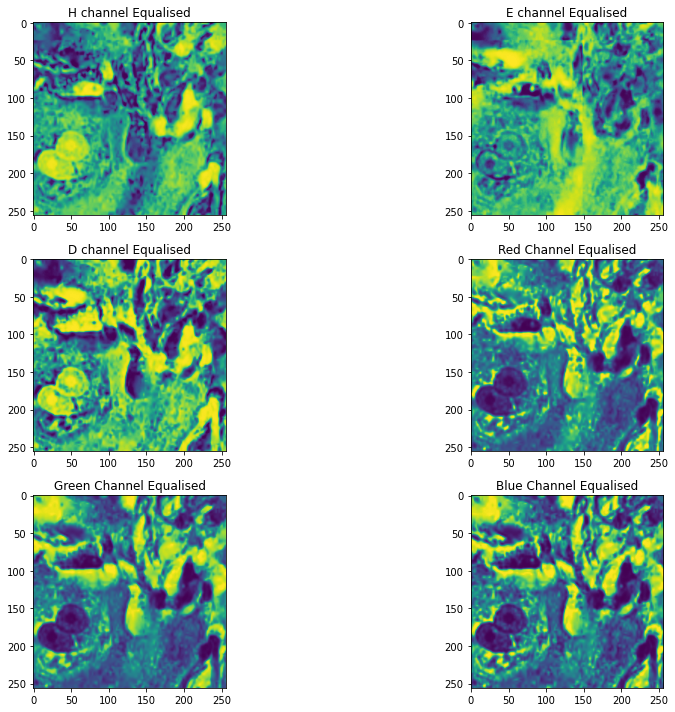

In [125]:
#Display 1 image. Note that cells are more exposure using this filter
fig, axes = plt.subplots(3, 2, figsize=(15,10))
ax = axes.ravel()

ax[0].imshow(equalized_h_channel[0])
ax[0].set_title('H channel Equalised')

ax[1].imshow(equalized_e_channel[0])
ax[1].set_title('E channel Equalised')

ax[2].imshow(equalized_d_channel[0])
ax[2].set_title('D channel Equalised')

ax[3].imshow(equalized_red_channel[0])
ax[3].set_title("Red Channel Equalised")

ax[4].imshow(equalized_green_channel[0])
ax[4].set_title("Green Channel Equalised")

ax[5].imshow(equalized_blue_channel[0])
ax[5].set_title("Blue Channel Equalised")
plt.tight_layout()

Generate Average, Variance and Entropy on Exposed images as features.

In [126]:
X0_average_equalized_h_channel = []
X0_var_equalized_h_channel = []
X0_entropy_equalized_h_channel = []

X0_average_equalized_e_channel = []
X0_var_equalized_e_channel = []
X0_entropy_equalized_e_channel = []

X0_average_equalized_d_channel = []
X0_var_equalized_d_channel = []
X0_entropy_equalized_d_channel = []

X0_average_equalized_red_channel = []
X0_var_equalized_red_channel = []
X0_entropy_equalized_red_channel = []

X0_average_equalized_green_channel = []
X0_var_equalized_green_channel = []
X0_entropy_equalized_green_channel = []

X0_average_equalized_blue_channel = []
X0_var_equalized_blue_channel = []
X0_entropy_equalized_blue_channel = []

for image_no in range(equalized_h_channel.shape[0]):
    X0_average_equalized_h_channel.append(np.mean(equalized_h_channel[image_no]))
    X0_var_equalized_h_channel.append(np.var(equalized_h_channel[image_no]))
    X0_entropy_equalized_h_channel.append(entropy_function(equalized_h_channel[image_no]))
    
    X0_average_equalized_e_channel.append(np.mean(equalized_e_channel[image_no]))
    X0_var_equalized_e_channel.append(np.var(equalized_e_channel[image_no]))
    X0_entropy_equalized_e_channel.append(entropy_function(equalized_e_channel[image_no]))
    
    X0_average_equalized_d_channel.append(np.mean(equalized_d_channel[image_no]))
    X0_var_equalized_d_channel.append(np.var(equalized_d_channel[image_no]))
    X0_entropy_equalized_d_channel.append(entropy_function(equalized_d_channel[image_no]))
    
    X0_average_equalized_red_channel.append(np.mean(equalized_red_channel[image_no]))
    X0_var_equalized_red_channel.append(np.var(equalized_red_channel[image_no]))
    X0_entropy_equalized_red_channel.append(entropy_function(equalized_red_channel[image_no]))
    
    X0_average_equalized_green_channel.append(np.mean(equalized_green_channel[image_no]))
    X0_var_equalized_green_channel.append(np.var(equalized_green_channel[image_no]))
    X0_entropy_equalized_green_channel.append(entropy_function(equalized_green_channel[image_no]))
    
    X0_average_equalized_blue_channel.append(np.mean(equalized_blue_channel[image_no]))
    X0_var_equalized_blue_channel.append(np.var(equalized_blue_channel[image_no]))
    X0_entropy_equalized_blue_channel.append(entropy_function(equalized_blue_channel[image_no]))


In [127]:
#Check correlation of each feature
corr, _ = pearsonr(X0_average_equalized_h_channel, Y0_t1_cells_count)
print('Average - H channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_h_channel, Y0_t1_cells_count)
print('VAR - H Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_h_channel, Y0_t1_cells_count)
print('Entrop - H Channel Correlation: ', corr)

corr, _ = pearsonr(X0_average_equalized_e_channel, Y0_t1_cells_count)
print('Average - E channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_e_channel, Y0_t1_cells_count)
print('VAR - E Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_e_channel, Y0_t1_cells_count)
print('Entrop - E Channel Correlation: ', corr)

corr, _ = pearsonr(X0_average_equalized_d_channel, Y0_t1_cells_count)
print('Average - D channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_d_channel, Y0_t1_cells_count)
print('VAR - D Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_d_channel, Y0_t1_cells_count)
print('Entrop - D Channel Correlation: ', corr)

corr, _ = pearsonr(X0_average_equalized_red_channel, Y0_t1_cells_count)
print('Average - Red channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_red_channel, Y0_t1_cells_count)
print('VAR - Red Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_red_channel, Y0_t1_cells_count)
print('Entrop - Red Channel Correlation: ', corr)

corr, _ = pearsonr(X0_average_equalized_green_channel, Y0_t1_cells_count)
print('Average - Green channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_green_channel, Y0_t1_cells_count)
print('VAR - Green Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_green_channel, Y0_t1_cells_count)
print('Entrop - Green Channel Correlation: ', corr)

corr, _ = pearsonr(X0_average_equalized_blue_channel, Y0_t1_cells_count)
print('Average - Blue channel Correlation: ', corr)
corr, _ = pearsonr(X0_var_equalized_blue_channel, Y0_t1_cells_count)
print('VAR - Blue Channel Correlation: ', corr)
corr, _ = pearsonr(X0_entropy_equalized_blue_channel, Y0_t1_cells_count)
print('Entrop - Blue Channel Correlation: ', corr)


Average - H channel Correlation:  0.5124170475599391
VAR - H Channel Correlation:  -0.2056744120756804
Entrop - H Channel Correlation:  -0.04129283835394372
Average - E channel Correlation:  -0.21357231662126033
VAR - E Channel Correlation:  -0.20005422984352805
Entrop - E Channel Correlation:  0.019416597338783027
Average - D channel Correlation:  0.0790598505571804
VAR - D Channel Correlation:  0.05696324633029066
Entrop - D Channel Correlation:  0.003492669875198303
Average - Red channel Correlation:  -0.4546875997657464
VAR - Red Channel Correlation:  -0.06478256728653886
Entrop - Red Channel Correlation:  0.16116971309813724
Average - Green channel Correlation:  -0.27532530822546386
VAR - Green Channel Correlation:  0.09585307457308806
Entrop - Green Channel Correlation:  0.03994139755542069
Average - Blue channel Correlation:  -0.2580770019261864
VAR - Blue Channel Correlation:  0.06676856026729117
Entrop - Blue Channel Correlation:  0.05280823322785691


In [128]:
#Append correlated Exposure features to dataframe

X0_features.append(X0_average_equalized_h_channel)
X0_features.append(X0_var_equalized_h_channel)
X0_features.append(X0_average_equalized_e_channel)
X0_features.append(X0_var_equalized_e_channel)
X0_features.append(X0_average_equalized_red_channel)
X0_features.append(X0_entropy_equalized_red_channel)

X0_features.append(X0_average_equalized_green_channel)
X0_features.append(X0_average_equalized_blue_channel)

X0_features_transpose = np.transpose(X0_features)
X0_features_df = pd.DataFrame(data=X0_features_transpose, columns=["X0_Average_H", "X0_Average_Red", "X0_Average_Green", "X0_Average_Blue", "X0_variance_hchannel", "X0_variance_red_channel", "X0_variance_green_channel" ,"X0_variance_blue_channel", "X0_entropy_hchannel", "X0_entropy_red_channel", "X0_entropy_green_channel","X0_entropy_blue_channel", "X0_average_pca_h_channel", "X0_var_pca_h_channel", "X0_average_pca_red_channel", "X0_var_pca_red_channel", "X0_average_pca_green_channel", "X0_var_pca_green_channel", "X0_average_pca_blue_channel", "X0_var_pca_blue_channel", "X0_average_equalized_h_channel", "X0_var_equalized_h_channel", "X0_average_equalized_e_channel", "X0_var_equalized_e_channel", "X0_average_equalized_red_channel", "X0_entropy_equalized_red_channel","X0_average_equalized_green_channel", "X0_average_equalized_blue_channel"])


### Plot the scatter plot and calculate the correlation coefficient of each feature in Q(2i,a-c) you obtain vs. the target variable (cell count) across all images. Which features do you think are important? Give your reasoning.

The average of the H, Red, Green, Blue channels respecetively are considerably correlated with the output variable  (T1 cell count), hence they are important features. The variance of each channel shows a low correlation. The entropy of the H and Red channel is significantly high.

PCA was introduced with 0.3 significance on the H, Red, Green, Blue channels and the average that it returns is considerably high for all channels. The average of the PCA transformed green and blue channels is higher than the average of the same channels without PCA. PCA also significantly increased the variance correlation of each channel with the output. 

Equaliser on the H, E, Red, Green, Blue channels managed to increase the correlation between the channels' average and the output feature. The variance of the equalised H and E channels is also considerably important. 

The most important features from the feature set are the equalised H channel average which reaches a Pearson's correlation of **0.51** with the output and the average of the H-channel which reaches a Pearson's correlation of **0.48**.

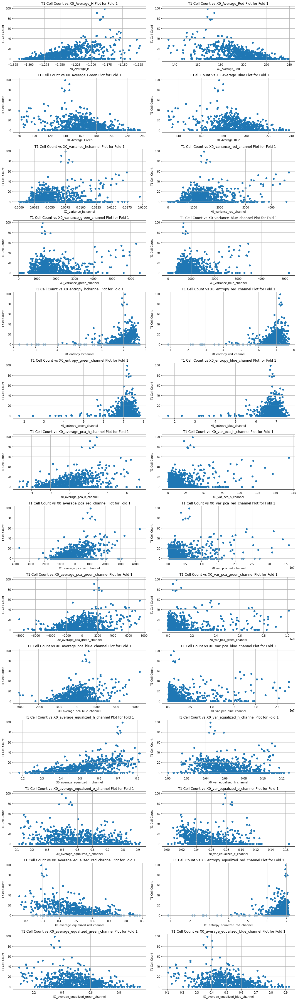

In [129]:
fig, axes = plt.subplots(14,2, figsize=(15,50))
ax = axes.ravel()
plot_no = 0
feature_name =[]
pearson_corr = []
spearman_corr = []
for feature in (X0_features_df):
    feature_name.append(feature)
    current_feature_series =X0_features_df[feature]
    #print(feature)
    ax[plot_no].scatter(current_feature_series, Y0_t1_cells_count)
    ax[plot_no].grid()
    ax[plot_no].set_xlabel(feature)
    ax[plot_no].set_ylabel('T1 Cell Count')
    title = 'T1 Cell Count vs '+feature+' Plot for Fold 1'
    ax[plot_no].set_title(title)
    corr, _ = pearsonr(current_feature_series, Y0_t1_cells_count)
    pearson_corr.append(corr)
    corr, _ = spearmanr(current_feature_series, Y0_t1_cells_count)
    spearman_corr.append(corr)
    plot_no +=1
plt.tight_layout()

In [130]:
#Concatenate Pearson and Spearman Correlation Coefficients
pearson_corr_transpose = np.transpose(pearson_corr)
spearman_corr_transpose = np.transpose(spearman_corr)

pearson_corr_df = pd.DataFrame(data=pearson_corr_transpose, index=feature_name, columns=["Pearson Correlation"])
spearman_corr_df = pd.DataFrame(data=spearman_corr_transpose, index=feature_name, columns=["Spearman Correlation"])
X0_correlation_df = pd.concat([pearson_corr_df, spearman_corr_df], axis=1)
X0_correlation_df

,Pearson Correlation,Spearman Correlation
X0_Average_H,0.475715,0.413579
X0_Average_Red,-0.436954,-0.369460
X0_Average_Green,-0.269382,-0.179689
X0_Average_Blue,-0.251774,-0.143048
X0_variance_hchannel,0.057390,-0.118073
X0_variance_red_channel,0.069881,-0.102315
X0_variance_green_channel,0.108354,-0.071299
X0_variance_blue_channel,0.062294,-0.083642
X0_entropy_hchannel,0.245742,0.326926
X0_entropy_red_channel,0.191386,0.141532


### ii. Try the following regression models with the features used in part-I. Plot the scatter plot between true and predicted counts for each type of regression model for the test data. Also, report your prediction performance in terms of RMSE, Pearson Correlation Coefficient, Spearman Correlation Coefficient and R2 score (https://scikit-learn.org/stable/modules/classes.html#module-sklearn.metrics) on the test data.

In [131]:
##Feature Generation for Fold1
Y0_t1_cells_count = Y0[:,0]

X0_hed = np.zeros(shape=(827, 256, 256, 3))
X0_h = np.zeros(shape=(827, 256, 256))
X0_e = np.zeros(shape=(827, 256, 256))

for image in range(X0.shape[0]):
    X0_hed[image] = rgb2hed(X0[image])
    X0_h[image] = X0_hed[image][:, :, 0]
    X0_e[image] = X0_hed[image][:, :, 1]

#Fold1 r/g/b
X0_red_channel = np.zeros(shape=(827, 256, 256))
X0_green_channel = np.zeros(shape=(827, 256, 256))
X0_blue_channel = np.zeros(shape=(827, 256, 256))

for image in range(X0.shape[0]):
    X0_red_channel[image] = X0[image][:,:,0]
    X0_green_channel[image] = X0[image][:,:,1]
    X0_blue_channel[image] = X0[image][:,:,2]
    
#Averages
X0_average_hchannel = []
X0_average_red_channel = []
X0_average_green_channel = []
X0_average_blue_channel = []

X0_variance_hchannel = []
X0_variance_red_channel = []
X0_variance_green_channel = []
X0_variance_blue_channel = []

X0_entropy_hchannel = []
X0_entropy_red_channel = []
X0_entropy_green_channel = []
X0_entropy_blue_channel = []

for image_no in range(X0_red_channel.shape[0]):
    X0_average_hchannel.append(np.mean(X0_h[image_no]))
    X0_average_red_channel.append(np.mean(X0_red_channel[image_no]))
    X0_average_green_channel.append(np.mean(X0_green_channel[image_no]))
    X0_average_blue_channel.append(np.mean(X0_blue_channel[image_no]))
    
    X0_variance_hchannel.append(np.var(X0_h[image_no]))
    X0_variance_red_channel.append(np.var(X0_red_channel[image_no]))
    X0_variance_green_channel.append(np.var(X0_green_channel[image_no]))
    X0_variance_blue_channel.append(np.var(X0_blue_channel[image_no]))
    
    X0_entropy_hchannel.append(entropy_function(X0_h[image_no]))
    X0_entropy_red_channel.append(entropy_function(X0_red_channel[image_no]))
    X0_entropy_green_channel.append(entropy_function(X0_green_channel[image_no]))
    X0_entropy_blue_channel.append(entropy_function(X0_blue_channel[image_no]))
    
X0_features = []
X0_features.append(X0_average_hchannel)
X0_features.append(X0_average_red_channel)
X0_features.append(X0_average_green_channel)
X0_features.append(X0_average_blue_channel)
X0_features.append(X0_variance_hchannel)
X0_features.append(X0_variance_red_channel)
X0_features.append(X0_variance_green_channel)
X0_features.append(X0_variance_blue_channel)
X0_features.append(X0_entropy_hchannel)
X0_features.append(X0_entropy_red_channel)
X0_features.append(X0_entropy_green_channel)
X0_features.append(X0_entropy_blue_channel)

#PCA
flattenned_x0_h_channel =np.zeros(shape=(827, 65536))
flattenned_x0_red_channel =np.zeros(shape=(827, 65536))
flattenned_x0_green_channel =np.zeros(shape=(827, 65536))
flattenned_x0_blue_channel =np.zeros(shape=(827, 65536))

X0_average_pca_h_channel = []
X0_var_pca_h_channel = []
X0_average_pca_red_channel = []
X0_var_pca_red_channel = []
X0_average_pca_green_channel = []
X0_var_pca_green_channel = []
X0_average_pca_blue_channel = []
X0_var_pca_blue_channel = []

for image_no in range(X0_h.shape[0]):
    flattenned_x0_h_channel[image_no] = X0_h[image_no].flatten()
    flattenned_x0_red_channel[image_no] = X0_red_channel[image_no].flatten()
    flattenned_x0_green_channel[image_no] = X0_green_channel[image_no].flatten()
    flattenned_x0_blue_channel[image_no] = X0_blue_channel[image_no].flatten()
    
pca = PCA(n_components=0.3) #0.3 explained variance
X0_pca_h_channel = pca.fit_transform(flattenned_x0_h_channel)
X0_pca_red_channel = pca.fit_transform(flattenned_x0_red_channel)
X0_pca_green_channel = pca.fit_transform(flattenned_x0_green_channel)
X0_pca_blue_channel = pca.fit_transform(flattenned_x0_blue_channel)

for image_no in range(X0_pca_h_channel.shape[0]):
    X0_average_pca_h_channel.append(np.mean(X0_pca_h_channel[image_no]))
    X0_var_pca_h_channel.append(np.var(X0_pca_h_channel[image_no]))

    X0_average_pca_red_channel.append(np.mean(X0_pca_red_channel[image_no]))
    X0_var_pca_red_channel.append(np.var(X0_pca_red_channel[image_no]))
    
    X0_average_pca_green_channel.append(np.mean(X0_pca_green_channel[image_no]))
    X0_var_pca_green_channel.append(np.var(X0_pca_green_channel[image_no]))
    
    X0_average_pca_blue_channel.append(np.mean(X0_pca_blue_channel[image_no]))
    X0_var_pca_blue_channel.append(np.var(X0_pca_blue_channel[image_no]))

X0_features.append(X0_average_pca_h_channel)
X0_features.append(X0_var_pca_h_channel)
X0_features.append(X0_average_pca_red_channel)
X0_features.append(X0_var_pca_red_channel)
X0_features.append(X0_average_pca_green_channel)
X0_features.append(X0_var_pca_green_channel)
X0_features.append(X0_average_pca_blue_channel)
X0_features.append(X0_var_pca_blue_channel)

#Equaliser
equalized_h_channel = exposure.equalize_hist(X0_h)
equalized_e_channel = exposure.equalize_hist(X0_e)
equalized_red_channel = exposure.equalize_hist(X0_red_channel)
equalized_green_channel = exposure.equalize_hist(X0_green_channel)
equalized_blue_channel = exposure.equalize_hist(X0_blue_channel)

X0_average_equalized_h_channel = []
X0_var_equalized_h_channel = []

X0_average_equalized_e_channel = []
X0_var_equalized_e_channel = []

X0_average_equalized_red_channel = []
X0_var_equalized_red_channel = []
X0_entropy_equalized_red_channel =[]

X0_average_equalized_green_channel = []
X0_var_equalized_green_channel = []

X0_average_equalized_blue_channel = []
X0_var_equalized_blue_channel = []

for image_no in range(equalized_h_channel.shape[0]):
    X0_average_equalized_h_channel.append(np.mean(equalized_h_channel[image_no]))
    X0_var_equalized_h_channel.append(np.var(equalized_h_channel[image_no]))
    
    X0_average_equalized_e_channel.append(np.mean(equalized_e_channel[image_no]))
    X0_var_equalized_e_channel.append(np.var(equalized_e_channel[image_no]))
    
    X0_average_equalized_red_channel.append(np.mean(equalized_red_channel[image_no]))
    X0_var_equalized_red_channel.append(np.var(equalized_red_channel[image_no]))
    X0_entropy_equalized_red_channel.append(entropy_function(equalized_red_channel[image_no]))

    X0_average_equalized_green_channel.append(np.mean(equalized_green_channel[image_no]))
    X0_var_equalized_green_channel.append(np.var(equalized_green_channel[image_no]))
    
    X0_average_equalized_blue_channel.append(np.mean(equalized_blue_channel[image_no]))
    X0_var_equalized_blue_channel.append(np.var(equalized_blue_channel[image_no]))

X0_features.append(X0_average_equalized_h_channel)
X0_features.append(X0_var_equalized_h_channel)
X0_features.append(X0_average_equalized_e_channel)
X0_features.append(X0_var_equalized_e_channel)
X0_features.append(X0_average_equalized_red_channel)
X0_features.append(X0_entropy_equalized_red_channel)
X0_features.append(X0_average_equalized_green_channel)
X0_features.append(X0_average_equalized_blue_channel)

X0_features_transpose = np.transpose(X0_features)

X0_features_df = pd.DataFrame(data=X0_features_transpose, columns=["X0_Average_H", "X0_Average_Red", "X0_Average_Green", "X0_Average_Blue", "X0_variance_hchannel", "X0_variance_red_channel", "X0_variance_green_channel" ,"X0_variance_blue_channel", "X0_entropy_hchannel", "X0_entropy_red_channel", "X0_entropy_green_channel","X0_entropy_blue_channel", "X0_average_pca_h_channel", "X0_var_pca_h_channel", "X0_average_pca_red_channel", "X0_var_pca_red_channel", "X0_average_pca_green_channel", "X0_var_pca_green_channel", "X0_average_pca_blue_channel", "X0_var_pca_blue_channel", "X0_average_equalized_h_channel", "X0_var_equalized_h_channel", "X0_average_equalized_e_channel", "X0_var_equalized_e_channel", "X0_average_equalized_red_channel", "X0_entropy_equalized_red_channel", "X0_average_equalized_green_channel", "X0_average_equalized_blue_channel"])

feature_name =[]
pearson_corr = []
spearman_corr = []
for feature in (X0_features_df):
    feature_name.append(feature)
    current_feature_series =X0_features_df[feature]
    corr, _ = pearsonr(current_feature_series, Y0_t1_cells_count)
    pearson_corr.append(corr)
    corr, _ = spearmanr(current_feature_series, Y0_t1_cells_count)
    spearman_corr.append(corr)
    
pearson_corr_transpose = np.transpose(pearson_corr)
spearman_corr_transpose = np.transpose(spearman_corr)

pearson_corr_df = pd.DataFrame(data=pearson_corr_transpose, index=feature_name, columns=["Pearson Correlation"])
spearman_corr_df = pd.DataFrame(data=spearman_corr_transpose, index=feature_name, columns=["Spearman Correlation"])

X0_correlation_df = pd.concat([pearson_corr_df, spearman_corr_df], axis=1)
X0_correlation_df

,Pearson Correlation,Spearman Correlation
X0_Average_H,0.475715,0.413579
X0_Average_Red,-0.436954,-0.369460
X0_Average_Green,-0.269382,-0.179689
X0_Average_Blue,-0.251774,-0.143048
X0_variance_hchannel,0.057390,-0.118073
X0_variance_red_channel,0.069881,-0.102315
X0_variance_green_channel,0.108354,-0.071299
X0_variance_blue_channel,0.062294,-0.083642
X0_entropy_hchannel,0.245742,0.326926
X0_entropy_red_channel,0.191386,0.141532


In [132]:
##Feature Generation for Fold2
Y1_t1_cells_count = Y1[:,0]

X1_hed = np.zeros(shape=(749, 256, 256, 3))
X1_h = np.zeros(shape=(749, 256, 256))
X1_e = np.zeros(shape=(749, 256, 256))

for image in range(X1.shape[0]):
    X1_hed[image] = rgb2hed(X1[image])
    X1_h[image] = X1_hed[image][:, :, 0]
    X1_e[image] = X1_hed[image][:, :, 1]

#Fold1 r/g/b
X1_red_channel = np.zeros(shape=(749, 256, 256))
X1_green_channel = np.zeros(shape=(749, 256, 256))
X1_blue_channel = np.zeros(shape=(749, 256, 256))

for image in range(X1.shape[0]):
    X1_red_channel[image] = X1[image][:,:,0]
    X1_green_channel[image] = X1[image][:,:,1]
    X1_blue_channel[image] = X1[image][:,:,2]
    
#Averages
X1_average_hchannel = []
X1_average_red_channel = []
X1_average_green_channel = []
X1_average_blue_channel = []

X1_variance_hchannel = []
X1_variance_red_channel = []
X1_variance_green_channel = []
X1_variance_blue_channel = []

X1_entropy_hchannel = []
X1_entropy_red_channel = []
X1_entropy_green_channel = []
X1_entropy_blue_channel = []

for image_no in range(X1_red_channel.shape[0]):
    X1_average_hchannel.append(np.mean(X1_h[image_no]))
    X1_average_red_channel.append(np.mean(X1_red_channel[image_no]))
    X1_average_green_channel.append(np.mean(X1_green_channel[image_no]))
    X1_average_blue_channel.append(np.mean(X1_blue_channel[image_no]))
    
    X1_variance_hchannel.append(np.var(X1_h[image_no]))
    X1_variance_red_channel.append(np.var(X1_red_channel[image_no]))
    X1_variance_green_channel.append(np.var(X1_green_channel[image_no]))
    X1_variance_blue_channel.append(np.var(X1_blue_channel[image_no]))
    
    X1_entropy_hchannel.append(entropy_function(X1_h[image_no]))
    X1_entropy_red_channel.append(entropy_function(X1_red_channel[image_no]))
    X1_entropy_green_channel.append(entropy_function(X1_green_channel[image_no]))
    X1_entropy_blue_channel.append(entropy_function(X1_blue_channel[image_no]))
    
X1_features = []
X1_features.append(X1_average_hchannel)
X1_features.append(X1_average_red_channel)
X1_features.append(X1_average_green_channel)
X1_features.append(X1_average_blue_channel)
X1_features.append(X1_variance_hchannel)
X1_features.append(X1_variance_red_channel)
X1_features.append(X1_variance_green_channel)
X1_features.append(X1_variance_blue_channel)
X1_features.append(X1_entropy_hchannel)
X1_features.append(X1_entropy_red_channel)
X1_features.append(X1_entropy_green_channel)
X1_features.append(X1_entropy_blue_channel)

#PCA
flattenned_x1_h_channel =np.zeros(shape=(749, 65536))
flattenned_x1_red_channel =np.zeros(shape=(749, 65536))
flattenned_x1_green_channel =np.zeros(shape=(749, 65536))
flattenned_x1_blue_channel =np.zeros(shape=(749, 65536))

X1_average_pca_h_channel = []
X1_var_pca_h_channel = []
X1_average_pca_red_channel = []
X1_var_pca_red_channel = []
X1_average_pca_green_channel = []
X1_var_pca_green_channel = []
X1_average_pca_blue_channel = []
X1_var_pca_blue_channel = []

for image_no in range(X1_h.shape[0]):
    flattenned_x1_h_channel[image_no] = X1_h[image_no].flatten()
    flattenned_x1_red_channel[image_no] = X1_red_channel[image_no].flatten()
    flattenned_x1_green_channel[image_no] = X1_green_channel[image_no].flatten()
    flattenned_x1_blue_channel[image_no] = X1_blue_channel[image_no].flatten()
    
pca = PCA(n_components=0.3) #0.3 explained variance
X1_pca_h_channel = pca.fit_transform(flattenned_x1_h_channel)
X1_pca_red_channel = pca.fit_transform(flattenned_x1_red_channel)
X1_pca_green_channel = pca.fit_transform(flattenned_x1_green_channel)
X1_pca_blue_channel = pca.fit_transform(flattenned_x1_blue_channel)

for image_no in range(X1_pca_h_channel.shape[0]):
    X1_average_pca_h_channel.append(np.mean(X1_pca_h_channel[image_no]))
    X1_var_pca_h_channel.append(np.var(X1_pca_h_channel[image_no]))

    X1_average_pca_red_channel.append(np.mean(X1_pca_red_channel[image_no]))
    X1_var_pca_red_channel.append(np.var(X1_pca_red_channel[image_no]))
    
    X1_average_pca_green_channel.append(np.mean(X1_pca_green_channel[image_no]))
    X1_var_pca_green_channel.append(np.var(X1_pca_green_channel[image_no]))
    
    X1_average_pca_blue_channel.append(np.mean(X1_pca_blue_channel[image_no]))
    X1_var_pca_blue_channel.append(np.var(X1_pca_blue_channel[image_no]))

X1_features.append(X1_average_pca_h_channel)
X1_features.append(X1_var_pca_h_channel)
X1_features.append(X1_average_pca_red_channel)
X1_features.append(X1_var_pca_red_channel)
X1_features.append(X1_average_pca_green_channel)
X1_features.append(X1_var_pca_green_channel)
X1_features.append(X1_average_pca_blue_channel)
X1_features.append(X1_var_pca_blue_channel)

#Equaliser
equalized_h_channel = exposure.equalize_hist(X1_h)
equalized_e_channel = exposure.equalize_hist(X1_e)
equalized_red_channel = exposure.equalize_hist(X1_red_channel)
equalized_green_channel = exposure.equalize_hist(X1_green_channel)
equalized_blue_channel = exposure.equalize_hist(X1_blue_channel)

X1_average_equalized_h_channel = []
X1_var_equalized_h_channel = []

X1_average_equalized_e_channel = []
X1_var_equalized_e_channel = []

X1_average_equalized_red_channel = []
X1_var_equalized_red_channel = []
X1_entropy_equalized_red_channel =[]

X1_average_equalized_green_channel = []
X1_var_equalized_green_channel = []

X1_average_equalized_blue_channel = []
X1_var_equalized_blue_channel = []

for image_no in range(equalized_h_channel.shape[0]):
    X1_average_equalized_h_channel.append(np.mean(equalized_h_channel[image_no]))
    X1_var_equalized_h_channel.append(np.var(equalized_h_channel[image_no]))
    
    X1_average_equalized_e_channel.append(np.mean(equalized_e_channel[image_no]))
    X1_var_equalized_e_channel.append(np.var(equalized_e_channel[image_no]))
    
    X1_average_equalized_red_channel.append(np.mean(equalized_red_channel[image_no]))
    X1_var_equalized_red_channel.append(np.var(equalized_red_channel[image_no]))
    X1_entropy_equalized_red_channel.append(entropy_function(equalized_red_channel[image_no]))
    
    X1_average_equalized_green_channel.append(np.mean(equalized_green_channel[image_no]))
    X1_var_equalized_green_channel.append(np.var(equalized_green_channel[image_no]))
    
    X1_average_equalized_blue_channel.append(np.mean(equalized_blue_channel[image_no]))
    X1_var_equalized_blue_channel.append(np.var(equalized_blue_channel[image_no]))

X1_features.append(X1_average_equalized_h_channel)
X1_features.append(X1_var_equalized_h_channel)
X1_features.append(X1_average_equalized_e_channel)
X1_features.append(X1_var_equalized_e_channel)
X1_features.append(X1_average_equalized_red_channel)
X1_features.append(X1_entropy_equalized_red_channel)
X1_features.append(X1_average_equalized_green_channel)
X1_features.append(X1_average_equalized_blue_channel)

X1_features_transpose = np.transpose(X1_features)

X1_features_df = pd.DataFrame(data=X1_features_transpose, columns=["X1_Average_H", "X1_Average_Red", "X1_Average_Green", "X1_Average_Blue", "X1_variance_hchannel", "X1_variance_red_channel", "X1_variance_green_channel" ,"X1_variance_blue_channel", "X1_entropy_hchannel", "X1_entropy_red_channel", "X1_entropy_green_channel","X1_entropy_blue_channel", "X1_average_pca_h_channel", "X1_var_pca_h_channel", "X1_average_pca_red_channel", "X1_var_pca_red_channel", "X1_average_pca_green_channel", "X1_var_pca_green_channel", "X1_average_pca_blue_channel", "X1_var_pca_blue_channel", "X1_average_equalized_h_channel", "X1_var_equalized_h_channel", "X1_average_equalized_e_channel", "X1_var_equalized_e_channel", "X1_average_equalized_red_channel", "X1_entropy_equalized_red_channel", "X1_average_equalized_green_channel", "X1_average_equalized_blue_channel"])

feature_name =[]
pearson_corr = []
spearman_corr = []
for feature in (X1_features_df):
    feature_name.append(feature)
    current_feature_series =X1_features_df[feature]
    #print(feature)    
    corr, _ = pearsonr(current_feature_series, Y1_t1_cells_count)
    pearson_corr.append(corr)
    corr, _ = spearmanr(current_feature_series, Y1_t1_cells_count)
    spearman_corr.append(corr)
    
pearson_corr_transpose = np.transpose(pearson_corr)
spearman_corr_transpose = np.transpose(spearman_corr)

pearson_corr_df = pd.DataFrame(data=pearson_corr_transpose, index=feature_name, columns=["Pearson Correlation"])
spearman_corr_df = pd.DataFrame(data=spearman_corr_transpose, index=feature_name, columns=["Spearman Correlation"])

X1_correlation_df = pd.concat([pearson_corr_df, spearman_corr_df], axis=1)
X1_correlation_df

,Pearson Correlation,Spearman Correlation
X1_Average_H,0.476531,0.425957
X1_Average_Red,-0.442249,-0.390928
X1_Average_Green,-0.277621,-0.206939
X1_Average_Blue,-0.245821,-0.161175
X1_variance_hchannel,0.008898,-0.138249
X1_variance_red_channel,0.013234,-0.124979
X1_variance_green_channel,0.046798,-0.089826
X1_variance_blue_channel,-0.004330,-0.107743
X1_entropy_hchannel,0.234579,0.326189
X1_entropy_red_channel,0.178764,0.162148


In [133]:
##Feature Generation for Fold3
Y2_t1_cells_count = Y2[:,0]

X2_hed = np.zeros(shape=(775, 256, 256, 3))
X2_h = np.zeros(shape=(775, 256, 256))
X2_e = np.zeros(shape=(775, 256, 256))

for image in range(X2.shape[0]):
    X2_hed[image] = rgb2hed(X2[image])
    X2_h[image] = X2_hed[image][:, :, 0]
    X2_e[image] = X2_hed[image][:, :, 1]

#Fold1 r/g/b
X2_red_channel = np.zeros(shape=(775, 256, 256))
X2_green_channel = np.zeros(shape=(775, 256, 256))
X2_blue_channel = np.zeros(shape=(775, 256, 256))

for image in range(X2.shape[0]):
    X2_red_channel[image] = X2[image][:,:,0]
    X2_green_channel[image] = X2[image][:,:,1]
    X2_blue_channel[image] = X2[image][:,:,2]
    
#Averages
X2_average_hchannel = []
X2_average_red_channel = []
X2_average_green_channel = []
X2_average_blue_channel = []

X2_variance_hchannel = []
X2_variance_red_channel = []
X2_variance_green_channel = []
X2_variance_blue_channel = []

X2_entropy_hchannel = []
X2_entropy_red_channel = []
X2_entropy_green_channel = []
X2_entropy_blue_channel = []

for image_no in range(X2_red_channel.shape[0]):
    X2_average_hchannel.append(np.mean(X2_h[image_no]))
    X2_average_red_channel.append(np.mean(X2_red_channel[image_no]))
    X2_average_green_channel.append(np.mean(X2_green_channel[image_no]))
    X2_average_blue_channel.append(np.mean(X2_blue_channel[image_no]))
    
    X2_variance_hchannel.append(np.var(X2_h[image_no]))
    X2_variance_red_channel.append(np.var(X2_red_channel[image_no]))
    X2_variance_green_channel.append(np.var(X2_green_channel[image_no]))
    X2_variance_blue_channel.append(np.var(X2_blue_channel[image_no]))
    
    X2_entropy_hchannel.append(entropy_function(X2_h[image_no]))
    X2_entropy_red_channel.append(entropy_function(X2_red_channel[image_no]))
    X2_entropy_green_channel.append(entropy_function(X2_green_channel[image_no]))
    X2_entropy_blue_channel.append(entropy_function(X2_blue_channel[image_no]))
    
X2_features = []
X2_features.append(X2_average_hchannel)
X2_features.append(X2_average_red_channel)
X2_features.append(X2_average_green_channel)
X2_features.append(X2_average_blue_channel)
X2_features.append(X2_variance_hchannel)
X2_features.append(X2_variance_red_channel)
X2_features.append(X2_variance_green_channel)
X2_features.append(X2_variance_blue_channel)
X2_features.append(X2_entropy_hchannel)
X2_features.append(X2_entropy_red_channel)
X2_features.append(X2_entropy_green_channel)
X2_features.append(X2_entropy_blue_channel)

#PCA
flattenned_X2_h_channel =np.zeros(shape=(775, 65536))
flattenned_X2_red_channel =np.zeros(shape=(775, 65536))
flattenned_X2_green_channel =np.zeros(shape=(775, 65536))
flattenned_X2_blue_channel =np.zeros(shape=(775, 65536))

X2_average_pca_h_channel = []
X2_var_pca_h_channel = []
X2_average_pca_red_channel = []
X2_var_pca_red_channel = []
X2_average_pca_green_channel = []
X2_var_pca_green_channel = []
X2_average_pca_blue_channel = []
X2_var_pca_blue_channel = []

for image_no in range(X2_h.shape[0]):
    flattenned_X2_h_channel[image_no] = X2_h[image_no].flatten()
    flattenned_X2_red_channel[image_no] = X2_red_channel[image_no].flatten()
    flattenned_X2_green_channel[image_no] = X2_green_channel[image_no].flatten()
    flattenned_X2_blue_channel[image_no] = X2_blue_channel[image_no].flatten()
    
pca = PCA(n_components=0.3) #0.3 explained variance
X2_pca_h_channel = pca.fit_transform(flattenned_X2_h_channel)
X2_pca_red_channel = pca.fit_transform(flattenned_X2_red_channel)
X2_pca_green_channel = pca.fit_transform(flattenned_X2_green_channel)
X2_pca_blue_channel = pca.fit_transform(flattenned_X2_blue_channel)

for image_no in range(X2_pca_h_channel.shape[0]):
    X2_average_pca_h_channel.append(np.mean(X2_pca_h_channel[image_no]))
    X2_var_pca_h_channel.append(np.var(X2_pca_h_channel[image_no]))

    X2_average_pca_red_channel.append(np.mean(X2_pca_red_channel[image_no]))
    X2_var_pca_red_channel.append(np.var(X2_pca_red_channel[image_no]))
    
    X2_average_pca_green_channel.append(np.mean(X2_pca_green_channel[image_no]))
    X2_var_pca_green_channel.append(np.var(X2_pca_green_channel[image_no]))
    
    X2_average_pca_blue_channel.append(np.mean(X2_pca_blue_channel[image_no]))
    X2_var_pca_blue_channel.append(np.var(X2_pca_blue_channel[image_no]))

X2_features.append(X2_average_pca_h_channel)
X2_features.append(X2_var_pca_h_channel)
X2_features.append(X2_average_pca_red_channel)
X2_features.append(X2_var_pca_red_channel)
X2_features.append(X2_average_pca_green_channel)
X2_features.append(X2_var_pca_green_channel)
X2_features.append(X2_average_pca_blue_channel)
X2_features.append(X2_var_pca_blue_channel)

#Equaliser
equalized_h_channel = exposure.equalize_hist(X2_h)
equalized_e_channel = exposure.equalize_hist(X2_e)
equalized_red_channel = exposure.equalize_hist(X2_red_channel)
equalized_green_channel = exposure.equalize_hist(X2_green_channel)
equalized_blue_channel = exposure.equalize_hist(X2_blue_channel)

X2_average_equalized_h_channel = []
X2_var_equalized_h_channel = []

X2_average_equalized_e_channel = []
X2_var_equalized_e_channel = []

X2_average_equalized_red_channel = []
X2_var_equalized_red_channel = []
X2_entropy_equalized_red_channel =[]

X2_average_equalized_green_channel = []
X2_var_equalized_green_channel = []

X2_average_equalized_blue_channel = []
X2_var_equalized_blue_channel = []

for image_no in range(equalized_h_channel.shape[0]):
    X2_average_equalized_h_channel.append(np.mean(equalized_h_channel[image_no]))
    X2_var_equalized_h_channel.append(np.var(equalized_h_channel[image_no]))
    
    X2_average_equalized_e_channel.append(np.mean(equalized_e_channel[image_no]))
    X2_var_equalized_e_channel.append(np.var(equalized_e_channel[image_no]))
    
    X2_average_equalized_red_channel.append(np.mean(equalized_red_channel[image_no]))
    X2_var_equalized_red_channel.append(np.var(equalized_red_channel[image_no]))
    X2_entropy_equalized_red_channel.append(entropy_function(equalized_red_channel[image_no]))
    
    X2_average_equalized_green_channel.append(np.mean(equalized_green_channel[image_no]))
    X2_var_equalized_green_channel.append(np.var(equalized_green_channel[image_no]))
    
    X2_average_equalized_blue_channel.append(np.mean(equalized_blue_channel[image_no]))
    X2_var_equalized_blue_channel.append(np.var(equalized_blue_channel[image_no]))

X2_features.append(X2_average_equalized_h_channel)
X2_features.append(X2_var_equalized_h_channel)
X2_features.append(X2_average_equalized_e_channel)
X2_features.append(X2_var_equalized_e_channel)
X2_features.append(X2_average_equalized_red_channel)
X2_features.append(X2_entropy_equalized_red_channel)
X2_features.append(X2_average_equalized_green_channel)
X2_features.append(X2_average_equalized_blue_channel)

X2_features_transpose = np.transpose(X2_features)

X2_features_df = pd.DataFrame(data=X2_features_transpose, columns=["X2_Average_H", "X2_Average_Red", "X2_Average_Green", "X2_Average_Blue", "X2_variance_hchannel", "X2_variance_red_channel", "X2_variance_green_channel" ,"X2_variance_blue_channel", "X2_entropy_hchannel", "X2_entropy_red_channel", "X2_entropy_green_channel","X2_entropy_blue_channel", "X2_average_pca_h_channel", "X2_var_pca_h_channel", "X2_average_pca_red_channel", "X2_var_pca_red_channel", "X2_average_pca_green_channel", "X2_var_pca_green_channel", "X2_average_pca_blue_channel", "X2_var_pca_blue_channel", "X2_average_equalized_h_channel", "X2_var_equalized_h_channel", "X2_average_equalized_e_channel", "X2_var_equalized_e_channel", "X2_average_equalized_red_channel", "X2_entropy_equalized_red_channel", "X2_average_equalized_green_channel", "X2_average_equalized_blue_channel"])

feature_name =[]
pearson_corr = []
spearman_corr = []
for feature in (X2_features_df):
    feature_name.append(feature)
    current_feature_series =X2_features_df[feature]
    #print(feature)    
    corr, _ = pearsonr(current_feature_series, Y2_t1_cells_count)
    pearson_corr.append(corr)
    corr, _ = spearmanr(current_feature_series, Y2_t1_cells_count)
    spearman_corr.append(corr)
    
pearson_corr_transpose = np.transpose(pearson_corr)
spearman_corr_transpose = np.transpose(spearman_corr)

pearson_corr_df = pd.DataFrame(data=pearson_corr_transpose, index=feature_name, columns=["Pearson Correlation"])
spearman_corr_df = pd.DataFrame(data=spearman_corr_transpose, index=feature_name, columns=["Spearman Correlation"])

X2_correlation_df = pd.concat([pearson_corr_df, spearman_corr_df], axis=1)
X2_correlation_df

,Pearson Correlation,Spearman Correlation
X2_Average_H,0.479114,0.404789
X2_Average_Red,-0.454295,-0.375973
X2_Average_Green,-0.299946,-0.195676
X2_Average_Blue,-0.295856,-0.173533
X2_variance_hchannel,0.177150,-0.021675
X2_variance_red_channel,0.206649,0.009769
X2_variance_green_channel,0.255922,0.041727
X2_variance_blue_channel,0.229081,0.036768
X2_entropy_hchannel,0.262730,0.301080
X2_entropy_red_channel,0.219860,0.178541


In [134]:
#create dataframe for results storage
regression_results = pd.DataFrame(columns=['RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

Experiment showed that using the **full list of features** extracted gives better results for each Machine Learning model than when using a reduced representation of the most correlation features as training, validation and testing datasets.

### a. Ordinary Least Squares (OLS) regression

In [135]:
#OLSR
params = {'fit_intercept':[True,False], 'normalize':[True,False]}
olsr_grid = GridSearchCV(LinearRegression(), params, n_jobs=-1, verbose=2, cv=10)

olsr_grid.fit(X0_features_df, Y0_t1_cells_count)

y1_test_pred= olsr_grid.predict(X1_features_df)

olsr_valid_rmse = mean_squared_error(Y1_t1_cells_count, y1_test_pred, squared=False)
olsr_valid_pears_corr, _ = pearsonr(Y1_t1_cells_count, y1_test_pred)
olsr_valid_spearman_corr, _ = spearmanr(Y1_t1_cells_count, y1_test_pred)
olsr_valid_r_squred = r2_score(Y1_t1_cells_count, y1_test_pred)

print("**************************************")
print("Validation RMSE :", olsr_valid_rmse )
print("Validation Pearson Correlation Coefficient :", olsr_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", olsr_valid_spearman_corr )
print("Validation R2 Score :", olsr_valid_r_squred )
print("**************************************")

y2_test_pred_olsr = olsr_grid.predict(X2_features_df)

olsr_test_rmse = mean_squared_error(Y2_t1_cells_count, y2_test_pred_olsr, squared=False)
olsr_test_pears_corr, _ = pearsonr(Y2_t1_cells_count, y2_test_pred_olsr)
olsr_test_spearman_corr, _ = spearmanr(Y2_t1_cells_count, y2_test_pred_olsr)
olsr_test_r_squred = r2_score(Y2_t1_cells_count, y2_test_pred_olsr)

row = pd.Series({'RMSE': olsr_test_rmse, 'Pearson Correlation': olsr_test_pears_corr, 'Spearman Correlation': olsr_test_spearman_corr, 'R2':olsr_test_r_squred},name='OLS Regression')
regression_results = regression_results.append(row)

print("Test RMSE :", olsr_test_rmse )
print("Test Pearson Correlation Coefficient :", olsr_test_pears_corr )
print("Test Spearman Correlation Coefficient :", olsr_test_spearman_corr )
print("Test R2 Score :", olsr_test_r_squred )
print("**************************************")
print("Grid Search Results")
print("Best: %f using %s" % (olsr_grid.best_score_, olsr_grid.best_params_))
means = olsr_grid.cv_results_['mean_test_score']
stds = olsr_grid.cv_results_['std_test_score']
params = olsr_grid.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("Mean: %f (StdDev:%f), using Params: %r" % (mean, stdev, param))
    
print("**************************************")

Fitting 10 folds for each of 4 candidates, totalling 40 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.


**************************************
Validation RMSE : 8.903054016606639
Validation Pearson Correlation Coefficient : 0.680418026568213
Validation Spearman Correlation Coefficient : 0.6171160997480828
Validation R2 Score : 0.4617475377910235
**************************************
Test RMSE : 8.905184119807409
Test Pearson Correlation Coefficient : 0.6293624265433646
Test Spearman Correlation Coefficient : 0.5923359578302818
Test R2 Score : 0.37374139095950054
**************************************
Grid Search Results
Best: -0.597032 using {'fit_intercept': False, 'normalize': True}
Mean: -0.639263 (StdDev:1.649831), using Params: {'fit_intercept': True, 'normalize': True}
Mean: -0.639263 (StdDev:1.649831), using Params: {'fit_intercept': True, 'normalize': False}
Mean: -0.597032 (StdDev:1.585989), using Params: {'fit_intercept': False, 'normalize': True}
Mean: -0.597032 (StdDev:1.585989), using Params: {'fit_intercept': False, 'normalize': False}
*************************************

[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done  22 out of  40 | elapsed:    4.0s remaining:    3.3s
[Parallel(n_jobs=-1)]: Done  40 out of  40 | elapsed:    4.1s finished


### b. Multilayer Perceptron (in Keras)

The MLP implementation was designed using Early stopping which stops training if after 30 epochs, no further reduction in model loss is achieved. The weights were the model loss is lowest are then restored and used for predictions.

In [136]:
#Convert arrays to floats for RMSE calculation
Y0_t1_cells_count = Y0_t1_cells_count/1.0
Y1_t1_cells_count = Y1_t1_cells_count/1.0
Y2_t1_cells_count = Y2_t1_cells_count/1.0

In [137]:
#scale on full ds
scaler = StandardScaler()

X0_features_df_StandardScaler = scaler.fit_transform(X0_features_df)
X1_features_df_StandardScaler = scaler.transform(X1_features_df)
X2_features_df_StandardScaler = scaler.transform(X2_features_df)

In [139]:
#with early stop, dropout - std scaler

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
        return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    
mlp_model = Sequential()
mlp_model.add(Dense(100, input_dim=28, activation='relu'))
mlp_model.add(Dropout(0.2))
mlp_model.add(Dense(50, activation='relu'))
mlp_model.add(Dropout(0.2))
mlp_model.add(Dense(1, activation='relu'))

# compile the keras model
mlp_model.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 
earlystopping=EarlyStopping(monitor="val_loss", patience=30, verbose=2, mode='auto',restore_best_weights=True)

# fit the keras model on the dataset
mlp_history = mlp_model.fit(X0_features_df_StandardScaler, Y0_t1_cells_count,validation_data=(X1_features_df_StandardScaler, Y1_t1_cells_count), epochs=300, batch_size=10, callbacks=[earlystopping])


Epoch 1/300
83/83 [==============================] - 0s 4ms/step - loss: 11.8381 - rmse: 8.2178 - val_loss: 8.2065 - val_rmse: 6.7202
Epoch 2/300
83/83 [==============================] - 0s 2ms/step - loss: 9.0706 - rmse: 6.3853 - val_loss: 7.2846 - val_rmse: 5.7767
Epoch 3/300
83/83 [==============================] - 0s 2ms/step - loss: 8.6387 - rmse: 5.9857 - val_loss: 7.1253 - val_rmse: 5.6486
Epoch 4/300
83/83 [==============================] - 0s 2ms/step - loss: 8.3832 - rmse: 5.7482 - val_loss: 6.9689 - val_rmse: 5.3539
Epoch 5/300
83/83 [==============================] - 0s 3ms/step - loss: 7.9739 - rmse: 5.5116 - val_loss: 6.8484 - val_rmse: 5.2004
Epoch 6/300
83/83 [==============================] - 0s 2ms/step - loss: 7.5714 - rmse: 5.1963 - val_loss: 6.5370 - val_rmse: 4.8990
Epoch 7/300
83/83 [==============================] - 0s 2ms/step - loss: 7.6420 - rmse: 5.2830 - val_loss: 6.6582 - val_rmse: 5.0385
Epoch 8/300
83/83 [==============================] - 0s 2ms/step - l

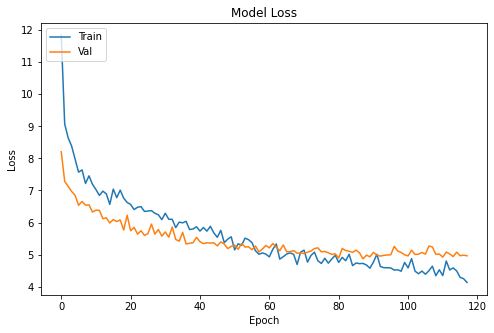

**************************************
Validation RMSE : 5.549980835218142
Validation Pearson Correlation Coefficient : 0.889547911937274
Validation Spearman Correlation Coefficient : 0.799005125534253
Validation R2 Score : 0.7908340557885444
**************************************
**************************************
Test RMSE : 6.5033883901127005
Test Pearson Correlation Coefficient : 0.8204281174660408
Test Spearman Correlation Coefficient : 0.7876728712649452
Test R2 Score : 0.6659993704216086
**************************************


In [140]:
plt.figure(figsize=(8,5))
plt.plot(mlp_history.history['loss'])
plt.plot(mlp_history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

y1_test_pred_mlp= mlp_model.predict(X1_features_df_StandardScaler)
pred = []
for i in y1_test_pred_mlp:
    pred.append(i[0])
y1_test_pred_mlp = pred


mlp_valid_rmse = mean_squared_error(Y1_t1_cells_count, y1_test_pred_mlp, squared=False)
mlp_valid_pears_corr, _ = pearsonr(Y1_t1_cells_count, y1_test_pred_mlp)
mlp_valid_spearman_corr, _ = spearmanr(Y1_t1_cells_count, y1_test_pred_mlp)
mlp_valid_r_squred = r2_score(Y1_t1_cells_count, y1_test_pred_mlp)

print("**************************************")
print("Validation RMSE :", mlp_valid_rmse )
print("Validation Pearson Correlation Coefficient :", mlp_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", mlp_valid_spearman_corr )
print("Validation R2 Score :", mlp_valid_r_squred )
print("**************************************")

y2_test_pred_mlp = mlp_model.predict(X2_features_df_StandardScaler)
pred = []
for i in y2_test_pred_mlp:
    pred.append(i[0])
y2_test_pred_mlp = pred

mlp_test_rmse = mean_squared_error(Y2_t1_cells_count, y2_test_pred_mlp, squared=False)
mlp_test_pears_corr, _ = pearsonr(Y2_t1_cells_count, y2_test_pred_mlp)
mlp_test_spearman_corr, _ = spearmanr(Y2_t1_cells_count, y2_test_pred_mlp)
mlp_test_r_squred = r2_score(Y2_t1_cells_count, y2_test_pred_mlp)

row = pd.Series({'RMSE': mlp_test_rmse, 'Pearson Correlation': mlp_test_pears_corr, 'Spearman Correlation': mlp_test_spearman_corr, 'R2':mlp_test_r_squred},name='Multilayer Perceptron')
regression_results = regression_results.append(row)

print("**************************************")
print("Test RMSE :", mlp_test_rmse )
print("Test Pearson Correlation Coefficient :", mlp_test_pears_corr )
print("Test Spearman Correlation Coefficient :", mlp_test_spearman_corr )
print("Test R2 Score :", mlp_test_r_squred )
print("**************************************")


### c. Support Vector Regression

The optimal SVR implementation was achieved by using the data in Fold 1 and the first half of the data in Fold2 as training set, the second half of Fold2 as validation, and Fold3 as testing set.

In [141]:
Y1_t1_cells_count_1stHalf = Y1_t1_cells_count[:374].copy()
Y0_Y1_t1_cells_count = np.concatenate((Y0_t1_cells_count, Y1_t1_cells_count_1stHalf))
Y1_t1_cells_count_2ndhalf = Y1_t1_cells_count[374:].copy()


In [142]:
#Use the Fold 1 and Half of Fold 2 for Training, the Second Half of Fold2 for Validation and Fold3 for Testing
X1_features_df_full_optimised_copy = X1_features_df[:374].copy()
X1_features_df_full_2ndhalf = X1_features_df[374:].copy()
X1_features_df_full_optimised_copy.rename(columns={'X1_Average_H': 'X0_Average_H', 'X1_Average_Red': 'X0_Average_Red', 'X1_Average_Green': 'X0_Average_Green', 'X1_Average_Blue': 'X0_Average_Blue', 'X1_variance_hchannel':'X0_variance_hchannel',"X1_variance_red_channel":"X0_variance_red_channel",'X1_variance_green_channel': 'X0_variance_green_channel', "X1_variance_blue_channel":"X0_variance_blue_channel",'X1_entropy_hchannel': 'X0_entropy_hchannel', 'X1_entropy_red_channel': 'X0_entropy_red_channel', "X1_entropy_green_channel":"X0_entropy_green_channel","X1_entropy_blue_channel":"X0_entropy_blue_channel",'X1_average_pca_h_channel': 'X0_average_pca_h_channel', 'X1_var_pca_h_channel': 'X0_var_pca_h_channel', 'X1_average_pca_red_channel': 'X0_average_pca_red_channel', 'X1_var_pca_red_channel': 'X0_var_pca_red_channel', 'X1_average_pca_green_channel': 'X0_average_pca_green_channel', 'X1_var_pca_green_channel': 'X0_var_pca_green_channel', 'X1_average_pca_blue_channel': 'X0_average_pca_blue_channel', 'X1_var_pca_blue_channel': 'X0_var_pca_blue_channel', 'X1_average_equalized_h_channel': 'X0_average_equalized_h_channel', 'X1_var_equalized_h_channel': 'X0_var_equalized_h_channel', 'X1_average_equalized_e_channel': 'X0_average_equalized_e_channel', 'X1_var_equalized_e_channel': 'X0_var_equalized_e_channel', 'X1_average_equalized_red_channel': 'X0_average_equalized_red_channel', 'X1_entropy_equalized_red_channel': 'X0_entropy_equalized_red_channel', 'X1_average_equalized_green_channel': 'X0_average_equalized_green_channel', 'X1_average_equalized_blue_channel': 'X0_average_equalized_blue_channel'}, inplace=True)
frames = [X0_features_df,X1_features_df_full_optimised_copy]
X0_X1_features_df_full_optimised = pd.concat(frames, ignore_index=True)

scaler = StandardScaler()
X0_X1_features_df_StandardScaler = scaler.fit_transform(X0_X1_features_df_full_optimised)
X1_features_df_2ndhalf_StandardScaler = scaler.transform(X1_features_df_full_2ndhalf)
X2_features_df_StandardScaler = scaler.transform(X2_features_df)


In [143]:
params = [{"kernel":["rbf"], "epsilon":[0.00001,0.0001,0.001,0.01, 0.1,1,10,50],"gamma": [0.00001,0.0001,0.001,0.01,0.1,1,10], "C": [30,200,500,1000,1800,2000,2500,3000,3500]},]
svr_grid = GridSearchCV(SVR(), params, n_jobs=-1, verbose=2, cv=5)

svr_grid.fit(X0_X1_features_df_StandardScaler, Y0_Y1_t1_cells_count)

y1_test_pred= svr_grid.predict(X1_features_df_2ndhalf_StandardScaler)

svr_valid_rmse = mean_squared_error(Y1_t1_cells_count_2ndhalf, y1_test_pred, squared=False)
svr_valid_pears_corr, _ = pearsonr(Y1_t1_cells_count_2ndhalf, y1_test_pred)
svr_valid_spearman_corr, _ = spearmanr(Y1_t1_cells_count_2ndhalf, y1_test_pred)
svr_valid_r_squred = r2_score(Y1_t1_cells_count_2ndhalf, y1_test_pred)

print("**************************************")
print("Validation RMSE :", svr_valid_rmse )
print("Validation Pearson Correlation Coefficient :", svr_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", svr_valid_spearman_corr )
print("Validation R2 Score :", svr_valid_r_squred )
print("**************************************")

y2_test_pred_svr= svr_grid.predict(X2_features_df_StandardScaler)

svr_test_rmse = mean_squared_error(Y2_t1_cells_count, y2_test_pred_svr, squared=False)
svr_test_pears_corr, _ = pearsonr(Y2_t1_cells_count, y2_test_pred_svr)
svr_test_spearman_corr, _ = spearmanr(Y2_t1_cells_count, y2_test_pred_svr)
svr_test_r_squred = r2_score(Y2_t1_cells_count, y2_test_pred_svr)

row = pd.Series({'RMSE': svr_test_rmse, 'Pearson Correlation': svr_test_pears_corr, 'Spearman Correlation': svr_test_spearman_corr, 'R2':svr_test_r_squred},name='Support Vector Regression')
regression_results = regression_results.append(row)

print("**************************************")
print("RMSE :", svr_test_rmse )
print("Pearson Correlation Coefficient :", svr_test_pears_corr )
print("Spearman Correlation Coefficient :", svr_test_spearman_corr )
print("R2 Score :", svr_test_r_squred )


print("**************************************")
print("Grid Search Results")
print("Best: %f using %s" % (svr_grid.best_score_, svr_grid.best_params_))
means = svr_grid.cv_results_['mean_test_score']
stds = svr_grid.cv_results_['std_test_score']
params = svr_grid.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("Mean: %f (StdDev:%f), using Params: %r" % (mean, stdev, param))
print("**************************************")

Fitting 5 folds for each of 504 candidates, totalling 2520 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done   1 tasks      | elapsed:    2.9s
[Parallel(n_jobs=-1)]: Done 122 tasks      | elapsed:    4.0s
[Parallel(n_jobs=-1)]: Done 442 tasks      | elapsed:    7.0s
[Parallel(n_jobs=-1)]: Done 1077 tasks      | elapsed:   17.2s
[Parallel(n_jobs=-1)]: Done 1580 tasks      | elapsed:   31.9s
[Parallel(n_jobs=-1)]: Done 2164 tasks      | elapsed:   50.4s
[Parallel(n_jobs=-1)]: Done 2520 out of 2520 | elapsed:  1.1min finished


**************************************
Validation RMSE : 8.508906761257071
Validation Pearson Correlation Coefficient : 0.8300054725034591
Validation Spearman Correlation Coefficient : 0.7452396600713888
Validation R2 Score : 0.6551334681902139
**************************************
**************************************
RMSE : 7.164976222581686
Pearson Correlation Coefficient : 0.7764041088609756
Spearman Correlation Coefficient : 0.7467901286326177
R2 Score : 0.5945872436277262
**************************************
Grid Search Results
Best: 0.337545 using {'C': 30, 'epsilon': 1, 'gamma': 0.1, 'kernel': 'rbf'}
Mean: -0.143169 (StdDev:0.254653), using Params: {'C': 30, 'epsilon': 1e-05, 'gamma': 1e-05, 'kernel': 'rbf'}
Mean: 0.132300 (StdDev:0.243414), using Params: {'C': 30, 'epsilon': 1e-05, 'gamma': 0.0001, 'kernel': 'rbf'}
Mean: 0.226663 (StdDev:0.217848), using Params: {'C': 30, 'epsilon': 1e-05, 'gamma': 0.001, 'kernel': 'rbf'}
Mean: 0.310446 (StdDev:0.212646), using Params: {'C

#### Scatter Plots between True and Precited Values

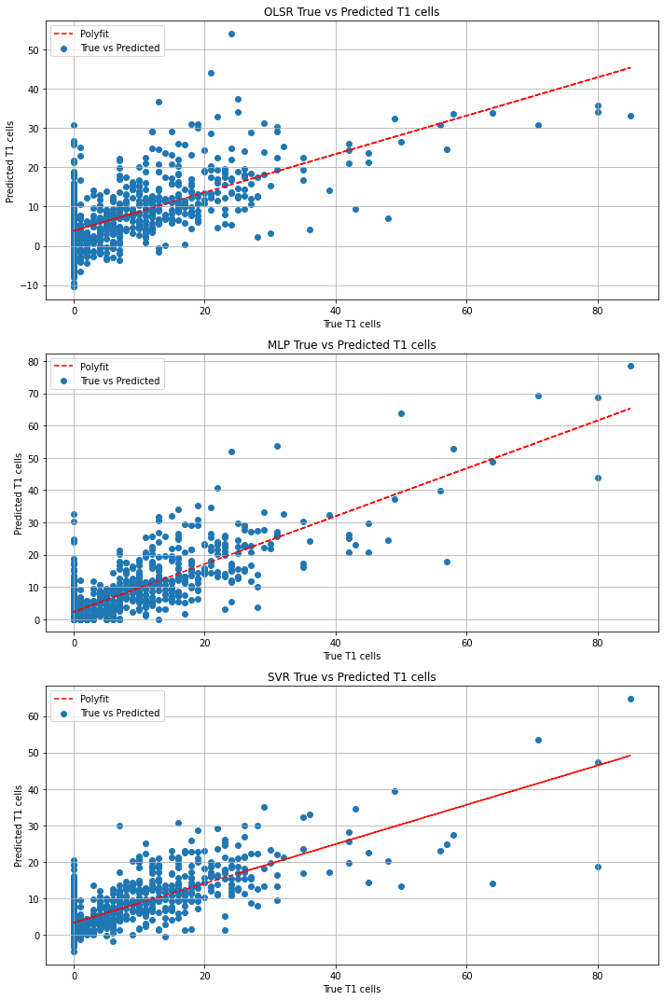

In [144]:
#Fold 1
fig, (ax1,ax2,ax3) = plt.subplots(3, figsize=(10,15))

ax1.scatter(Y2_t1_cells_count, y2_test_pred_olsr, label='True vs Predicted')
m, b = np.polyfit(Y2_t1_cells_count, y2_test_pred_olsr, 1)
ax1.plot(Y2_t1_cells_count, m*Y2_t1_cells_count + b,'r--', label='Polyfit')
ax1.grid()
ax1.legend(loc='upper left')
ax1.set_xlabel('True T1 cells')
ax1.set_ylabel('Predicted T1 cells')
ax1.set_title('OLSR True vs Predicted T1 cells')

ax2.scatter(Y2_t1_cells_count, y2_test_pred_mlp, label='True vs Predicted')
m, b = np.polyfit(Y2_t1_cells_count, y2_test_pred_mlp, 1)
ax2.plot(Y2_t1_cells_count, m*Y2_t1_cells_count + b,'r--', label='Polyfit')
ax2.grid()
ax2.legend(loc='upper left')
ax2.set_xlabel('True T1 cells')
ax2.set_ylabel('Predicted T1 cells')
ax2.set_title('MLP True vs Predicted T1 cells')

ax3.scatter(Y2_t1_cells_count, y2_test_pred_svr, label='True vs Predicted')
m, b = np.polyfit(Y2_t1_cells_count, y2_test_pred_svr, 1)
ax3.plot(Y2_t1_cells_count, m*Y2_t1_cells_count + b,'r--', label='Polyfit')
ax3.grid()
ax3.legend(loc='upper left')
ax3.set_xlabel('True T1 cells')
ax3.set_ylabel('Predicted T1 cells')
ax3.set_title('SVR True vs Predicted T1 cells')

plt.tight_layout()

### Summarised Results

From the summarised results below, it can be concluded that the Multilayer Perceptron model returns the best results (lowest RMSE and highest correlation coefficients). The high R2 score is attributed towards the use of the full datasets as input features to each model.

In [145]:
regression_results

,RMSE,Pearson Correlation,Spearman Correlation,R2
OLS Regression,8.905184,0.629362,0.592336,0.373741
Multilayer Perceptron,6.503388,0.820428,0.787673,0.665999
Support Vector Regression,7.164976,0.776404,0.746790,0.594587


# Question No. 3: Using Convolution Neural Networks [40 Marks]

## a. Use a Convolution Neural Network (in Keras) to solve this problem.

For this problem, two CNN models were designed and compared:
1. A customer CNN 
2. A CNN using ResNet50 transfer learning

Both models had Early stopping implementation, which restores the best model weights based on the least validation loss obtained during training. 

The experiments showed that the **CNN using ResNet50** transfer learning returned the optimal results (lowest RMSE and highest Pearson correlation) and hence, it was chosen as the best model for this question.


In [7]:
#STANDARDISE train, valid and test sets
X_mean = X0.mean(axis=0, keepdims=True)
X_std = X0.std(axis=0, keepdims=True)
X_train_StandardScaler = (X0 - X_mean) / X_std
X_valid_StandardScaler = (X1 - X_mean) / X_std
X_test_StandardScaler = (X2 - X_mean) / X_std

#reshape data to fit model
X_train = X_train_StandardScaler.reshape(827, 256, 256, 3)
X_valid = X_valid_StandardScaler.reshape(749, 256, 256, 3)
X_test = X_test_StandardScaler.reshape(775, 256, 256, 3)


In [8]:
#Load individual cells for each Fold
Y0_t1_cells_count = Y0[:,0]
Y0_t2_cells_count = Y0[:,1]
Y0_t3_cells_count = Y0[:,2]
Y0_t4_cells_count = Y0[:,3]
Y0_t5_cells_count = Y0[:,4]
Y0_t6_cells_count = Y0[:,5]


Y1_t1_cells_count = Y1[:,0]
Y1_t2_cells_count = Y1[:,1]
Y1_t3_cells_count = Y1[:,2]
Y1_t4_cells_count = Y1[:,3]
Y1_t5_cells_count = Y1[:,4]
Y1_t6_cells_count = Y1[:,5]


Y2_t1_cells_count = Y2[:,0]
Y2_t2_cells_count = Y2[:,1]
Y2_t3_cells_count = Y2[:,2]
Y2_t4_cells_count = Y2[:,3]
Y2_t5_cells_count = Y2[:,4]
Y2_t6_cells_count = Y2[:,5]


In [9]:
#Convert arrays to floats for RMSE calculation
Y0_t1_cells_count = Y0_t1_cells_count/1.0
Y1_t1_cells_count = Y1_t1_cells_count/1.0
Y2_t1_cells_count = Y2_t1_cells_count/1.0

In [12]:
cnn_results = pd.DataFrame(columns=['RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

### Custom Network

In [11]:
# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    

DefaultConv2D = partial(keras.layers.Conv2D,kernel_size=3, activation='relu', padding="SAME")
earlystopping=EarlyStopping(monitor="val_loss", patience=15, verbose=2, mode='auto', restore_best_weights = True)

#create model
custom_CNN_model = Sequential()
#add model layers
custom_CNN_model.add(BatchNormalization(input_shape = (256, 256, 3)))
custom_CNN_model.add(Conv2D(filters=64, kernel_size=3, activation='relu', padding="SAME"))
custom_CNN_model.add(MaxPooling2D(pool_size=2))
custom_CNN_model.add(Conv2D(filters=128, kernel_size=3, activation='relu', padding="SAME"))
custom_CNN_model.add(MaxPooling2D(pool_size=2,strides=2, padding="SAME" ))
custom_CNN_model.add(Flatten())
custom_CNN_model.add(Dense(128, activation='relu'))
custom_CNN_model.add(Dropout(0.25))
custom_CNN_model.add(Dense(64, activation='relu'))
custom_CNN_model.add(Dropout(0.25))

custom_CNN_model.add(Dense(1, activation='relu'))
# compile the keras model
custom_CNN_model.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
custom_CNN_history = custom_CNN_model.fit(X_train, Y0_t1_cells_count,validation_data=(X_valid, Y1_t1_cells_count), epochs=90,batch_size=20, callbacks=[earlystopping])


Epoch 1/90
42/42 [==============================] - 42s 1s/step - loss: 14.9604 - rmse: 9.6593 - val_loss: 11.5879 - val_rmse: 8.0240
Epoch 2/90
42/42 [==============================] - 42s 1s/step - loss: 14.5056 - rmse: 9.1611 - val_loss: 11.5879 - val_rmse: 8.0240
Epoch 3/90
42/42 [==============================] - 43s 1s/step - loss: 14.0988 - rmse: 9.0816 - val_loss: 10.4718 - val_rmse: 8.6635
Epoch 4/90
42/42 [==============================] - 42s 1s/step - loss: 11.3773 - rmse: 8.0099 - val_loss: 8.9522 - val_rmse: 6.8956
Epoch 5/90
42/42 [==============================] - 42s 997ms/step - loss: 10.5994 - rmse: 7.4457 - val_loss: 8.6864 - val_rmse: 6.5765
Epoch 6/90
42/42 [==============================] - 42s 1000ms/step - loss: 9.9612 - rmse: 6.8566 - val_loss: 8.4060 - val_rmse: 6.2639
Epoch 7/90
42/42 [==============================] - 42s 1s/step - loss: 9.7979 - rmse: 6.7569 - val_loss: 8.3948 - val_rmse: 6.2505
Epoch 8/90
42/42 [==============================] - 42s 1s/st

In [14]:
custom_CNN_model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
batch_normalization_2 (Batch (None, 256, 256, 3)       12        
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 256, 256, 64)      1792      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 128, 128, 64)      0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 128, 128, 128)     73856     
_________________________________________________________________
max_pooling2d_5 (MaxPooling2 (None, 64, 64, 128)       0         
_________________________________________________________________
flatten_2 (Flatten)          (None, 524288)            0         
_________________________________________________________________
dense_6 (Dense)              (None, 128)              

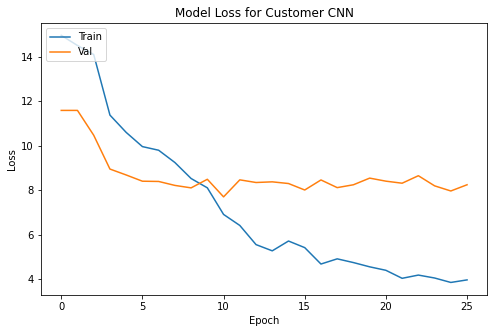

**************************************
Custom CNN Results
**************************************
Validation RMSE : 8.559051308850846
Validation Pearson Correlation Coefficient : 0.7636791760076365
Validation Spearman Correlation Coefficient : 0.49192780157357563
Validation R2 Score : 0.5025387369761164
**************************************
**************************************
Test RMSE : 9.408529635795833
Test Pearson Correlation Coefficient : 0.6198262715450927
Test Spearman Correlation Coefficient : 0.4786939910875298
Test R2 Score : 0.30094488603435576
**************************************


In [17]:
plt.figure(figsize=(8,5))
plt.plot(custom_CNN_history.history['loss'])
plt.plot(custom_CNN_history.history['val_loss'])
plt.title('Model Loss for Customer CNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

custom_CNN_y1_valid_pred_cnn= custom_CNN_model.predict(X_valid)
pred = []
for i in custom_CNN_y1_valid_pred_cnn:
    pred.append(i[0])
custom_CNN_y1_valid_pred_cnn = pred


customCNN_valid_rmse = mean_squared_error(Y1_t1_cells_count, custom_CNN_y1_valid_pred_cnn, squared=False)
customCNN_valid_pears_corr, _ = pearsonr(Y1_t1_cells_count, custom_CNN_y1_valid_pred_cnn)
customCNN_valid_spearman_corr, _ = spearmanr(Y1_t1_cells_count, custom_CNN_y1_valid_pred_cnn)
customCNN_valid_r_squred = r2_score(Y1_t1_cells_count, custom_CNN_y1_valid_pred_cnn)


print("**************************************")
print("Custom CNN Results")
print("**************************************")
print("Validation RMSE :", customCNN_valid_rmse )
print("Validation Pearson Correlation Coefficient :", customCNN_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", customCNN_valid_spearman_corr )
print("Validation R2 Score :", customCNN_valid_r_squred )
print("**************************************")

custom_CNN_y2_test_pred_cnn = custom_CNN_model.predict(X_test)
pred = []
for i in custom_CNN_y2_test_pred_cnn:
    pred.append(i[0])
custom_CNN_y2_test_pred_cnn = pred

customCNN_test_rmse = mean_squared_error(Y2_t1_cells_count, custom_CNN_y2_test_pred_cnn, squared=False)
customCNN_test_pears_corr, _ = pearsonr(Y2_t1_cells_count, custom_CNN_y2_test_pred_cnn)
customCNN_test_spearman_corr, _ = spearmanr(Y2_t1_cells_count, custom_CNN_y2_test_pred_cnn)
customCNN_test_r_squred = r2_score(Y2_t1_cells_count, custom_CNN_y2_test_pred_cnn)


row = pd.Series({'RMSE': customCNN_test_rmse, 'Pearson Correlation': customCNN_test_pears_corr, 'Spearman Correlation': customCNN_test_spearman_corr, 'R2':customCNN_test_r_squred},name='Custom CNN')
cnn_results = cnn_results.append(row)


print("**************************************")
print("Test RMSE :", customCNN_test_rmse )
print("Test Pearson Correlation Coefficient :", customCNN_test_pears_corr )
print("Test Spearman Correlation Coefficient :", customCNN_test_spearman_corr )
print("Test R2 Score :", customCNN_test_r_squred )
print("**************************************")


### ResNET Model

In [25]:
resnet_results = pd.DataFrame(columns=['RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

In [26]:
base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))

earlystopping=EarlyStopping(monitor="val_loss", patience=20, verbose=2, mode='auto', restore_best_weights = True)


# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
    
    
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(1, activation= 'relu')(x)
resnet_model = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
resnet_model.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
resnet_history = resnet_model.fit(X_train, Y0_t1_cells_count,validation_data=(X_valid, Y1_t1_cells_count), epochs=150,batch_size=20, callbacks=[earlystopping])


Epoch 1/150
42/42 [==============================] - 110s 3s/step - loss: 10.4523 - rmse: 6.6302 - val_loss: 11.5879 - val_rmse: 8.0240
Epoch 2/150
42/42 [==============================] - 108s 3s/step - loss: 9.0634 - rmse: 5.9178 - val_loss: 10.2507 - val_rmse: 8.4826
Epoch 3/150
42/42 [==============================] - 107s 3s/step - loss: 9.4203 - rmse: 5.9305 - val_loss: 22.7878 - val_rmse: 21.4632
Epoch 4/150
42/42 [==============================] - 108s 3s/step - loss: 8.1832 - rmse: 5.4799 - val_loss: 9.6302 - val_rmse: 7.8203
Epoch 5/150
42/42 [==============================] - 108s 3s/step - loss: 6.9973 - rmse: 4.5116 - val_loss: 9.8642 - val_rmse: 8.2710
Epoch 6/150
42/42 [==============================] - 108s 3s/step - loss: 6.0386 - rmse: 4.0803 - val_loss: 10.5231 - val_rmse: 9.1175
Epoch 7/150
42/42 [==============================] - 108s 3s/step - loss: 6.0844 - rmse: 4.0461 - val_loss: 15.6529 - val_rmse: 14.1341
Epoch 8/150
42/42 [==============================] - 1

In [27]:
resnet_model.summary()

Model: "functional_3"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_2 (InputLayer)            [(None, 256, 256, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 262, 262, 3)  0           input_2[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 128, 128, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 128, 128, 64) 256         conv1_conv[0][0]                 
_______________________________________________________________________________________

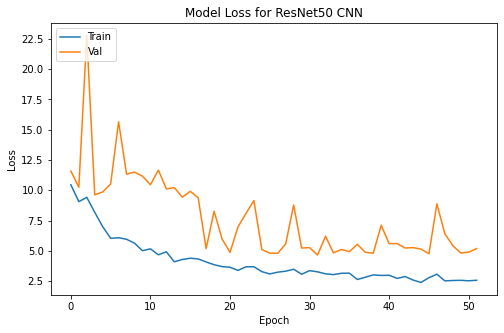

**************************************
ResNet50 CNN Results
**************************************
Validation RMSE : 5.135094099718834
Validation Pearson Correlation Coefficient : 0.9097321852725752
Validation Spearman Correlation Coefficient : 0.8187036436967071
Validation R2 Score : 0.8209374267758677
**************************************
**************************************
Test RMSE : 5.708389920075489
Test Pearson Correlation Coefficient : 0.8703489641042149
Test Spearman Correlation Coefficient : 0.8080978800816535
Test R2 Score : 0.7426671891220761
**************************************


In [29]:
plt.figure(figsize=(8,5))
plt.plot(resnet_history.history['loss'])
plt.plot(resnet_history.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

resnet_cnn_y1_valid_pred_cnn= resnet_model.predict(X_valid)
pred = []
for i in resnet_cnn_y1_valid_pred_cnn:
    pred.append(i[0])
resnet_cnn_y1_valid_pred_cnn = pred

resnet_cnn_valid_rmse = mean_squared_error(Y1_t1_cells_count, resnet_cnn_y1_valid_pred_cnn, squared=False)
resnet_cnn_valid_pears_corr, _ = pearsonr(Y1_t1_cells_count, resnet_cnn_y1_valid_pred_cnn)
resnet_cnn_valid_spearman_corr, _ = spearmanr(Y1_t1_cells_count, resnet_cnn_y1_valid_pred_cnn)
resnet_cnn_valid_r_squred = r2_score(Y1_t1_cells_count, resnet_cnn_y1_valid_pred_cnn)


print("**************************************")
print("ResNet50 CNN Results")
print("**************************************")
print("Validation RMSE :", resnet_cnn_valid_rmse )
print("Validation Pearson Correlation Coefficient :", resnet_cnn_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", resnet_cnn_valid_spearman_corr )
print("Validation R2 Score :", resnet_cnn_valid_r_squred )
print("**************************************")

resnet_CNN_y2_test_pred_cnn = resnet_model.predict(X_test)
pred = []
for i in resnet_CNN_y2_test_pred_cnn:
    pred.append(i[0])
resnet_CNN_y2_test_pred_cnn = pred

resnet_cnn_test_rmse = mean_squared_error(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn, squared=False)
resnet_cnn_test_pears_corr, _ = pearsonr(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn)
resnet_cnn_test_spearman_corr, _ = spearmanr(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn)
resnet_cnn_test_r_squred = r2_score(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn)

row = pd.Series({'RMSE': resnet_cnn_test_rmse, 'Pearson Correlation': resnet_cnn_test_pears_corr, 'Spearman Correlation': resnet_cnn_test_spearman_corr, 'R2':resnet_cnn_test_r_squred},name='ResNet50 CNN')
cnn_results = cnn_results.append(row)

row = pd.Series({'RMSE': resnet_cnn_test_rmse, 'Pearson Correlation': resnet_cnn_test_pears_corr, 'Spearman Correlation': resnet_cnn_test_spearman_corr, 'R2':resnet_cnn_test_r_squred},name='ResNet50 CNN')
resnet_results = resnet_results.append(row)

print("**************************************")
print("Test RMSE :", resnet_cnn_test_rmse )
print("Test Pearson Correlation Coefficient :", resnet_cnn_test_pears_corr )
print("Test Spearman Correlation Coefficient :", resnet_cnn_test_spearman_corr )
print("Test R2 Score :", resnet_cnn_test_r_squred )
print("**************************************")

The results below shows that the ResNet50 CNN outperforms the custom CNN model (that is, it achieves a lower RMSE and a highest Pearson correlation).

In [30]:
cnn_results

,RMSE,Pearson Correlation,Spearman Correlation,R2
Custom CNN,9.40853,0.619826,0.478694,0.300945
ResNet50 CNN,5.70839,0.870349,0.808098,0.742667


Hence ResNet50 CNN was chosen as the best model. The final performance metrics for the best models are displayed below.

In [31]:
resnet_results

,RMSE,Pearson Correlation,Spearman Correlation,R2
ResNet50 CNN,5.70839,0.870349,0.808098,0.742667


Scatter Plot between true and predicted T1 cell counts using ResNet50

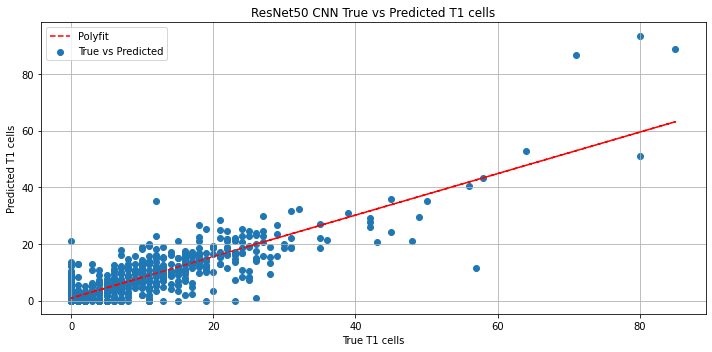

In [32]:
#Fold 1
fig, (ax1) = plt.subplots(1, figsize=(10,5))

ax1.scatter(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn, label='True vs Predicted')
m, b = np.polyfit(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn, 1)
ax1.plot(Y2_t1_cells_count, m*Y2_t1_cells_count + b,'r--', label='Polyfit')
ax1.grid()
ax1.legend(loc='upper left')
ax1.set_xlabel('True T1 cells')
ax1.set_ylabel('Predicted T1 cells')
ax1.set_title('ResNet50 CNN True vs Predicted T1 cells')

plt.tight_layout()

## b. Perform 3-fold cross validation

For this tasks the following procedure was implemented to achieve 3-fold Cross Validation:
1. Cross Validation 1: Training Set: Fold1, Validation Set: Fold2, Test Set: Fold3
2. Cross Validation 2: Training Set: Fold1, Validation Set: Fold3, Test Set: Fold2
3. Cross Validation 3: Training Set: Fold2, Validation Set: Fold3, Test Set: Fold1

Kindly note that the results for Question 3a will be used as the first fold in the above numerated list.

In [33]:
#Create dataframe for results storage
T1_CV_results = pd.DataFrame(columns=['TrainFold','ValidationFold','TestFold','RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

### Cross Validation 1

Training Set: Fold1, Validation Set: Fold2, Test Set: Fold3

In [34]:
#Append Run 1 results from Q3a as Fold 1 results
row = pd.Series({'TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3','RMSE': resnet_cnn_test_rmse, 'Pearson Correlation': resnet_cnn_test_pears_corr, 'Spearman Correlation': resnet_cnn_test_spearman_corr, 'R2':resnet_cnn_test_r_squred},name='CV1')
T1_CV_results = T1_CV_results.append(row)


### Cross Validation 2

Training Set: Fold1, Validation Set: Fold3, Test Set: Fold2

In [36]:
base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))
earlystopping=EarlyStopping(monitor="val_loss", patience=20, verbose=2, mode='auto', restore_best_weights = True)

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
        
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(1, activation= 'relu')(x)
cv2_t1_model = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
cv2_t1_model.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
cv2_t1_history = cv2_t1_model.fit(X_train, Y0_t1_cells_count,validation_data=(X_test, Y2_t1_cells_count), epochs=150,batch_size=20, callbacks=[earlystopping])


Epoch 1/150
42/42 [==============================] - 118s 3s/step - loss: 10.5516 - rmse: 6.7642 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 2/150
42/42 [==============================] - 119s 3s/step - loss: 9.3126 - rmse: 5.7403 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 3/150
42/42 [==============================] - 110s 3s/step - loss: 9.0653 - rmse: 5.6600 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 4/150
42/42 [==============================] - 108s 3s/step - loss: 7.4621 - rmse: 4.9325 - val_loss: 10.5035 - val_rmse: 7.8281
Epoch 5/150
42/42 [==============================] - 108s 3s/step - loss: 7.3391 - rmse: 4.6624 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 6/150
42/42 [==============================] - 108s 3s/step - loss: 6.5727 - rmse: 4.5268 - val_loss: 11.2591 - val_rmse: 8.1468
Epoch 7/150
42/42 [==============================] - 109s 3s/step - loss: 7.0192 - rmse: 4.6815 - val_loss: 9.9868 - val_rmse: 7.6025
Epoch 8/150
42/42 [==============================] - 10

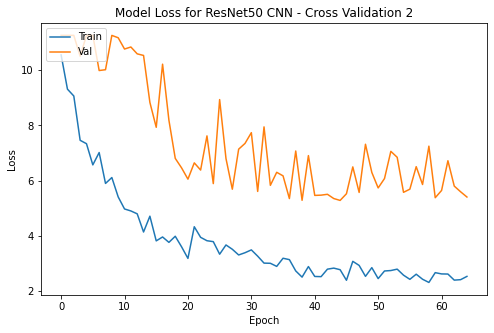

**************************************
ResNet50 CNN -- Cross Validation 2 --Results
**************************************
Validation RMSE : 6.392146586699886
Validation Pearson Correlation Coefficient : 0.8362224170994353
Validation Spearman Correlation Coefficient : 0.7946148688055642
Validation R2 Score : 0.6773279455026655
**************************************
**************************************
Test RMSE : 5.280690914168923
Test Pearson Correlation Coefficient : 0.9064548333914773
Test Spearman Correlation Coefficient : 0.8188875618198506
Test R2 Score : 0.8106394504561797
**************************************


In [38]:
plt.figure(figsize=(8,5))
plt.plot(cv2_t1_history.history['loss'])
plt.plot(cv2_t1_history.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN - Cross Validation 2')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()


resnet_cv2_t1_y1_valid_pred_cnn= cv2_t1_model.predict(X_test) 
pred = []
for i in resnet_cv2_t1_y1_valid_pred_cnn:
    pred.append(i[0])
resnet_cv2_t1_y1_valid_pred_cnn = pred


resnet_cv2_t1_valid_rmse = mean_squared_error(Y2_t1_cells_count, resnet_cv2_t1_y1_valid_pred_cnn, squared=False)
resnet_cv2_t1_valid_pears_corr, _ = pearsonr(Y2_t1_cells_count, resnet_cv2_t1_y1_valid_pred_cnn)
resnet_cv2_t1_valid_spearman_corr, _ = spearmanr(Y2_t1_cells_count, resnet_cv2_t1_y1_valid_pred_cnn)
resnet_cv2_t1_valid_r_squred = r2_score(Y2_t1_cells_count, resnet_cv2_t1_y1_valid_pred_cnn)

print("**************************************")
print("ResNet50 CNN -- Cross Validation 2 --Results")
print("**************************************")
print("Validation RMSE :", resnet_cv2_t1_valid_rmse )
print("Validation Pearson Correlation Coefficient :", resnet_cv2_t1_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", resnet_cv2_t1_valid_spearman_corr )
print("Validation R2 Score :", resnet_cv2_t1_valid_r_squred )
print("**************************************")

resnet_cv2_t1_y2_test_pred_cnn = cv2_t1_model.predict(X_valid)
pred = []
for i in resnet_cv2_t1_y2_test_pred_cnn:
    pred.append(i[0])
resnet_cv2_t1_y2_test_pred_cnn = pred


resnet_cv2_t1_test_rmse = mean_squared_error(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn, squared=False)
resnet_cv2_t1_test_pears_corr, _ = pearsonr(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn)
resnet_cv2_t1_test_spearman_corr, _ = spearmanr(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn)
resnet_cv2_t1_test_r_squred = r2_score(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn)

print("**************************************")
print("Test RMSE :", resnet_cv2_t1_test_rmse )
print("Test Pearson Correlation Coefficient :", resnet_cv2_t1_test_pears_corr )
print("Test Spearman Correlation Coefficient :", resnet_cv2_t1_test_spearman_corr )
print("Test R2 Score :", resnet_cv2_t1_test_r_squred )
print("**************************************")

In [39]:
#append results to dataframe
row = pd.Series({'TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2','RMSE': resnet_cv2_t1_test_rmse, 'Pearson Correlation': resnet_cv2_t1_test_pears_corr, 'Spearman Correlation': resnet_cv2_t1_test_spearman_corr, 'R2':resnet_cv2_t1_test_r_squred},name='CV2')
T1_CV_results = T1_CV_results.append(row)


### Cross Validation 3

Training Set: Fold2, Validation Set: Fold3, Test Set: Fold1

In [41]:
base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))

earlystopping=EarlyStopping(monitor="val_loss", patience=20, verbose=2, mode='auto', restore_best_weights = True)

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
        
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(1, activation= 'relu')(x)
cv3_t1_model = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
cv3_t1_model.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
cv3_t1_history = cv3_t1_model.fit(X_valid, Y1_t1_cells_count,validation_data=(X_test, Y2_t1_cells_count), epochs=150,batch_size=20, callbacks=[earlystopping])


Epoch 1/150
38/38 [==============================] - 102s 3s/step - loss: 9.5826 - rmse: 5.9830 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 2/150
38/38 [==============================] - 100s 3s/step - loss: 8.6979 - rmse: 5.6284 - val_loss: 11.2596 - val_rmse: 8.1471
Epoch 3/150
38/38 [==============================] - 100s 3s/step - loss: 6.7232 - rmse: 4.5371 - val_loss: 10.4382 - val_rmse: 7.7966
Epoch 4/150
38/38 [==============================] - 100s 3s/step - loss: 6.7686 - rmse: 4.2649 - val_loss: 9.6140 - val_rmse: 7.5580
Epoch 5/150
38/38 [==============================] - 100s 3s/step - loss: 6.7587 - rmse: 4.3331 - val_loss: 20.1649 - val_rmse: 18.6921
Epoch 6/150
38/38 [==============================] - 100s 3s/step - loss: 6.2247 - rmse: 3.9232 - val_loss: 19.5996 - val_rmse: 18.2091
Epoch 7/150
38/38 [==============================] - 101s 3s/step - loss: 5.8618 - rmse: 3.6510 - val_loss: 10.3143 - val_rmse: 8.9040
Epoch 8/150
38/38 [==============================] - 1

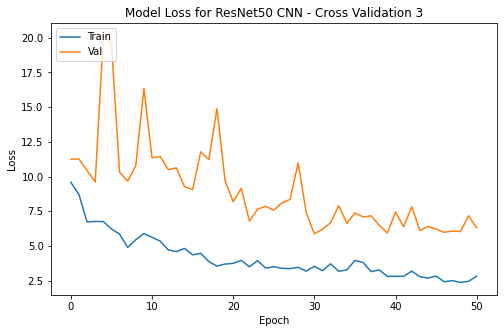

**************************************
ResNet50 CNN -- Cross Validation 2 --Results
**************************************
Validation RMSE : 7.175531087350719
Validation Pearson Correlation Coefficient : 0.7784943254081372
Validation Spearman Correlation Coefficient : 0.7740907713767966
Validation R2 Score : 0.5933919211363601
**************************************
**************************************
Test RMSE : 6.593501058070369
Test Pearson Correlation Coefficient : 0.8420215163506986
Test Spearman Correlation Coefficient : 0.8125990539378006
Test R2 Score : 0.6991705824390857
**************************************


In [42]:
plt.figure(figsize=(8,5))
plt.plot(cv3_t1_history.history['loss'])
plt.plot(cv3_t1_history.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN - Cross Validation 3')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()

resnet_cv3_t1_y1_valid_pred_cnn= cv3_t1_model.predict(X_test) 
pred = []
for i in resnet_cv3_t1_y1_valid_pred_cnn:
    pred.append(i[0])
resnet_cv3_t1_y1_valid_pred_cnn = pred


resnet_cv3_t1_valid_rmse = mean_squared_error(Y2_t1_cells_count, resnet_cv3_t1_y1_valid_pred_cnn, squared=False)
resnet_cv3_t1_valid_pears_corr, _ = pearsonr(Y2_t1_cells_count, resnet_cv3_t1_y1_valid_pred_cnn)
resnet_cv3_t1_valid_spearman_corr, _ = spearmanr(Y2_t1_cells_count, resnet_cv3_t1_y1_valid_pred_cnn)
resnet_cv3_t1_valid_r_squred = r2_score(Y2_t1_cells_count, resnet_cv3_t1_y1_valid_pred_cnn)

print("**************************************")
print("ResNet50 CNN -- Cross Validation 2 --Results")
print("**************************************")
print("Validation RMSE :", resnet_cv3_t1_valid_rmse )
print("Validation Pearson Correlation Coefficient :", resnet_cv3_t1_valid_pears_corr )
print("Validation Spearman Correlation Coefficient :", resnet_cv3_t1_valid_spearman_corr )
print("Validation R2 Score :", resnet_cv3_t1_valid_r_squred )
print("**************************************")


resnet_cv3_t1_y2_test_pred_cnn = cv3_t1_model.predict(X_train)
pred = []
for i in resnet_cv3_t1_y2_test_pred_cnn:
    pred.append(i[0])
resnet_cv3_t1_y2_test_pred_cnn = pred

resnet_cv3_t1_test_rmse = mean_squared_error(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn, squared=False)
resnet_cv3_t1_test_pears_corr, _ = pearsonr(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn)
resnet_cv3_t1_test_spearman_corr, _ = spearmanr(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn)
resnet_cv3_t1_test_r_squred = r2_score(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn)

print("**************************************")
print("Test RMSE :", resnet_cv3_t1_test_rmse )
print("Test Pearson Correlation Coefficient :", resnet_cv3_t1_test_pears_corr )
print("Test Spearman Correlation Coefficient :", resnet_cv3_t1_test_spearman_corr )
print("Test R2 Score :", resnet_cv3_t1_test_r_squred )
print("**************************************")


In [43]:
row = pd.Series({'TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1','RMSE': resnet_cv3_t1_test_rmse, 'Pearson Correlation': resnet_cv3_t1_test_pears_corr, 'Spearman Correlation': resnet_cv3_t1_test_spearman_corr, 'R2':resnet_cv3_t1_test_r_squred},name='CV3')
T1_CV_results = T1_CV_results.append(row)


Scatter Plot between true and predicted T1 cell counts using ResNet50 CNN and 3-fold Cross Validation

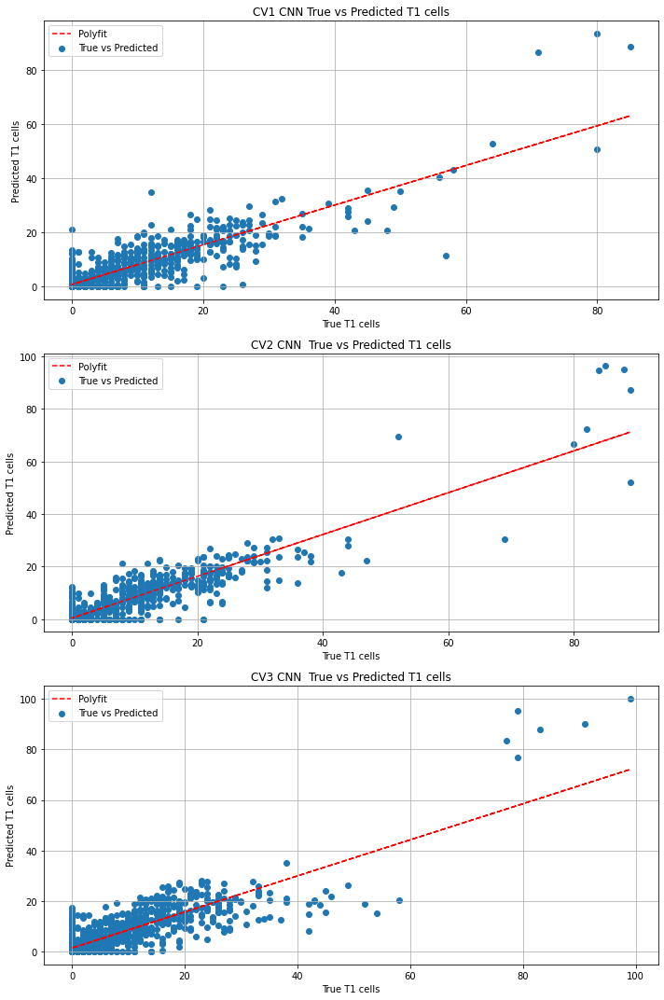

In [44]:

fig, (ax1,ax2,ax3) = plt.subplots(3, figsize=(10,15))

ax1.scatter(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn, label='True vs Predicted')
m, b = np.polyfit(Y2_t1_cells_count, resnet_CNN_y2_test_pred_cnn, 1)
ax1.plot(Y2_t1_cells_count, m*Y2_t1_cells_count + b,'r--', label='Polyfit')
ax1.grid()
ax1.legend(loc='upper left')
ax1.set_xlabel('True T1 cells')
ax1.set_ylabel('Predicted T1 cells')
ax1.set_title('CV1 CNN True vs Predicted T1 cells')

ax2.scatter(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn, label='True vs Predicted')
m, b = np.polyfit(Y1_t1_cells_count, resnet_cv2_t1_y2_test_pred_cnn, 1)
ax2.plot(Y1_t1_cells_count, m*Y1_t1_cells_count + b,'r--', label='Polyfit')
ax2.grid()
ax2.legend(loc='upper left')
ax2.set_xlabel('True T1 cells')
ax2.set_ylabel('Predicted T1 cells')
ax2.set_title('CV2 CNN  True vs Predicted T1 cells')

ax3.scatter(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn, label='True vs Predicted')
m, b = np.polyfit(Y0_t1_cells_count, resnet_cv3_t1_y2_test_pred_cnn, 1)
ax3.plot(Y0_t1_cells_count, m*Y0_t1_cells_count + b,'r--', label='Polyfit')
ax3.grid()
ax3.legend(loc='upper left')
ax3.set_xlabel('True T1 cells')
ax3.set_ylabel('Predicted T1 cells')
ax3.set_title('CV3 CNN  True vs Predicted T1 cells')

plt.tight_layout()


### Summarised Performance Metrics

In [45]:
T1_CV_results

,TrainFold,ValidationFold,TestFold,RMSE,Pearson Correlation,Spearman Correlation,R2
CV1,Fold1,Fold2,Fold3,5.708390,0.870349,0.808098,0.742667
CV2,Fold1,Fold3,Fold2,5.280691,0.906455,0.818888,0.810639
CV3,Fold2,Fold3,Fold1,6.593501,0.842022,0.812599,0.699171


## c. Simultaneous 6 Cells Predictions with 3-fold Cross Validation

In [46]:
#Create 6 cell prediction results dataframe
CNN_6cells_results = pd.DataFrame(columns=['Cell','TrainFold','ValidationFold','TestFold','RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

In [47]:
#convert output arrays to floats for RMSE calculation
Y0_float = Y0/1.0
Y1_float = Y1/1.0
Y2_float = Y2/1.0

#### Cross Validation 1

Training set: Fold1, Validation Set: Fold2, Test Set: Fold3

In [50]:

base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))
earlystopping=EarlyStopping(monitor="val_loss", patience=25, verbose=2, mode='auto', restore_best_weights = True)

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
        
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(6, activation= 'relu')(x)
cv1_model_6cells = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
cv1_model_6cells.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
cv1_history_6cells = cv1_model_6cells.fit(X_train, Y0_float,validation_data=(X_valid, Y1_float), epochs=150,batch_size=20, callbacks=[earlystopping])


Epoch 1/150
42/42 [==============================] - 111s 3s/step - loss: 6.3995 - rmse: 5.1604 - val_loss: 8.4400 - val_rmse: 7.2897
Epoch 2/150
42/42 [==============================] - 111s 3s/step - loss: 5.4315 - rmse: 4.3402 - val_loss: 8.4400 - val_rmse: 7.2897
Epoch 3/150
42/42 [==============================] - 109s 3s/step - loss: 4.6781 - rmse: 3.8166 - val_loss: 7.6840 - val_rmse: 6.4318
Epoch 4/150
42/42 [==============================] - 111s 3s/step - loss: 4.6112 - rmse: 3.7698 - val_loss: 7.9953 - val_rmse: 6.7118
Epoch 5/150
42/42 [==============================] - 118s 3s/step - loss: 4.5235 - rmse: 3.5484 - val_loss: 11.3880 - val_rmse: 10.5329
Epoch 6/150
42/42 [==============================] - 112s 3s/step - loss: 4.1122 - rmse: 3.3313 - val_loss: 8.1658 - val_rmse: 6.8814
Epoch 7/150
42/42 [==============================] - 172s 4s/step - loss: 4.0257 - rmse: 3.2426 - val_loss: 7.7622 - val_rmse: 6.6223
Epoch 8/150
42/42 [==============================] - 180s 4s

Epoch 62/150
42/42 [==============================] - 110s 3s/step - loss: 1.4292 - rmse: 1.1722 - val_loss: 3.4472 - val_rmse: 2.8090
Epoch 63/150
42/42 [==============================] - 110s 3s/step - loss: 1.4582 - rmse: 1.1680 - val_loss: 3.3068 - val_rmse: 2.6684
Epoch 64/150
42/42 [==============================] - 110s 3s/step - loss: 1.5178 - rmse: 1.2582 - val_loss: 3.3714 - val_rmse: 2.7141
Epoch 65/150
42/42 [==============================] - 110s 3s/step - loss: 1.4665 - rmse: 1.1821 - val_loss: 3.5453 - val_rmse: 2.8737
Epoch 66/150
42/42 [==============================] - 109s 3s/step - loss: 1.3750 - rmse: 1.1323 - val_loss: 3.3500 - val_rmse: 2.7031
Epoch 67/150
42/42 [==============================] - 110s 3s/step - loss: 1.3211 - rmse: 1.0897 - val_loss: 3.2997 - val_rmse: 2.6667
Epoch 68/150
42/42 [==============================] - 110s 3s/step - loss: 1.3768 - rmse: 1.1125 - val_loss: 3.8138 - val_rmse: 3.1270
Epoch 69/150
42/42 [==============================] - 1

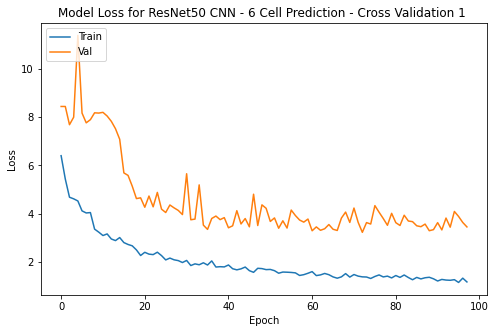

In [52]:
plt.figure(figsize=(8,5))
plt.plot(cv1_history_6cells.history['loss'])
plt.plot(cv1_history_6cells.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN - 6 Cell Prediction - Cross Validation 1 ' )
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()


In [53]:
cv1_y1_test_pred_cnn_6cells = cv1_model_6cells.predict(X_test) 


In [54]:
def decompose_cnn_predictions_6cells(predict_array):
    pred_t1 = []
    pred_t2 = []
    pred_t3 = []
    pred_t4 = []
    pred_t5 = []
    pred_t6 = []
    
    for i in predict_array:
        pred_t1.append(i[0])
        pred_t2.append(i[1])
        pred_t3.append(i[2])
        pred_t4.append(i[3])
        pred_t5.append(i[4])
        pred_t6.append(i[5])
        
    return pred_t1,pred_t2,pred_t3,pred_t4,pred_t5,pred_t6

In [55]:
cv1_t1cell_test, cv1_t2cell_test, cv1_t3cell_test, cv1_t4cell_test, cv1_t5cell_test, cv1_t6cell_test = decompose_cnn_predictions_6cells(cv1_y1_test_pred_cnn_6cells)

In [56]:
def calculate_performance_metrics(actualY, predictedY, cv='1', cell='t1'):
    print('***********************************')
    print('Performance Metrics for CV:',cv, ' Cell: ',cell)
    rmse = mean_squared_error(actualY, predictedY, squared=False)
    pears_corr, _ = pearsonr(actualY, predictedY)
    spearman_corr, _ = spearmanr(actualY, predictedY)
    r_squred = r2_score(actualY, predictedY)

    print("Test RMSE :", rmse )
    print("Test Pearson Correlation Coefficient :", pears_corr )
    print("Test Spearman Correlation Coefficient :", spearman_corr )
    print("Test R2 Score :", r_squred )
    
    return rmse, pears_corr, spearman_corr, r_squred

**Low RMSE** values can be noted for all cells in the results below. As discussed in Question 1vi, RMSE is the optimal performance metric for this problem. 

T4 and T6 had low cell counts in all folds. Given that the correlation coefficients are dependent on the scale of the predicted features, they give a low result. As discussed in Question 1vi, this is expected for cells with low counts, given the characteristic of the correlation coefficients calculations. The RMSE values for T4 and T6 cells is however low. The respective T4 and T6, True vs Predicted cells plots below show that the model predicts with great fit these cell counts. 

In [63]:
#given that t4 cells majority = 0, if prediction is all 0, modify last element from 0 to 0.01 to avoid division
# by 0 error in pearson correlation
if (sum(cv1_t4cell_test)==0):
    cv1_t4cell_test[-1]=0.01

cv1_6cell_t1_test_rmse, cv1_6cell_t1_test_pears_corr, cv1_6cell_t1_test_spearman_corr, cv1_6cell_t1_test_r_squred = calculate_performance_metrics(Y2_t1_cells_count,cv1_t1cell_test,cv='1',cell='t1')
cv1_6cell_t2_test_rmse, cv1_6cell_t2_test_pears_corr, cv1_6cell_t2_test_spearman_corr, cv1_6cell_t2_test_r_squred = calculate_performance_metrics(Y2_t2_cells_count,cv1_t2cell_test,cv='1',cell='t2')
cv1_6cell_t3_test_rmse, cv1_6cell_t3_test_pears_corr, cv1_6cell_t3_test_spearman_corr, cv1_6cell_t3_test_r_squred = calculate_performance_metrics(Y2_t3_cells_count,cv1_t3cell_test,cv='1',cell='t3')
cv1_6cell_t4_test_rmse, cv1_6cell_t4_test_pears_corr, cv1_6cell_t4_test_spearman_corr, cv1_6cell_t4_test_r_squred = calculate_performance_metrics(Y2_t4_cells_count,cv1_t4cell_test,cv='1',cell='t4')
cv1_6cell_t5_test_rmse, cv1_6cell_t5_test_pears_corr, cv1_6cell_t5_test_spearman_corr, cv1_6cell_t5_test_r_squred = calculate_performance_metrics(Y2_t5_cells_count,cv1_t5cell_test,cv='1',cell='t5')
cv1_6cell_t6_test_rmse, cv1_6cell_t6_test_pears_corr, cv1_6cell_t6_test_spearman_corr, cv1_6cell_t6_test_r_squred = calculate_performance_metrics(Y2_t6_cells_count,cv1_t6cell_test,cv='1',cell='t6')

***********************************
Performance Metrics for CV: 1  Cell:  t1
Test RMSE : 5.189950459025924
Test Pearson Correlation Coefficient : 0.8982992351967951
Test Spearman Correlation Coefficient : 0.8574438505057506
Test R2 Score : 0.7872868557255519
***********************************
Performance Metrics for CV: 1  Cell:  t2
Test RMSE : 2.9570928
Test Pearson Correlation Coefficient : 0.8821139588185133
Test Spearman Correlation Coefficient : 0.6012154198165262
Test R2 Score : 0.6774859676795638
***********************************
Performance Metrics for CV: 1  Cell:  t3
Test RMSE : 3.5376015
Test Pearson Correlation Coefficient : 0.6241319886442942
Test Spearman Correlation Coefficient : 0.6523891098280219
Test R2 Score : 0.32918298191976536
***********************************
Performance Metrics for CV: 1  Cell:  t4
Test RMSE : 0.035922856413476166
Test Pearson Correlation Coefficient : -0.0012919896640826863
Test Spearman Correlation Coefficient : -0.0012919896640826876
Tes

In [58]:
actualCells_CV1 = [Y2_t1_cells_count,Y2_t2_cells_count,Y2_t3_cells_count,Y2_t4_cells_count,Y2_t5_cells_count,Y2_t6_cells_count]

In [59]:
predictedCells_CV1 = [cv1_t1cell_test,cv1_t2cell_test,cv1_t3cell_test,cv1_t4cell_test,cv1_t5cell_test,cv1_t6cell_test]

In [60]:
cells = ['T1 Cell', 'T2 Cell', 'T3 Cell', 'T4 Cell', 'T5 Cell', 'T6 Cell']
def generate_plots (actualY_array, predictedY_array, CV=''):
    
    fig, axes = plt.subplots(3,2, figsize=(15,15))
    ax = axes.ravel()
    print('True vs Predicted Scatter Plots for CV: ', CV)
    for idx, _ in enumerate(cells):
        ax[idx].scatter(actualY_array[idx], predictedY_array[idx], label='True vs Predicted')
        m, b = np.polyfit(actualY_array[idx], predictedY_array[idx], 1)
        ax[idx].plot(actualY_array[idx], m*actualY_array[idx] + b,'r--', label='Polyfit')
        ax[idx].grid()
        ax[idx].legend(loc='upper left')
        ax[idx].set_xlabel('Actual Value ')
        ax[idx].set_ylabel('Predicted')
        ax[idx].set_title(cells[idx])
        
    plt.tight_layout()

True vs Predicted Scatter Plots for CV:  1


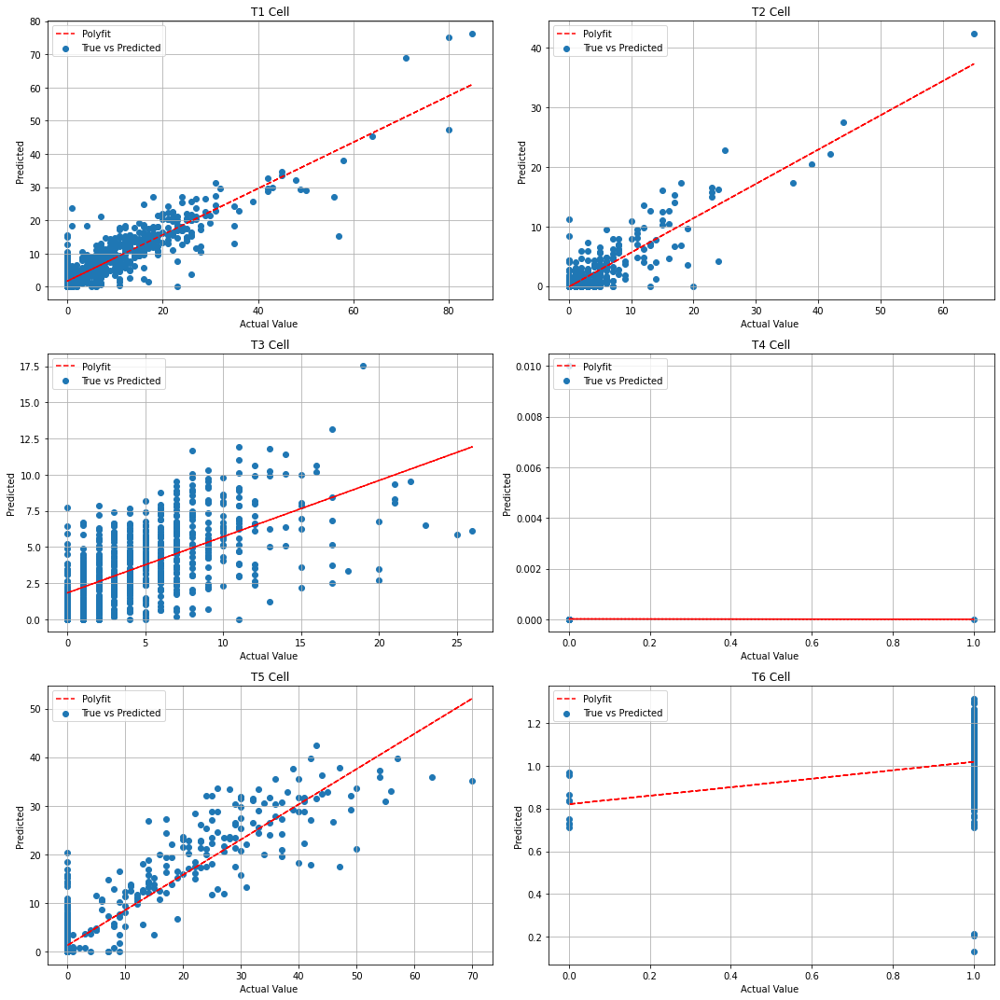

In [61]:
generate_plots(actualCells_CV1, predictedCells_CV1, CV='1')

#### Cross Validation 2

Training set: Fold1, Validation Set: Fold3, Test Set: Fold2

In [62]:

base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))
earlystopping=EarlyStopping(monitor="val_loss", patience=25, verbose=2, mode='auto', restore_best_weights = True)

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
        
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(6, activation= 'relu')(x)
cv2_model_6cells = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
cv2_model_6cells.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
cv2_history_6cells = cv2_model_6cells.fit(X_train, Y0_float,validation_data=(X_test, Y2_float), epochs=100,batch_size=20, callbacks=[earlystopping])


Epoch 1/100
42/42 [==============================] - 112s 3s/step - loss: 7.3496 - rmse: 5.6615 - val_loss: 8.7330 - val_rmse: 7.8226
Epoch 2/100
42/42 [==============================] - 110s 3s/step - loss: 6.4902 - rmse: 4.9684 - val_loss: 8.0378 - val_rmse: 6.8059
Epoch 3/100
42/42 [==============================] - 109s 3s/step - loss: 5.4720 - rmse: 4.3122 - val_loss: 8.2132 - val_rmse: 7.0739
Epoch 4/100
42/42 [==============================] - 111s 3s/step - loss: 5.3471 - rmse: 4.1767 - val_loss: 7.4556 - val_rmse: 6.2849
Epoch 5/100
42/42 [==============================] - 113s 3s/step - loss: 4.8264 - rmse: 3.7879 - val_loss: 8.0885 - val_rmse: 6.8582
Epoch 6/100
42/42 [==============================] - 111s 3s/step - loss: 4.6152 - rmse: 3.7288 - val_loss: 7.8997 - val_rmse: 6.6875
Epoch 7/100
42/42 [==============================] - 111s 3s/step - loss: 4.2749 - rmse: 3.3682 - val_loss: 8.1548 - val_rmse: 6.9652
Epoch 8/100
42/42 [==============================] - 111s 3s/s

Epoch 62/100
42/42 [==============================] - 110s 3s/step - loss: 1.4927 - rmse: 1.2164 - val_loss: 4.2741 - val_rmse: 3.3742
Epoch 63/100
42/42 [==============================] - 110s 3s/step - loss: 1.5894 - rmse: 1.2973 - val_loss: 4.5475 - val_rmse: 3.6356
Epoch 64/100
42/42 [==============================] - 110s 3s/step - loss: 1.4391 - rmse: 1.1901 - val_loss: 3.5186 - val_rmse: 2.8369
Epoch 65/100
42/42 [==============================] - 110s 3s/step - loss: 1.4691 - rmse: 1.2062 - val_loss: 3.8580 - val_rmse: 3.0416
Epoch 66/100
42/42 [==============================] - 112s 3s/step - loss: 1.5120 - rmse: 1.2286 - val_loss: 5.4655 - val_rmse: 4.3562
Epoch 67/100
42/42 [==============================] - 110s 3s/step - loss: 1.4788 - rmse: 1.2026 - val_loss: 3.9285 - val_rmse: 3.1291
Epoch 68/100
42/42 [==============================] - 109s 3s/step - loss: 1.5722 - rmse: 1.2752 - val_loss: 3.9216 - val_rmse: 3.1685
Epoch 69/100
42/42 [==============================] - 1

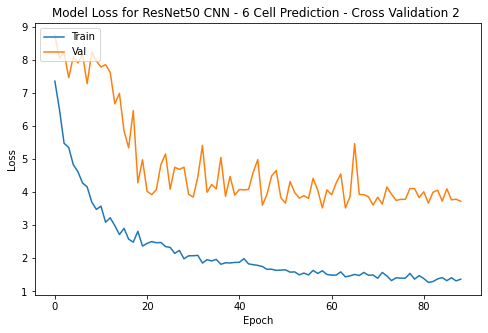

In [64]:
plt.figure(figsize=(8,5))
plt.plot(cv2_history_6cells.history['loss'])
plt.plot(cv2_history_6cells.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN - 6 Cell Prediction - Cross Validation 2 ' )
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()


In [65]:
#Fold 2 as Test Set
cv2_test_pred_cnn_6cells = cv2_model_6cells.predict(X_valid)
cv2_t1cell_test, cv2_t2cell_test, cv2_t3cell_test, cv2_t4cell_test, cv2_t5cell_test, cv2_t6cell_test = decompose_cnn_predictions_6cells(cv2_test_pred_cnn_6cells)

In [66]:
if (sum(cv2_t4cell_test)==0):
    cv2_t4cell_test[-1]=0.01
    
cv2_6cell_t1_test_rmse, cv2_6cell_t1_test_pears_corr, cv2_6cell_t1_test_spearman_corr, cv2_6cell_t1_test_r_squred = calculate_performance_metrics(Y1_t1_cells_count,cv2_t1cell_test,cv='2',cell='t1')
cv2_6cell_t2_test_rmse, cv2_6cell_t2_test_pears_corr, cv2_6cell_t2_test_spearman_corr, cv2_6cell_t2_test_r_squred = calculate_performance_metrics(Y1_t2_cells_count,cv2_t2cell_test,cv='2',cell='t2')
cv2_6cell_t3_test_rmse, cv2_6cell_t3_test_pears_corr, cv2_6cell_t3_test_spearman_corr, cv2_6cell_t3_test_r_squred = calculate_performance_metrics(Y1_t3_cells_count,cv2_t3cell_test,cv='2',cell='t3')
cv2_6cell_t4_test_rmse, cv2_6cell_t4_test_pears_corr, cv2_6cell_t4_test_spearman_corr, cv2_6cell_t4_test_r_squred = calculate_performance_metrics(Y1_t4_cells_count,cv2_t4cell_test,cv='2',cell='t4')
cv2_6cell_t5_test_rmse, cv2_6cell_t5_test_pears_corr, cv2_6cell_t5_test_spearman_corr, cv2_6cell_t5_test_r_squred = calculate_performance_metrics(Y1_t5_cells_count,cv2_t5cell_test,cv='2',cell='t5')
cv2_6cell_t6_test_rmse, cv2_6cell_t6_test_pears_corr, cv2_6cell_t6_test_spearman_corr, cv2_6cell_t6_test_r_squred = calculate_performance_metrics(Y1_t6_cells_count,cv2_t6cell_test,cv='2',cell='t6')

***********************************
Performance Metrics for CV: 2  Cell:  t1
Test RMSE : 5.462941622356233
Test Pearson Correlation Coefficient : 0.8995285194708266
Test Spearman Correlation Coefficient : 0.8144606028733699
Test R2 Score : 0.7973432247470725
***********************************
Performance Metrics for CV: 2  Cell:  t2
Test RMSE : 2.97606
Test Pearson Correlation Coefficient : 0.872627864974081
Test Spearman Correlation Coefficient : 0.620132205266305
Test R2 Score : 0.749318067522418
***********************************
Performance Metrics for CV: 2  Cell:  t3
Test RMSE : 3.5844965
Test Pearson Correlation Coefficient : 0.6429492463927418
Test Spearman Correlation Coefficient : 0.665993361072406
Test R2 Score : 0.31231062942412446
***********************************
Performance Metrics for CV: 2  Cell:  t4
Test RMSE : 0.21923553306572247
Test Pearson Correlation Coefficient : -0.0013368983957219266
Test Spearman Correlation Coefficient : -0.0013368983957219248
Test R2 Sc

In [67]:
actualCells_CV2 = [Y1_t1_cells_count,Y1_t2_cells_count,Y1_t3_cells_count,Y1_t4_cells_count,Y1_t5_cells_count,Y1_t6_cells_count]

In [68]:
predictedCells_CV2 = [cv2_t1cell_test, cv2_t2cell_test, cv2_t3cell_test, cv2_t4cell_test, cv2_t5cell_test, cv2_t6cell_test]

True vs Predicted Scatter Plots for CV:  2


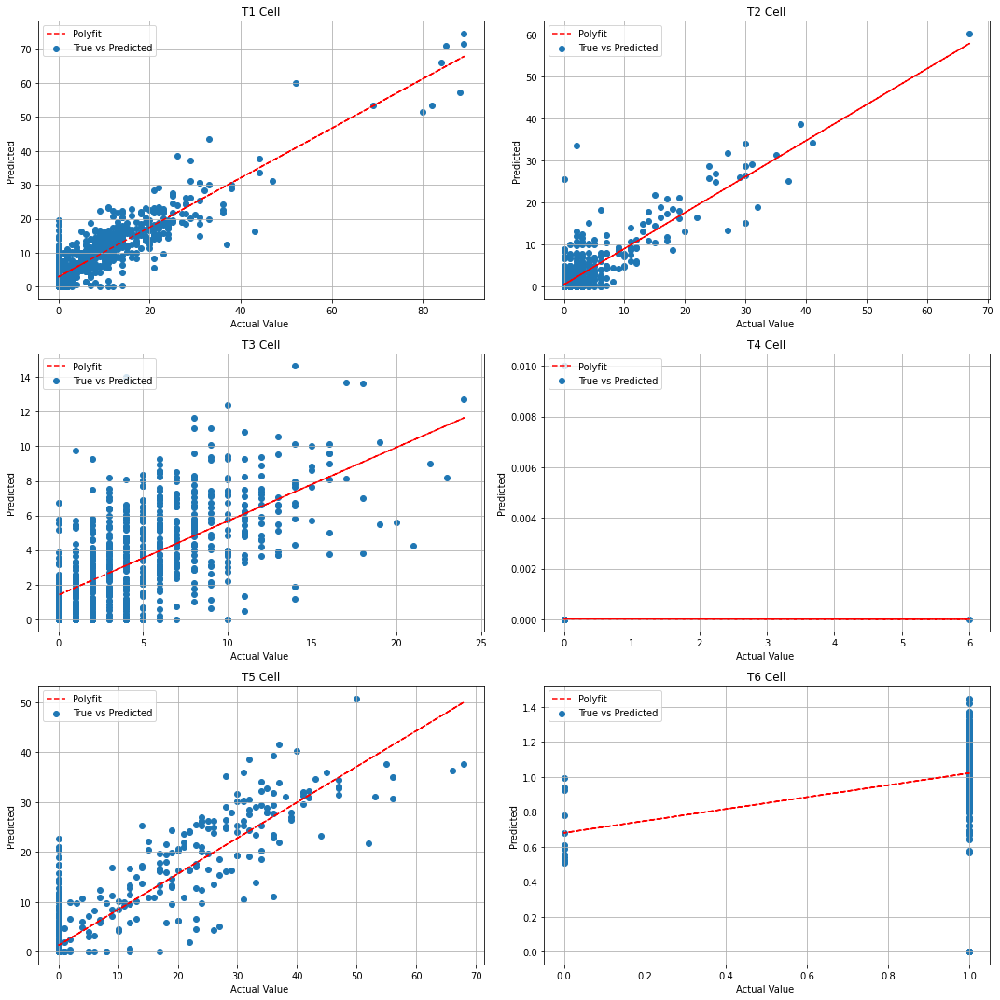

In [69]:
generate_plots(actualCells_CV2, predictedCells_CV2, CV='2')

#### Cross Validation 3

Training set: Fold2, Validation Set: Fold3, Test Set: Fold1

In [71]:

base_model = applications.resnet50.ResNet50(weights= "imagenet", pooling='avg',include_top=False, input_shape= (256,256,3))
earlystopping=EarlyStopping(monitor="val_loss", patience=25, verbose=2, mode='auto', restore_best_weights = True)

# define the keras model
def rmse(y_true, y_pred):
    return backend.sqrt(backend.mean(backend.square(y_pred - y_true), axis=-1))

def root_mean_squared_error(y_true, y_pred):
    return K.sqrt(K.mean(K.square(y_pred - y_true))) 
        
x = base_model.output
x = Flatten()(x)
x = Dropout(0.7)(x)
predictions = Dense(6, activation= 'relu')(x)
cv3_model_6cells = Model(inputs = base_model.input, outputs = predictions)

# compile the keras model
cv3_model_6cells.compile(optimizer = 'adam', loss = root_mean_squared_error, metrics=[rmse]) 

# fit the keras model on the dataset
cv3_history_6cells = cv3_model_6cells.fit(X_valid, Y1_float,validation_data=(X_test, Y2_float), epochs=100,batch_size=20, callbacks=[earlystopping])


Epoch 1/100
38/38 [==============================] - 102s 3s/step - loss: 6.4443 - rmse: 5.0561 - val_loss: 101.5050 - val_rmse: 101.1307
Epoch 2/100
38/38 [==============================] - 102s 3s/step - loss: 5.6529 - rmse: 4.3831 - val_loss: 7.6587 - val_rmse: 6.4358
Epoch 3/100
38/38 [==============================] - 101s 3s/step - loss: 5.2000 - rmse: 4.0516 - val_loss: 172.0252 - val_rmse: 171.6264
Epoch 4/100
38/38 [==============================] - 100s 3s/step - loss: 4.9222 - rmse: 3.8978 - val_loss: 10.1316 - val_rmse: 9.2863
Epoch 5/100
38/38 [==============================] - 100s 3s/step - loss: 4.5069 - rmse: 3.5540 - val_loss: 14.6262 - val_rmse: 14.0901
Epoch 6/100
38/38 [==============================] - 100s 3s/step - loss: 4.5050 - rmse: 3.6359 - val_loss: 7.9327 - val_rmse: 6.7879
Epoch 7/100
38/38 [==============================] - 100s 3s/step - loss: 4.1996 - rmse: 3.3312 - val_loss: 7.6707 - val_rmse: 6.5276
Epoch 8/100
38/38 [==============================] 

Epoch 62/100
38/38 [==============================] - 101s 3s/step - loss: 1.7263 - rmse: 1.3232 - val_loss: 3.9605 - val_rmse: 3.1204
Epoch 63/100
38/38 [==============================] - 100s 3s/step - loss: 1.5926 - rmse: 1.2805 - val_loss: 3.6852 - val_rmse: 2.9799
Epoch 64/100
38/38 [==============================] - 100s 3s/step - loss: 1.5564 - rmse: 1.2159 - val_loss: 4.4596 - val_rmse: 3.4774
Epoch 65/100
38/38 [==============================] - 100s 3s/step - loss: 1.5674 - rmse: 1.2791 - val_loss: 4.1606 - val_rmse: 3.3048
Epoch 66/100
38/38 [==============================] - 100s 3s/step - loss: 1.5415 - rmse: 1.2255 - val_loss: 4.4921 - val_rmse: 3.5816
Epoch 67/100
38/38 [==============================] - 100s 3s/step - loss: 1.4574 - rmse: 1.1737 - val_loss: 3.9255 - val_rmse: 3.0985
Epoch 68/100
38/38 [==============================] - 100s 3s/step - loss: 1.4844 - rmse: 1.1883 - val_loss: 3.7804 - val_rmse: 2.9958
Epoch 69/100
38/38 [==============================] - 1

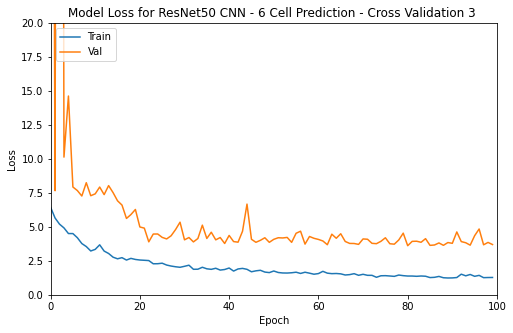

In [81]:
plt.figure(figsize=(8,5))
plt.plot(cv3_history_6cells.history['loss'])
plt.plot(cv3_history_6cells.history['val_loss'])
plt.title('Model Loss for ResNet50 CNN - 6 Cell Prediction - Cross Validation 3 ' )
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.xlim([0, 100])
plt.ylim([0, 20])
plt.legend(['Train', 'Val'], loc='upper left')
plt.show()


In [73]:
#Fold 1 as Test Set
cv3_test_pred_cnn_6cells = cv3_model_6cells.predict(X_train)

In [74]:
cv3_t1cell_test, cv3_t2cell_test, cv3_t3cell_test, cv3_t4cell_test, cv3_t5cell_test, cv3_t6cell_test = decompose_cnn_predictions_6cells(cv3_test_pred_cnn_6cells)

In [75]:
if (sum(cv3_t4cell_test)==0):
    cv3_t4cell_test[-1]=0.01
    
cv3_6cell_t1_test_rmse, cv3_6cell_t1_test_pears_corr, cv3_6cell_t1_test_spearman_corr, cv3_6cell_t1_test_r_squred = calculate_performance_metrics(Y0_t1_cells_count,cv3_t1cell_test,cv='3',cell='t1')
cv3_6cell_t2_test_rmse, cv3_6cell_t2_test_pears_corr, cv3_6cell_t2_test_spearman_corr, cv3_6cell_t2_test_r_squred = calculate_performance_metrics(Y0_t2_cells_count,cv3_t2cell_test,cv='3',cell='t2')
cv3_6cell_t3_test_rmse, cv3_6cell_t3_test_pears_corr, cv3_6cell_t3_test_spearman_corr, cv3_6cell_t3_test_r_squred = calculate_performance_metrics(Y0_t3_cells_count,cv3_t3cell_test,cv='3',cell='t3')
cv3_6cell_t4_test_rmse, cv3_6cell_t4_test_pears_corr, cv3_6cell_t4_test_spearman_corr, cv3_6cell_t4_test_r_squred = calculate_performance_metrics(Y0_t4_cells_count,cv3_t4cell_test,cv='3',cell='t4')
cv3_6cell_t5_test_rmse, cv3_6cell_t5_test_pears_corr, cv3_6cell_t5_test_spearman_corr, cv3_6cell_t5_test_r_squred = calculate_performance_metrics(Y0_t5_cells_count,cv3_t5cell_test,cv='3',cell='t5')
cv3_6cell_t6_test_rmse, cv3_6cell_t6_test_pears_corr, cv3_6cell_t6_test_spearman_corr, cv3_6cell_t6_test_r_squred = calculate_performance_metrics(Y0_t6_cells_count,cv3_t6cell_test,cv='3',cell='t6')

***********************************
Performance Metrics for CV: 3  Cell:  t1
Test RMSE : 5.719330943499678
Test Pearson Correlation Coefficient : 0.8997057726750262
Test Spearman Correlation Coefficient : 0.8414425486584968
Test R2 Score : 0.7736509911978036
***********************************
Performance Metrics for CV: 3  Cell:  t2
Test RMSE : 3.6317513
Test Pearson Correlation Coefficient : 0.8238299593980432
Test Spearman Correlation Coefficient : 0.6196743913096796
Test R2 Score : 0.6622108667940632
***********************************
Performance Metrics for CV: 3  Cell:  t3
Test RMSE : 3.521234
Test Pearson Correlation Coefficient : 0.6558304929530674
Test Spearman Correlation Coefficient : 0.6789179518594467
Test R2 Score : 0.3634503204029027
***********************************
Performance Metrics for CV: 3  Cell:  t4
Test RMSE : 0.21151866372209602
Test Pearson Correlation Coefficient : -0.001393485355837319
Test Spearman Correlation Coefficient : -0.001713159037420992
Test R2 

In [76]:
actualCells_CV3 = [Y0_t1_cells_count,Y0_t2_cells_count,Y0_t3_cells_count,Y0_t4_cells_count,Y0_t5_cells_count,Y0_t6_cells_count]

In [77]:
predictedCells_CV3 = [cv3_t1cell_test, cv3_t2cell_test, cv3_t3cell_test, cv3_t4cell_test, cv3_t5cell_test, cv3_t6cell_test]

True vs Predicted Scatter Plots for CV:  3


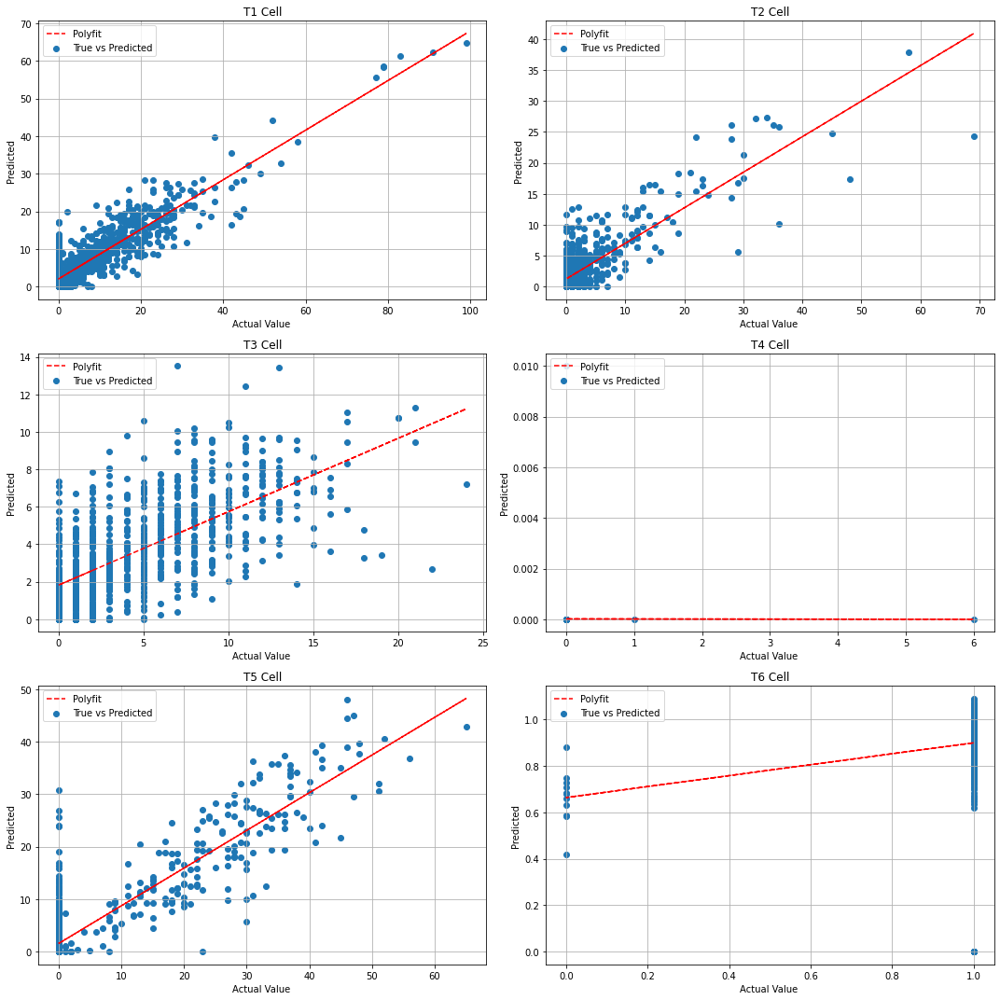

In [78]:
generate_plots(actualCells_CV3, predictedCells_CV3, CV='3')

Good RMSE scores are obtained for all cells using a CNN model with ResNet. The pearson and spearman correlation coefficients are low for T4 and T6 as they are subject to output scales and because T4 and T6 cells have a low count in all cells. Hence, RMSE is the optimal reference for model assessment. 

In [82]:
#Create dataframe for results storage
CNN_6cells_results = pd.DataFrame(columns=['Cell','TrainFold','ValidationFold','TestFold','RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

row = pd.Series({'Cell': 'T1','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t1_test_rmse, 'Pearson Correlation': cv1_6cell_t1_test_pears_corr, 'Spearman Correlation': cv1_6cell_t1_test_spearman_corr, 'R2':cv1_6cell_t1_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T1','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t1_test_rmse, 'Pearson Correlation': cv2_6cell_t1_test_pears_corr, 'Spearman Correlation': cv2_6cell_t1_test_spearman_corr, 'R2':cv2_6cell_t1_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T1','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t1_test_rmse, 'Pearson Correlation': cv3_6cell_t1_test_pears_corr, 'Spearman Correlation': cv3_6cell_t1_test_spearman_corr, 'R2':cv3_6cell_t1_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T2','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t2_test_rmse, 'Pearson Correlation': cv1_6cell_t2_test_pears_corr, 'Spearman Correlation': cv1_6cell_t2_test_spearman_corr, 'R2':cv1_6cell_t2_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T2','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t2_test_rmse, 'Pearson Correlation': cv2_6cell_t2_test_pears_corr, 'Spearman Correlation': cv2_6cell_t2_test_spearman_corr, 'R2':cv2_6cell_t2_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T2','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t2_test_rmse, 'Pearson Correlation': cv3_6cell_t2_test_pears_corr, 'Spearman Correlation': cv3_6cell_t2_test_spearman_corr, 'R2':cv3_6cell_t2_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T3','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t3_test_rmse, 'Pearson Correlation': cv1_6cell_t3_test_pears_corr, 'Spearman Correlation': cv1_6cell_t3_test_spearman_corr, 'R2':cv1_6cell_t3_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T3','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t3_test_rmse, 'Pearson Correlation': cv2_6cell_t3_test_pears_corr, 'Spearman Correlation': cv2_6cell_t3_test_spearman_corr, 'R2':cv2_6cell_t3_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T3','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t3_test_rmse, 'Pearson Correlation': cv3_6cell_t3_test_pears_corr, 'Spearman Correlation': cv3_6cell_t3_test_spearman_corr, 'R2':cv3_6cell_t3_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T4','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t4_test_rmse, 'Pearson Correlation': cv1_6cell_t4_test_pears_corr, 'Spearman Correlation': cv1_6cell_t4_test_spearman_corr, 'R2':cv1_6cell_t4_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T4','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t4_test_rmse, 'Pearson Correlation': cv2_6cell_t4_test_pears_corr, 'Spearman Correlation': cv2_6cell_t4_test_spearman_corr, 'R2':cv2_6cell_t4_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T4','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t4_test_rmse, 'Pearson Correlation': cv3_6cell_t4_test_pears_corr, 'Spearman Correlation': cv3_6cell_t4_test_spearman_corr, 'R2':cv3_6cell_t4_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T5','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t5_test_rmse, 'Pearson Correlation': cv1_6cell_t5_test_pears_corr, 'Spearman Correlation': cv1_6cell_t5_test_spearman_corr, 'R2':cv1_6cell_t5_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T5','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t5_test_rmse, 'Pearson Correlation': cv2_6cell_t5_test_pears_corr, 'Spearman Correlation': cv2_6cell_t5_test_spearman_corr, 'R2':cv2_6cell_t5_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T5','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t5_test_rmse, 'Pearson Correlation': cv3_6cell_t5_test_pears_corr, 'Spearman Correlation': cv3_6cell_t5_test_spearman_corr, 'R2':cv3_6cell_t5_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T6','TrainFold':'Fold1','ValidationFold':'Fold2','TestFold':'Fold3', 'RMSE':cv1_6cell_t6_test_rmse, 'Pearson Correlation': cv1_6cell_t6_test_pears_corr, 'Spearman Correlation': cv1_6cell_t6_test_spearman_corr, 'R2':cv1_6cell_t6_test_r_squred},name='CV1')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T6','TrainFold':'Fold1','ValidationFold':'Fold3','TestFold':'Fold2', 'RMSE':cv2_6cell_t6_test_rmse, 'Pearson Correlation': cv2_6cell_t6_test_pears_corr, 'Spearman Correlation': cv2_6cell_t6_test_spearman_corr, 'R2':cv2_6cell_t6_test_r_squred},name='CV2')
CNN_6cells_results = CNN_6cells_results.append(row)
row = pd.Series({'Cell': 'T6','TrainFold':'Fold2','ValidationFold':'Fold3','TestFold':'Fold1', 'RMSE':cv3_6cell_t6_test_rmse, 'Pearson Correlation': cv3_6cell_t6_test_pears_corr, 'Spearman Correlation': cv3_6cell_t6_test_spearman_corr, 'R2':cv3_6cell_t6_test_r_squred},name='CV3')
CNN_6cells_results = CNN_6cells_results.append(row)
CNN_6cells_results

,Cell,TrainFold,ValidationFold,TestFold,RMSE,Pearson Correlation,Spearman Correlation,R2
CV1,T1,Fold1,Fold2,Fold3,5.189950,0.898299,0.857444,0.787287
CV2,T1,Fold1,Fold3,Fold2,5.462942,0.899529,0.814461,0.797343
CV3,T1,Fold2,Fold3,Fold1,5.719331,0.899706,0.841443,0.773651
CV1,T2,Fold1,Fold2,Fold3,2.957093,0.882114,0.601215,0.677486
CV2,T2,Fold1,Fold3,Fold2,2.976060,0.872628,0.620132,0.749318
CV3,T2,Fold2,Fold3,Fold1,3.631751,0.823830,0.619674,0.662211
CV1,T3,Fold1,Fold2,Fold3,3.537601,0.624132,0.652389,0.329183
CV2,T3,Fold1,Fold3,Fold2,3.584496,0.642949,0.665993,0.312311
CV3,T3,Fold2,Fold3,Fold1,3.521234,0.655830,0.678918,0.363450
CV1,T4,Fold1,Fold2,Fold3,0.035923,-0.001292,-0.001292,-0.001392


### Summarised Results

In [150]:
all_results = pd.DataFrame(columns=['RMSE','Pearson Correlation', 'Spearman Correlation', 'R2'])

In [151]:
#OLSR
row = pd.Series({'RMSE': olsr_test_rmse, 'Pearson Correlation': olsr_test_pears_corr, 'Spearman Correlation': olsr_test_spearman_corr, 'R2':olsr_test_r_squred},name='OLS Regression')
all_results = all_results.append(row)
#MLP
row = pd.Series({'RMSE': mlp_test_rmse, 'Pearson Correlation': mlp_test_pears_corr, 'Spearman Correlation': mlp_test_spearman_corr, 'R2':mlp_test_r_squred},name='Multilayer Perceptron')
all_results = all_results.append(row)
#SVR
row = pd.Series({'RMSE': svr_test_rmse, 'Pearson Correlation': svr_test_pears_corr, 'Spearman Correlation': svr_test_spearman_corr, 'R2':svr_test_r_squred},name='Support Vector Regression')
all_results = all_results.append(row)
#CNN
row = pd.Series({'RMSE': cv1_6cell_t1_test_rmse, 'Pearson Correlation': cv1_6cell_t1_test_pears_corr, 'Spearman Correlation': cv1_6cell_t1_test_spearman_corr, 'R2':cv1_6cell_t1_test_r_squred},name='Convolutional Neural Network')
all_results = all_results.append(row)


From the results below, it can be concluded that **CNN Model** using ResNet architecture yields the best results.

In [152]:
all_results

,RMSE,Pearson Correlation,Spearman Correlation,R2
OLS Regression,8.905184,0.629362,0.592336,0.373741
Multilayer Perceptron,6.503388,0.820428,0.787673,0.665999
Support Vector Regression,7.164976,0.776404,0.746790,0.594587
Convolutional Neural Network,5.189950,0.898299,0.857444,0.787287


### Appendix 

Resnet_util library can be used by downloading the 'resnets_utils.py' python file from the following directory and saving it in the current working directory.
https://github.com/priya-dwivedi/Deep-Learning/blob/master/resnet_keras/resnets_utils.py

Kindly note that this Notebook takes around 9 hours to run.